## **INTRODUCTION**

The aim for this report is to investigate the relationship between the number of traffic collisions and weather factors in New York City.

This report has two parts:
* Part 1: Data Science - where the obtained data have been cleaned, analysed and the data for regression models have been prepared, saved, shared and uploaded.
* Part 2: Regression Models - where the Linear Regression and DNN Regression models have been trained and tested to predict the number of collisions on a particular day.

This is part one, where the data analysis will be based on the hypothesis that the number of vehicle collisions is influenced by other factors, such as weather conditions or the day of the week.

## **METHODOLOGY**

### **I. Collected data**

The data for the number of collisions and weather data have been obtained using Google Cloud Platform with access to BigQuery public data:

*   For the number of traffic collisions the New York Police Department Motor Vehicle Collisions dataset *new_york_mv_collisions* has been used. The data are available from 2012 and for the purpose of this report the data for years from 2012 to 2020 have been used.
*   For the weather data datasets created by the National Oceanic and Atmospheric Administration (NOAA) have been used. The data for years from 2012 to 2020 have been collected from *noaa_gsod* dataset for Central Park, New York (`bigquery-public-data.noaa_gsod` where the station number is stn='725060' and wban='14704'). 

Data from both sources were collected using SQL in the BigQuery editor and combined into one dataset *my_collated_data*. This dataset has been saved, downloaded and uploaded to a GitHub account for use in this report. A direct link to this raw file is [here](https://raw.githubusercontent.com/20023160uhi/20023160_Data_Analytics/main/my_collated_data.csv). 

The following SQL commands have been used to obtain the data:

**For weather data**:
```
CREATE VIEW `uhi-project-294814.assignment_guide.weather_2012_to_2020` AS

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2012` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2013` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2014` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2015` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2016` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2017` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2018` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2019` WHERE stn='725060'
union all

SELECT DATE(CAST(year as INT64), CAST(mo as INT64), CAST(da as INT64)) as date, year, mo, da, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog
FROM `bigquery-public-data.noaa_gsod.gsod2020` WHERE stn='725060'
ORDER by year, mo, da;
```
**For the number of collisions**:
```
CREATE VIEW `uhi-project-294814.assignment_guide.collision_data_count`
AS SELECT CAST(timestamp as DATE) as collision_date, COUNT(CAST(timestamp as DATE)) AS NUM_COLLISIONS
FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
GROUP BY collision_date
```
*Adding the day of the week column*:
```
CREATE VIEW `uhi-project-294814.assignment_guide.collision_data_count_final`
AS SELECT FORMAT_DATE("%u", collision_date) as day, collision_date, NUM_COLLISIONS
FROM `uhi-project-294814.assignment_guide.collision_data_count`
```
**Collating the data into a new table**:
```
CREATE TABLE `uhi-project-294814.assignment_guide.collated_collision_data`
AS SELECT day, year, mo, da, collision_date, temp, dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, NUM_COLLISIONS FROM `uhi-project-294814.assignment_guide.weather_2012_to_2020` as weather, `uhi-project-294814.assignment_guide.collision_data_count_final` as complaints WHERE complaints.collision_date = weather.date;
ORDER BY collision_date
```

The created dataset includes data in following columns:

*   **day** - day of the week number (e.g. Monday is 1, Sunday is 7). This was created and added to the collated data based on the existing data from the source data set
*   **year** - year
*   **mo** - month of the year
*   **da** - day of the month
*   **collision_date** - the date of the collision *dd/mm/yyyy* but in a *factor* data type
*   **temp** - mean temperature for the day (in Fahrenheits degrees) rounded to tenths. Missing values are showned as value *9999.9*
*   **dewp** - mean dew point for the day (in Fahrenheits degrees) rounded to tenths. Missing values are showned as value *9999.9*
*   **slp** - mean sea level pressure for the day (in Millibars) rounded to tenths. Missing values are showned as value *9999.9*
*   **visib** - mean visibility for the day (in Miles) rounded to tenths. Missing values are showned as value *999.9*
*   **wdsp** - mean wind speed for the day (in Knots) rounded to tenths. Missing values are showned as value *999.9*
*   **mxpsd** - maximum sustained wind speed for the day (in Knots) rounded to tenths. Missing values are showned as value *999.9*
*   **gust** - maximum wind gust for the day (in Knots) rounded to tenths. Missing values are showned as value *999.9*
*   **max** - maximum temperature for the day (in Fahrenheits degrees) rounded to tenths. Although, time of maximum temperature report varies by country and region. Due to that, it is worth to notice that it will not be the maximum temperature for the calendar day. Missing values are showned as value *9999.9*
*   **min** - minimum temperature for the day (in Fahrenheits degrees) rounded to tenths. Although, time of maximum temperature report varies by country and region. Due to that, it is worth to notice that it will not be the maximum temperature for the calendar day. Missing values are showned as value *9999.9*
*   **prcp** - total perticipation of rain and/or melted snow for the day (in Inches and Hundredths). Although, this will usually not end with the midnight observation (may include latter part of previous day). Values *.00* indicates no measurable precipitation (trace included). Missing values are showned as value *99.99*. It is worth to notice that many stations do not report value *0* on days with no prprecipitation
*   **sndp** - snow depth (in Inches) rounded to tenths. It is worth to notice that the most stations do not report vaulue *0* on days with no snow - they are showned as missing values with value *999.9*
*   **fog** - showned as indicators for the day where *1* means *yes* and *0* means *no* or *not reported*
*   **NUM_COLLISIONS** - the number of motor vehicle collisions that day. This was created and added to the collated data based on the existing data from the source data set


### **II. Data visualization and analysis techniques**

In the first part of the report, the data was analyzed using data visualization and statistical functions.

For data visualization, graphs using the *plot()* function built into R were used, as well as the `ggplot2` package for more advanced graphs using the *ggplot()* function, or the `lattice` package for a matrix graph (*splom()* function).

The functions built into R were used for data analysis: *cor()* - to test the correlation coefficient, *summary()* - to retrieve a data overview with their minimum value, 1st quartile value, median value, mean value, 3rd quartile value and maximum value.

Functions included in the `tidyverse` package were used to clean and manipulate the data.
The *scale()* function built into R was used to standardize the data, the detailed description of which is provided in *2. Data standardization* subsection of paragraph *IV. Data preparation for the Linear Regression Model and Deep Learning Neural Network Regression Model*.

## **RESULTS**

### **I. Quick overview of the dataset**

<p allign = "justify">Before we proceed to data analysis, it is worth checking whether the data to be analyzed should be cleaned up beforehand. In the following steps it will be checked if the missing data has been properly marked and if there are duplicate dates.

The first step is to read in the data which have been described above. This data set was saved as `csv` type of file on my GitHub account under the name *my_collated_data*. In this report is under the name ***collisions***.

In [1]:
# read in data
collisions <- read.csv("https://raw.githubusercontent.com/20023160uhi/20023160_Data_Analytics/main/my_collated_data.csv", stringsAsFactors = TRUE)

The table below shows the first six rows of the data set:

In [2]:
# see first 6 rows of the data set
head(collisions)

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,7,2012,7,1,2012-07-01,83.6,63.0,1008.9,9.7,4.1,9.9,18.1,93.0,66.0,0.00,999.9,0,538
2,1,2012,7,2,2012-07-02,80.3,54.1,1011.6,10.0,3.8,15.0,999.9,88.0,66.9,0.00,999.9,0,564
3,2,2012,7,3,2012-07-03,79.8,56.7,1012.8,10.0,2.9,12.0,999.9,88.0,63.0,0.00,999.9,0,664
4,3,2012,7,4,2012-07-04,81.8,65.6,1009.1,9.2,3.6,11.1,999.9,91.0,68.0,0.06,999.9,0,432
5,4,2012,7,5,2012-07-05,86.7,64.3,1007.4,9.4,3.8,15.0,999.9,93.9,70.0,99.99,999.9,0,591
6,5,2012,7,6,2012-07-06,81.9,62.3,1011.7,10.0,3.1,9.9,999.9,91.0,66.9,0.00,999.9,0,638


It is worth to see the summary of the data using function `summary()`

In [3]:
# summary of the data set
summary(collisions)

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2016   Median : 7.000   Median :16.00  
 Mean   :3.998   Mean   :2016   Mean   : 6.652   Mean   :15.68  
 3rd Qu.:6.000   3rd Qu.:2018   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2020   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      temp            dewp               slp       
 2014-02-28:   2   Min.   : 5.80   Min.   :   -6.70   Min.   :  989  
 2014-03-01:   2   1st Qu.:41.20   1st Qu.:   32.50   1st Qu.: 1012  
 2014-03-02:   2   Median :52.40   Median :   45.50   Median : 1017  
 2014-03-03:   2   Mean   :52.12   Mean   :   47.63   Mean   : 1190  
 2014-03-04:   2   3rd Qu.:64.50   3rd Qu.:   58.80   3rd Qu.: 1022  
 2014-03-05:   2   Max.   :86.70   Max.   : 9999.90   Max.  

<p allign = "justify">This summary allows for a first assessment of whether the data is correct or needs to be cleaned.
It looks like the data in columns listed below does not contain missing (misleading for this analysis) values: 

* day (day of the week)
* year
* mo (month)
* da (day)
* collision_date
* temp (mean temperature)
* visib (mean visibility)
* wdsp (mean wind speed)
* max (maximum temperature)
* min (minimum temperature)
* fog
* NUM_COLLISIONS

However, it can be seen that maximum values for other columns indicates that there are missing values as value *999.9*, *9999.9* or *99.9* which is described on the top of this document.

The data should be cleaned before testing the correlations. This means that the next step will be data cleaning.

### **II. Data cleaning**

#### **1. Missing values**

<p allign = "justify">The first step in data cleaning will be to change into *NA* all values described as missing in the data set description. This data appears in columns listed below as a relatively large value: 
* *9999.9* in dewp (mean dew point)
* *9999.9* in slp (mean sea level)
* *999.9* in mxpsd (maximum sustained wind)
* *999.9* in gust (maximum wind gust)
* *999.9* in sndp (snow depth)
* *99.99* in prcp (total precipitation) 

The reason for replacing bad data with *NA* is to depict the scale of the size of missing data, which are currently written as extremely large numerical values, which may cause them to be taken into account in the analysis.

In [4]:
# first let's check the data type of each column
str(collisions)

'data.frame':	3165 obs. of  18 variables:
 $ day           : int  7 1 2 3 4 5 6 7 1 2 ...
 $ year          : int  2012 2012 2012 2012 2012 2012 2012 2012 2012 2012 ...
 $ mo            : int  7 7 7 7 7 7 7 7 7 7 ...
 $ da            : int  1 2 3 4 5 6 7 8 9 10 ...
 $ collision_date: Factor w/ 3106 levels "2012-07-01","2012-07-02",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ temp          : num  83.6 80.3 79.8 81.8 86.7 81.9 84.9 80.6 78.5 76.5 ...
 $ dewp          : num  63 54.1 56.7 65.6 64.3 62.3 65.9 65.5 56.8 56.3 ...
 $ slp           : num  1009 1012 1013 1009 1007 ...
 $ visib         : num  9.7 10 10 9.2 9.4 10 9.5 8.5 10 10 ...
 $ wdsp          : num  4.1 3.8 2.9 3.6 3.8 3.1 3.1 3.1 3.5 3.4 ...
 $ mxpsd         : num  9.9 15 12 11.1 15 9.9 14 8 9.9 9.9 ...
 $ gust          : num  18.1 999.9 999.9 999.9 999.9 ...
 $ max           : num  93 88 88 91 93.9 91 95 90 84 86 ...
 $ min           : num  66 66.9 63 68 70 66.9 70 70 68 61 ...
 $ prcp          : num  0e+00 0e+00 0e+00 6e-02 1e+02 ...
 

The figure above is showing the data type of each column in the *collisions* data set.

For the purpose of data cleaning the library *`tidyverse`* will be used.

In [5]:
# load library
library(tidyverse)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.3     ✔ purrr   0.3.4
✔ tibble  3.1.0     ✔ dplyr   1.0.4
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [6]:
# changing values 9999.9 into NA for dewp and slp columns
# changing values 999.9 into NA for mxpsd, gust and sndp columns
# changing values 99.99 into NA for prcp column
# save data after cleaning as a new version of this data set: collisions_v1
collisions_v1 <- collisions %>%
   # change these 6 columns into character data type
   mutate(across(c(dewp, slp, mxpsd, gust, sndp, prcp), as.character)) %>%
   # replace 9999.9 with NA
   mutate(across(c(dewp, slp), str_replace, pattern = "9999.9", replacement = NA_character_)) %>%
   # replace 999.9 with NA
   mutate(across(c(mxpsd, gust, sndp), str_replace, pattern = "999.9", replacement = NA_character_)) %>%
   # replace 99.99 with NA
   mutate(across(prcp, str_replace, pattern = "99.99", replacement = NA_character_)) %>%
   # change these 4 columns into numeric again 
   mutate(across(c(dewp, slp, mxpsd, gust, sndp, prcp), as.numeric)) 

It is worth to see how the data looks like with NA instead of misleading values. The below shows the first six rows of data set and the summary of the altered data. 

In [7]:
# see first 6 rows of the altered data set
head(collisions_v1)

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,7,2012,7,1,2012-07-01,83.6,63.0,1008.9,9.7,4.1,9.9,18.1,93.0,66.0,0.00,NA,0,538
2,1,2012,7,2,2012-07-02,80.3,54.1,1011.6,10.0,3.8,15.0,NA,88.0,66.9,0.00,NA,0,564
3,2,2012,7,3,2012-07-03,79.8,56.7,1012.8,10.0,2.9,12.0,NA,88.0,63.0,0.00,NA,0,664
4,3,2012,7,4,2012-07-04,81.8,65.6,1009.1,9.2,3.6,11.1,NA,91.0,68.0,0.06,NA,0,432
5,4,2012,7,5,2012-07-05,86.7,64.3,1007.4,9.4,3.8,15.0,NA,93.9,70.0,NA,NA,0,591
6,5,2012,7,6,2012-07-06,81.9,62.3,1011.7,10.0,3.1,9.9,NA,91.0,66.9,0.00,NA,0,638


In [8]:
# summary of the altered data set
summary(collisions_v1)

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2016   Median : 7.000   Median :16.00  
 Mean   :3.998   Mean   :2016   Mean   : 6.652   Mean   :15.68  
 3rd Qu.:6.000   3rd Qu.:2018   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2020   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      temp            dewp            slp      
 2014-02-28:   2   Min.   : 5.80   Min.   :-6.70   Min.   : 989  
 2014-03-01:   2   1st Qu.:41.20   1st Qu.:32.50   1st Qu.:1012  
 2014-03-02:   2   Median :52.40   Median :45.45   Median :1017  
 2014-03-03:   2   Mean   :52.12   Mean   :44.49   Mean   :1017  
 2014-03-04:   2   3rd Qu.:64.50   3rd Qu.:58.80   3rd Qu.:1022  
 2014-03-05:   2   Max.   :86.70   Max.   :74.10   Max.   :1044  
 (Other)   :3153  

<p allign = "justify">In comparision to the summary of the original data there is a significant change in maximum values for dewp, slp, mxpsd, gust, sndp and prcp columns.

The number of missing values are showned this time for each column. It is worth to emphasize that in sndp column almost all records are missing data. For gust column NAs are the one-third of all data contains in this column.

For this reason, it should be considered whether these sndp and gust data should be taking into account for the analysis.

#### **2. Duplicates**

The subset *duplicates_date* has been created with collision dates which are duplicated:

In [9]:
# count the number of duplicated date
duplicates_date <- collisions_v1 %>%
  select(collision_date) %>%
  group_by(collision_date) %>%
  summarise(duplicates = n()) %>%
  filter(duplicates >= 2) %>%
  arrange(desc(duplicates)) # order by date


In [10]:
duplicates_date

collision_date,duplicates
<fct>,<int>
2014-02-28,2
2014-03-01,2
2014-03-02,2
2014-03-03,2
2014-03-04,2
2014-03-05,2
2014-03-06,2
2014-03-11,2
2014-03-12,2


In [11]:
count(duplicates_date)

n
<int>
59


There are 59 dates duplicated in the data set. It might be worth to see whole rows for duplicated dates.

In [12]:
duplicates_date_full_rows <- collisions_v1 %>%
  filter(collision_date %in% c("2014-02-28",
        "2014-03-01", "2014-03-02", "2014-03-03", "2014-03-04", "2014-03-05", "2014-03-06", "2014-03-11", "2014-03-12", "2014-03-13", "2014-03-14", "2014-03-15", "2014-03-16", "2014-03-17", "2014-03-18", "2014-03-19", "2014-03-20", "2014-03-26", "2014-03-27", "2014-03-28", "2014-03-29", "2014-03-30",
        "2014-04-01", "2014-04-02", "2014-04-03", "2014-04-04", "2014-04-05", "2014-04-06", "2014-04-07", "2014-04-08", "2014-04-25", "2014-04-26", "2014-04-28", "2014-04-29", "2014-04-30",
        "2014-05-01", "2014-05-02", "2014-05-03", "2014-05-04", "2014-05-05", "2014-05-06", "2014-05-07", "2014-05-08", "2014-05-09", "2014-05-10", "2014-05-11", "2014-05-12", "2014-05-13", "2014-05-14", "2014-05-30", "2014-05-31",
        "2014-06-03", "2014-06-04", "2014-06-05", "2014-06-06", "2014-06-07", "2014-06-08", "2014-06-09", "2014-06-10"))

In [13]:
# see the first half of duplicates_date_full_rows
duplicates_date_full_rows[1:59,]

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,5,2014,2,28,2014-02-28,18.1,-2.6,NA,9.8,11.4,22.0,28.9,24.8,8.6,NA,NA,0,655
2,5,2014,2,28,2014-02-28,20.3,0.3,1020.5,9.6,12.5,24.1,33.0,28.0,14.0,0.00,NA,0,655
3,6,2014,3,1,2014-03-01,24.1,12.5,1029.1,10.0,5.2,11.1,NA,35.1,12.0,0.00,NA,0,497
4,6,2014,3,1,2014-03-01,19.8,8.7,NA,10.0,5.0,15.9,20.0,35.6,5.0,0.00,NA,0,497
5,7,2014,3,2,2014-03-02,33.5,28.1,NA,9.8,7.6,11.1,NA,37.4,32.0,0.00,NA,0,344
6,7,2014,3,2,2014-03-02,35.1,28.8,1018.5,9.1,6.8,15.0,21.0,39.9,30.9,0.00,NA,0,344
7,1,2014,3,3,2014-03-03,20.5,3.9,NA,9.1,7.6,13.0,21.0,21.2,19.4,NA,NA,0,440
8,1,2014,3,3,2014-03-03,27.3,20.3,1017.2,5.8,11.2,25.1,32.1,33.8,21.0,0.00,NA,1,440
9,2,2014,3,4,2014-03-04,18.9,2.4,NA,10.0,6.2,11.1,NA,30.2,8.6,0.00,NA,0,532


In [14]:
# see the second half of duplicates_date_full_rows
duplicates_date_full_rows[59:118,]

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
59,2,2014,4,8,2014-04-08,49.4,48.4,NA,3.1,15.1,22.9,33.0,59.0,46.4,NA,NA,1,606
60,2,2014,4,8,2014-04-08,47.7,45.8,1003.5,1.9,14.7,22.9,29.9,52.0,44.1,0.70,NA,1,606
61,5,2014,4,25,2014-04-25,49.4,27.5,NA,10.0,8.8,11.1,20.0,51.8,46.4,0.00,NA,0,617
62,5,2014,4,25,2014-04-25,49.0,32.3,1013.4,10.0,10.5,15.9,22.9,57.0,43.0,0.00,NA,0,617
63,6,2014,4,26,2014-04-26,45.1,39.2,NA,8.3,8.7,11.1,17.1,46.4,44.6,0.00,NA,0,548
64,6,2014,4,26,2014-04-26,44.9,36.6,1009.1,9.4,12.2,18.1,26.0,55.0,42.1,0.00,NA,0,548
65,1,2014,4,28,2014-04-28,44.9,36.7,NA,10.0,9.3,15.9,27.0,53.6,37.4,0.00,NA,0,597
66,1,2014,4,28,2014-04-28,46.5,37.2,1016.1,10.0,13.7,20.0,24.1,52.0,41.0,0.01,NA,0,597
67,2,2014,4,29,2014-04-29,44.4,36.7,NA,9.8,13.6,19.0,28.0,55.4,41.0,0.00,NA,0,555


The differences can be noticed between the values for the same date in columns:
* temp
* dewp
* visib
* wdsp
* mxpsd
* gust
* max
* min
* prcp

However, the data in day, year, mo, da, fog and NUM_COLLISIONS are the same for duplicates.

Worth to notice is data for slp column, where for duplicated date one row contains the value and the second one contains NA.

This might be a good pattern to decide which rows should be removed.


In [15]:
# create the subset with rows to delete
duplicates_date_full_rows_where_slp_is_NA <- duplicates_date_full_rows %>%
  filter(slp %in% NA)
# remove rows from collisions_v1 using anti_join() function and save the cleaned data as a new version of dataset: collisions_v2
collisions_v2 <- anti_join(collisions_v1, duplicates_date_full_rows_where_slp_is_NA)


Joining, by = c("day", "year", "mo", "da", "collision_date", "temp", "dewp", "slp", "visib", "wdsp", "mxpsd", "gust", "max", "min", "prcp", "sndp", "fog", "NUM_COLLISIONS")



In [16]:
# check that we cleaned the data from duplicated dates
# count the number of duplicated date
check_1 <- collisions_v2 %>%
  select(collision_date) %>%
  group_by(collision_date) %>%
  summarise(duplicates = n()) %>%
  filter(duplicates >= 2) %>%
  arrange(desc(duplicates)) # order by date 
# print the output
check_1

collision_date,duplicates
<fct>,<int>


There is no duplicated dates in the cleaned dataset.

In [17]:
# count the number of rows in cleaned data set
count(collisions_v2)

n
<int>
3106


Before cleaning there were 3165 rows in dataset. After cleaning from duplicates we have 3106 - this confirms that 59 rows has been removed.
The dataset is ready for analysis. 

### **III. Data analysis**

In this section, individual parameters will be visualized that may affect the number of collisions. It will be presented in charts for the entire period (2012-2020) as well as for individual years separately.

For this reason, the data need to be splitted for each year. The below shows the collision dates for years between 2012 and 2020 for each year - data has been saved as a subset as well. 

In [18]:
# collisions_v2 data for 2012 
collisions_v2$collision_date[0:184]
# save this year as a subset
collisions_v2_2012 <- collisions_v2[which(collisions_v2$year == 2012), ]

[1] 2012-07-01 2012-07-02 2012-07-03 2012-07-04 2012-07-05 2012-07-06
  [7] 2012-07-07 2012-07-08 2012-07-09 2012-07-10 2012-07-11 2012-07-12
 [13] 2012-07-13 2012-07-14 2012-07-15 2012-07-16 2012-07-17 2012-07-18
 [19] 2012-07-19 2012-07-20 2012-07-21 2012-07-22 2012-07-23 2012-07-24
 [25] 2012-07-25 2012-07-26 2012-07-27 2012-07-28 2012-07-29 2012-07-30
 [31] 2012-07-31 2012-08-01 2012-08-02 2012-08-03 2012-08-04 2012-08-05
 [37] 2012-08-06 2012-08-07 2012-08-08 2012-08-09 2012-08-10 2012-08-11
 [43] 2012-08-12 2012-08-13 2012-08-14 2012-08-15 2012-08-16 2012-08-17
 [49] 2012-08-18 2012-08-19 2012-08-20 2012-08-21 2012-08-22 2012-08-23
 [55] 2012-08-24 2012-08-25 2012-08-26 2012-08-27 2012-08-28 2012-08-29
 [61] 2012-08-30 2012-08-31 2012-09-01 2012-09-02 2012-09-03 2012-09-04
 [67] 2012-09-05 2012-09-06 2012-09-07 2012-09-08 2012-09-09 2012-09-10
 [73] 2012-09-11 2012-09-12 2012-09-13 2012-09-14 2012-09-15 2012-09-16
 [79] 2012-09-17 2012-09-18 2012-09-19 2012-09-20 2012-09-21 2012-09-22
 [85] 2012-09-23 2012-09-24 2012-09-25 2012-09-26 2012-09-27 2012-09-28
 [91] 2012-09-29 2012-09-30 2012-10-01 2012-10-02 2012-10-03 2012-10-04
 [97] 2012-10-05 2012-10-06 2012-10-07 2012-10-08 2012-10-09 2012-10-10
[103] 2012-10-11 2012-10-12 2012-10-13 2012-10-14 2012-10-15 2012-10-16
[109] 2012-10-17 2012-10-18 2012-10-19 2012-10-20 2012-10-21 2012-10-22
[115] 2012-10-23 2012-10-24 2012-10-25 2012-10-26 2012-10-27 2012-10-28
[121] 2012-10-29 2012-10-30 2012-10-31 2012-11-01 2012-11-02 2012-11-03
[127] 2012-11-04 2012-11-05 2012-11-06 2012-11-07 2012-11-08 2012-11-09
[133] 2012-11-10 2012-11-11 2012-11-12 2012-11-13 2012-11-14 2012-11-15
[139] 2012-11-16 2012-11-17 2012-11-18 2012-11-19 2012-11-20 2012-11-21
[145] 2012-11-22 2012-11-23 2012-11-24 2012-11-25 2012-11-26 2012-11-27
[151] 2012-11-28 2012-11-29 2012-11-30 2012-12-01 2012-12-02 2012-12-03
[157] 2012-12-04 2012-12-05 2012-12-06 2012-12-07 2012-12-08 2012-12-09
[163] 2012-12-10 2012-12-11 2012-12-12 2012-12-13 2012-12-14 2012-12-15
[169] 2012-12-16 2012-12-17 2012-12-18 2012-12-19 2012-12-20 2012-12-21
[175] 2012-12-22 2012-12-23 2012-12-24 2012-12-25 2012-12-26 2012-12-27
[181] 2012-12-28 2012-12-29 2012-12-30 2012-12-31
3106 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-12-31

In [19]:
# collisions_v2 data for 2013
collisions_v2$collision_date[185:549]
# save this year as a subset
collisions_v2_2013 <- collisions_v2[which(collisions_v2$year == 2013), ]

[1] 2013-01-01 2013-01-02 2013-01-03 2013-01-04 2013-01-05 2013-01-06
  [7] 2013-01-07 2013-01-08 2013-01-09 2013-01-10 2013-01-11 2013-01-12
 [13] 2013-01-13 2013-01-14 2013-01-15 2013-01-16 2013-01-17 2013-01-18
 [19] 2013-01-19 2013-01-20 2013-01-21 2013-01-22 2013-01-23 2013-01-24
 [25] 2013-01-25 2013-01-26 2013-01-27 2013-01-28 2013-01-29 2013-01-30
 [31] 2013-01-31 2013-02-01 2013-02-02 2013-02-03 2013-02-04 2013-02-05
 [37] 2013-02-06 2013-02-07 2013-02-08 2013-02-09 2013-02-10 2013-02-11
 [43] 2013-02-12 2013-02-13 2013-02-14 2013-02-15 2013-02-16 2013-02-17
 [49] 2013-02-18 2013-02-19 2013-02-20 2013-02-21 2013-02-22 2013-02-23
 [55] 2013-02-24 2013-02-25 2013-02-26 2013-02-27 2013-02-28 2013-03-01
 [61] 2013-03-02 2013-03-03 2013-03-04 2013-03-05 2013-03-06 2013-03-07
 [67] 2013-03-08 2013-03-09 2013-03-10 2013-03-11 2013-03-12 2013-03-13
 [73] 2013-03-14 2013-03-15 2013-03-16 2013-03-17 2013-03-18 2013-03-19
 [79] 2013-03-20 2013-03-21 2013-03-22 2013-03-23 2013-03-24 2013-03-25
 [85] 2013-03-26 2013-03-27 2013-03-28 2013-03-29 2013-03-30 2013-03-31
 [91] 2013-04-01 2013-04-02 2013-04-03 2013-04-04 2013-04-05 2013-04-06
 [97] 2013-04-07 2013-04-08 2013-04-09 2013-04-10 2013-04-11 2013-04-12
[103] 2013-04-13 2013-04-14 2013-04-15 2013-04-16 2013-04-17 2013-04-18
[109] 2013-04-19 2013-04-20 2013-04-21 2013-04-22 2013-04-23 2013-04-24
[115] 2013-04-25 2013-04-26 2013-04-27 2013-04-28 2013-04-29 2013-04-30
[121] 2013-05-01 2013-05-02 2013-05-03 2013-05-04 2013-05-05 2013-05-06
[127] 2013-05-07 2013-05-08 2013-05-09 2013-05-10 2013-05-11 2013-05-12
[133] 2013-05-13 2013-05-14 2013-05-15 2013-05-16 2013-05-17 2013-05-18
[139] 2013-05-19 2013-05-20 2013-05-21 2013-05-22 2013-05-23 2013-05-24
[145] 2013-05-25 2013-05-26 2013-05-27 2013-05-28 2013-05-29 2013-05-30
[151] 2013-05-31 2013-06-01 2013-06-02 2013-06-03 2013-06-04 2013-06-05
[157] 2013-06-06 2013-06-07 2013-06-08 2013-06-09 2013-06-10 2013-06-11
[163] 2013-06-12 2013-06-13 2013-06-14 2013-06-15 2013-06-16 2013-06-17
[169] 2013-06-18 2013-06-19 2013-06-20 2013-06-21 2013-06-22 2013-06-23
[175] 2013-06-24 2013-06-25 2013-06-26 2013-06-27 2013-06-28 2013-06-29
[181] 2013-06-30 2013-07-01 2013-07-02 2013-07-03 2013-07-04 2013-07-05
[187] 2013-07-06 2013-07-07 2013-07-08 2013-07-09 2013-07-10 2013-07-11
[193] 2013-07-12 2013-07-13 2013-07-14 2013-07-15 2013-07-16 2013-07-17
[199] 2013-07-18 2013-07-19 2013-07-20 2013-07-21 2013-07-22 2013-07-23
[205] 2013-07-24 2013-07-25 2013-07-26 2013-07-27 2013-07-28 2013-07-29
[211] 2013-07-30 2013-07-31 2013-08-01 2013-08-02 2013-08-03 2013-08-04
[217] 2013-08-05 2013-08-06 2013-08-07 2013-08-08 2013-08-09 2013-08-10
[223] 2013-08-11 2013-08-12 2013-08-13 2013-08-14 2013-08-15 2013-08-16
[229] 2013-08-17 2013-08-18 2013-08-19 2013-08-20 2013-08-21 2013-08-22
[235] 2013-08-23 2013-08-24 2013-08-25 2013-08-26 2013-08-27 2013-08-28
[241] 2013-08-29 2013-08-30 2013-08-31 2013-09-01 2013-09-02 2013-09-03
[247] 2013-09-04 2013-09-05 2013-09-06 2013-09-07 2013-09-08 2013-09-09
[253] 2013-09-10 2013-09-11 2013-09-12 2013-09-13 2013-09-14 2013-09-15
[259] 2013-09-16 2013-09-17 2013-09-18 2013-09-19 2013-09-20 2013-09-21
[265] 2013-09-22 2013-09-23 2013-09-24 2013-09-25 2013-09-26 2013-09-27
[271] 2013-09-28 2013-09-29 2013-09-30 2013-10-01 2013-10-02 2013-10-03
[277] 2013-10-04 2013-10-05 2013-10-06 2013-10-07 2013-10-08 2013-10-09
[283] 2013-10-10 2013-10-11 2013-10-12 2013-10-13 2013-10-14 2013-10-15
[289] 2013-10-16 2013-10-17 2013-10-18 2013-10-19 2013-10-20 2013-10-21
[295] 2013-10-22 2013-10-23 2013-10-24 2013-10-25 2013-10-26 2013-10-27
[301] 2013-10-28 2013-10-29 2013-10-30 2013-10-31 2013-11-01 2013-11-02
[307] 2013-11-03 2013-11-04 2013-11-05 2013-11-06 2013-11-07 2013-11-08
[313] 2013-11-09 2013-11-10 2013-11-11 2013-11-12 2013-11-13 2013-11-14
[319] 2013-11-15 2013-11-16 2013-11-17 2013-11-18 2013-11-19 2013-11-20
[325] 2013-11-21 2013-11-22 2013-11-23 2013-11-24 2013-11-25 2013-11-26
[331] 2013-11-27 2013-11-28 2013-11-29 201

In [20]:
# collisions_v2 data for 2014
collisions_v2$collision_date[550:914]
# save this year as a subset
collisions_v2_2014 <- collisions_v2[which(collisions_v2$year == 2014), ]

[1] 2014-01-01 2014-01-02 2014-01-03 2014-01-04 2014-01-05 2014-01-06
  [7] 2014-01-07 2014-01-08 2014-01-09 2014-01-10 2014-01-11 2014-01-12
 [13] 2014-01-13 2014-01-14 2014-01-15 2014-01-16 2014-01-17 2014-01-18
 [19] 2014-01-19 2014-01-20 2014-01-21 2014-01-22 2014-01-23 2014-01-24
 [25] 2014-01-25 2014-01-26 2014-01-27 2014-01-28 2014-01-29 2014-01-30
 [31] 2014-01-31 2014-02-01 2014-02-02 2014-02-03 2014-02-04 2014-02-05
 [37] 2014-02-06 2014-02-07 2014-02-08 2014-02-09 2014-02-10 2014-02-11
 [43] 2014-02-12 2014-02-13 2014-02-14 2014-02-15 2014-02-16 2014-02-17
 [49] 2014-02-18 2014-02-19 2014-02-20 2014-02-21 2014-02-22 2014-02-23
 [55] 2014-02-24 2014-02-25 2014-02-26 2014-02-27 2014-02-28 2014-03-01
 [61] 2014-03-02 2014-03-03 2014-03-04 2014-03-05 2014-03-06 2014-03-07
 [67] 2014-03-08 2014-03-09 2014-03-10 2014-03-11 2014-03-12 2014-03-13
 [73] 2014-03-14 2014-03-15 2014-03-16 2014-03-17 2014-03-18 2014-03-19
 [79] 2014-03-20 2014-03-21 2014-03-22 2014-03-23 2014-03-24 2014-03-25
 [85] 2014-03-26 2014-03-27 2014-03-28 2014-03-29 2014-03-30 2014-03-31
 [91] 2014-04-01 2014-04-02 2014-04-03 2014-04-04 2014-04-05 2014-04-06
 [97] 2014-04-07 2014-04-08 2014-04-09 2014-04-10 2014-04-11 2014-04-12
[103] 2014-04-13 2014-04-14 2014-04-15 2014-04-16 2014-04-17 2014-04-18
[109] 2014-04-19 2014-04-20 2014-04-21 2014-04-22 2014-04-23 2014-04-24
[115] 2014-04-25 2014-04-26 2014-04-27 2014-04-28 2014-04-29 2014-04-30
[121] 2014-05-01 2014-05-02 2014-05-03 2014-05-04 2014-05-05 2014-05-06
[127] 2014-05-07 2014-05-08 2014-05-09 2014-05-10 2014-05-11 2014-05-12
[133] 2014-05-13 2014-05-14 2014-05-15 2014-05-16 2014-05-17 2014-05-18
[139] 2014-05-19 2014-05-20 2014-05-21 2014-05-22 2014-05-23 2014-05-24
[145] 2014-05-25 2014-05-26 2014-05-27 2014-05-28 2014-05-29 2014-05-30
[151] 2014-05-31 2014-06-01 2014-06-02 2014-06-03 2014-06-04 2014-06-05
[157] 2014-06-06 2014-06-07 2014-06-08 2014-06-09 2014-06-10 2014-06-11
[163] 2014-06-12 2014-06-13 2014-06-14 2014-06-15 2014-06-16 2014-06-17
[169] 2014-06-18 2014-06-19 2014-06-20 2014-06-21 2014-06-22 2014-06-23
[175] 2014-06-24 2014-06-25 2014-06-26 2014-06-27 2014-06-28 2014-06-29
[181] 2014-06-30 2014-07-01 2014-07-02 2014-07-03 2014-07-04 2014-07-05
[187] 2014-07-06 2014-07-07 2014-07-08 2014-07-09 2014-07-10 2014-07-11
[193] 2014-07-12 2014-07-13 2014-07-14 2014-07-15 2014-07-16 2014-07-17
[199] 2014-07-18 2014-07-19 2014-07-20 2014-07-21 2014-07-22 2014-07-23
[205] 2014-07-24 2014-07-25 2014-07-26 2014-07-27 2014-07-28 2014-07-29
[211] 2014-07-30 2014-07-31 2014-08-01 2014-08-02 2014-08-03 2014-08-04
[217] 2014-08-05 2014-08-06 2014-08-07 2014-08-08 2014-08-09 2014-08-10
[223] 2014-08-11 2014-08-12 2014-08-13 2014-08-14 2014-08-15 2014-08-16
[229] 2014-08-17 2014-08-18 2014-08-19 2014-08-20 2014-08-21 2014-08-22
[235] 2014-08-23 2014-08-24 2014-08-25 2014-08-26 2014-08-27 2014-08-28
[241] 2014-08-29 2014-08-30 2014-08-31 2014-09-01 2014-09-02 2014-09-03
[247] 2014-09-04 2014-09-05 2014-09-06 2014-09-07 2014-09-08 2014-09-09
[253] 2014-09-10 2014-09-11 2014-09-12 2014-09-13 2014-09-14 2014-09-15
[259] 2014-09-16 2014-09-17 2014-09-18 2014-09-19 2014-09-20 2014-09-21
[265] 2014-09-22 2014-09-23 2014-09-24 2014-09-25 2014-09-26 2014-09-27
[271] 2014-09-28 2014-09-29 2014-09-30 2014-10-01 2014-10-02 2014-10-03
[277] 2014-10-04 2014-10-05 2014-10-06 2014-10-07 2014-10-08 2014-10-09
[283] 2014-10-10 2014-10-11 2014-10-12 2014-10-13 2014-10-14 2014-10-15
[289] 2014-10-16 2014-10-17 2014-10-18 2014-10-19 2014-10-20 2014-10-21
[295] 2014-10-22 2014-10-23 2014-10-24 2014-10-25 2014-10-26 2014-10-27
[301] 2014-10-28 2014-10-29 2014-10-30 2014-10-31 2014-11-01 2014-11-02
[307] 2014-11-03 2014-11-04 2014-11-05 2014-11-06 2014-11-07 2014-11-08
[313] 2014-11-09 2014-11-10 2014-11-11 2014-11-12 2014-11-13 2014-11-14
[319] 2014-11-15 2014-11-16 2014-11-17 2014-11-18 2014-11-19 2014-11-20
[325] 2014-11-21 2014-11-22 2014-11-23 2014-11-24 2014-11-25 2014-11-26
[331] 2014-11-27 2014-11-28 2014-11-29 201

In [21]:
# collisions_v2 data for 2015
collisions_v2$collision_date[915:1279]
# save this year as a subset
collisions_v2_2015 <- collisions_v2[which(collisions_v2$year == 2015), ]

[1] 2015-01-01 2015-01-02 2015-01-03 2015-01-04 2015-01-05 2015-01-06
  [7] 2015-01-07 2015-01-08 2015-01-09 2015-01-10 2015-01-11 2015-01-12
 [13] 2015-01-13 2015-01-14 2015-01-15 2015-01-16 2015-01-17 2015-01-18
 [19] 2015-01-19 2015-01-20 2015-01-21 2015-01-22 2015-01-23 2015-01-24
 [25] 2015-01-25 2015-01-26 2015-01-27 2015-01-28 2015-01-29 2015-01-30
 [31] 2015-01-31 2015-02-01 2015-02-02 2015-02-03 2015-02-04 2015-02-05
 [37] 2015-02-06 2015-02-07 2015-02-08 2015-02-09 2015-02-10 2015-02-11
 [43] 2015-02-12 2015-02-13 2015-02-14 2015-02-15 2015-02-16 2015-02-17
 [49] 2015-02-18 2015-02-19 2015-02-20 2015-02-21 2015-02-22 2015-02-23
 [55] 2015-02-24 2015-02-25 2015-02-26 2015-02-27 2015-02-28 2015-03-01
 [61] 2015-03-02 2015-03-03 2015-03-04 2015-03-05 2015-03-06 2015-03-07
 [67] 2015-03-08 2015-03-09 2015-03-10 2015-03-11 2015-03-12 2015-03-13
 [73] 2015-03-14 2015-03-15 2015-03-16 2015-03-17 2015-03-18 2015-03-19
 [79] 2015-03-20 2015-03-21 2015-03-22 2015-03-23 2015-03-24 2015-03-25
 [85] 2015-03-26 2015-03-27 2015-03-28 2015-03-29 2015-03-30 2015-03-31
 [91] 2015-04-01 2015-04-02 2015-04-03 2015-04-04 2015-04-05 2015-04-06
 [97] 2015-04-07 2015-04-08 2015-04-09 2015-04-10 2015-04-11 2015-04-12
[103] 2015-04-13 2015-04-14 2015-04-15 2015-04-16 2015-04-17 2015-04-18
[109] 2015-04-19 2015-04-20 2015-04-21 2015-04-22 2015-04-23 2015-04-24
[115] 2015-04-25 2015-04-26 2015-04-27 2015-04-28 2015-04-29 2015-04-30
[121] 2015-05-01 2015-05-02 2015-05-03 2015-05-04 2015-05-05 2015-05-06
[127] 2015-05-07 2015-05-08 2015-05-09 2015-05-10 2015-05-11 2015-05-12
[133] 2015-05-13 2015-05-14 2015-05-15 2015-05-16 2015-05-17 2015-05-18
[139] 2015-05-19 2015-05-20 2015-05-21 2015-05-22 2015-05-23 2015-05-24
[145] 2015-05-25 2015-05-26 2015-05-27 2015-05-28 2015-05-29 2015-05-30
[151] 2015-05-31 2015-06-01 2015-06-02 2015-06-03 2015-06-04 2015-06-05
[157] 2015-06-06 2015-06-07 2015-06-08 2015-06-09 2015-06-10 2015-06-11
[163] 2015-06-12 2015-06-13 2015-06-14 2015-06-15 2015-06-16 2015-06-17
[169] 2015-06-18 2015-06-19 2015-06-20 2015-06-21 2015-06-22 2015-06-23
[175] 2015-06-24 2015-06-25 2015-06-26 2015-06-27 2015-06-28 2015-06-29
[181] 2015-06-30 2015-07-01 2015-07-02 2015-07-03 2015-07-04 2015-07-05
[187] 2015-07-06 2015-07-07 2015-07-08 2015-07-09 2015-07-10 2015-07-11
[193] 2015-07-12 2015-07-13 2015-07-14 2015-07-15 2015-07-16 2015-07-17
[199] 2015-07-18 2015-07-19 2015-07-20 2015-07-21 2015-07-22 2015-07-23
[205] 2015-07-24 2015-07-25 2015-07-26 2015-07-27 2015-07-28 2015-07-29
[211] 2015-07-30 2015-07-31 2015-08-01 2015-08-02 2015-08-03 2015-08-04
[217] 2015-08-05 2015-08-06 2015-08-07 2015-08-08 2015-08-09 2015-08-10
[223] 2015-08-11 2015-08-12 2015-08-13 2015-08-14 2015-08-15 2015-08-16
[229] 2015-08-17 2015-08-18 2015-08-19 2015-08-20 2015-08-21 2015-08-22
[235] 2015-08-23 2015-08-24 2015-08-25 2015-08-26 2015-08-27 2015-08-28
[241] 2015-08-29 2015-08-30 2015-08-31 2015-09-01 2015-09-02 2015-09-03
[247] 2015-09-04 2015-09-05 2015-09-06 2015-09-07 2015-09-08 2015-09-09
[253] 2015-09-10 2015-09-11 2015-09-12 2015-09-13 2015-09-14 2015-09-15
[259] 2015-09-16 2015-09-17 2015-09-18 2015-09-19 2015-09-20 2015-09-21
[265] 2015-09-22 2015-09-23 2015-09-24 2015-09-25 2015-09-26 2015-09-27
[271] 2015-09-28 2015-09-29 2015-09-30 2015-10-01 2015-10-02 2015-10-03
[277] 2015-10-04 2015-10-05 2015-10-06 2015-10-07 2015-10-08 2015-10-09
[283] 2015-10-10 2015-10-11 2015-10-12 2015-10-13 2015-10-14 2015-10-15
[289] 2015-10-16 2015-10-17 2015-10-18 2015-10-19 2015-10-20 2015-10-21
[295] 2015-10-22 2015-10-23 2015-10-24 2015-10-25 2015-10-26 2015-10-27
[301] 2015-10-28 2015-10-29 2015-10-30 2015-10-31 2015-11-01 2015-11-02
[307] 2015-11-03 2015-11-04 2015-11-05 2015-11-06 2015-11-07 2015-11-08
[313] 2015-11-09 2015-11-10 2015-11-11 2015-11-12 2015-11-13 2015-11-14
[319] 2015-11-15 2015-11-16 2015-11-17 2015-11-18 2015-11-19 2015-11-20
[325] 2015-11-21 2015-11-22 2015-11-23 2015-11-24 2015-11-25 2015-11-26
[331] 2015-11-27 2015-11-28 2015-11-29 201

In [22]:
# collisions_v2 data for 2016 - leap year
collisions_v2$collision_date[1280:1645]
# save this year as a subset
collisions_v2_2016 <- collisions_v2[which(collisions_v2$year == 2016), ]

[1] 2016-01-01 2016-01-02 2016-01-03 2016-01-04 2016-01-05 2016-01-06
  [7] 2016-01-07 2016-01-08 2016-01-09 2016-01-10 2016-01-11 2016-01-12
 [13] 2016-01-13 2016-01-14 2016-01-15 2016-01-16 2016-01-17 2016-01-18
 [19] 2016-01-19 2016-01-20 2016-01-21 2016-01-22 2016-01-23 2016-01-24
 [25] 2016-01-25 2016-01-26 2016-01-27 2016-01-28 2016-01-29 2016-01-30
 [31] 2016-01-31 2016-02-01 2016-02-02 2016-02-03 2016-02-04 2016-02-05
 [37] 2016-02-06 2016-02-07 2016-02-08 2016-02-09 2016-02-10 2016-02-11
 [43] 2016-02-12 2016-02-13 2016-02-14 2016-02-15 2016-02-16 2016-02-17
 [49] 2016-02-18 2016-02-19 2016-02-20 2016-02-21 2016-02-22 2016-02-23
 [55] 2016-02-24 2016-02-25 2016-02-26 2016-02-27 2016-02-28 2016-02-29
 [61] 2016-03-01 2016-03-02 2016-03-03 2016-03-04 2016-03-05 2016-03-06
 [67] 2016-03-07 2016-03-08 2016-03-09 2016-03-10 2016-03-11 2016-03-12
 [73] 2016-03-13 2016-03-14 2016-03-15 2016-03-16 2016-03-17 2016-03-18
 [79] 2016-03-19 2016-03-20 2016-03-21 2016-03-22 2016-03-23 2016-03-24
 [85] 2016-03-25 2016-03-26 2016-03-27 2016-03-28 2016-03-29 2016-03-30
 [91] 2016-03-31 2016-04-01 2016-04-02 2016-04-03 2016-04-04 2016-04-05
 [97] 2016-04-06 2016-04-07 2016-04-08 2016-04-09 2016-04-10 2016-04-11
[103] 2016-04-12 2016-04-13 2016-04-14 2016-04-15 2016-04-16 2016-04-17
[109] 2016-04-18 2016-04-19 2016-04-20 2016-04-21 2016-04-22 2016-04-23
[115] 2016-04-24 2016-04-25 2016-04-26 2016-04-27 2016-04-28 2016-04-29
[121] 2016-04-30 2016-05-01 2016-05-02 2016-05-03 2016-05-04 2016-05-05
[127] 2016-05-06 2016-05-07 2016-05-08 2016-05-09 2016-05-10 2016-05-11
[133] 2016-05-12 2016-05-13 2016-05-14 2016-05-15 2016-05-16 2016-05-17
[139] 2016-05-18 2016-05-19 2016-05-20 2016-05-21 2016-05-22 2016-05-23
[145] 2016-05-24 2016-05-25 2016-05-26 2016-05-27 2016-05-28 2016-05-29
[151] 2016-05-30 2016-05-31 2016-06-01 2016-06-02 2016-06-03 2016-06-04
[157] 2016-06-05 2016-06-06 2016-06-07 2016-06-08 2016-06-09 2016-06-10
[163] 2016-06-11 2016-06-12 2016-06-13 2016-06-14 2016-06-15 2016-06-16
[169] 2016-06-17 2016-06-18 2016-06-19 2016-06-20 2016-06-21 2016-06-22
[175] 2016-06-23 2016-06-24 2016-06-25 2016-06-26 2016-06-27 2016-06-28
[181] 2016-06-29 2016-06-30 2016-07-01 2016-07-02 2016-07-03 2016-07-04
[187] 2016-07-05 2016-07-06 2016-07-07 2016-07-08 2016-07-09 2016-07-10
[193] 2016-07-11 2016-07-12 2016-07-13 2016-07-14 2016-07-15 2016-07-16
[199] 2016-07-17 2016-07-18 2016-07-19 2016-07-20 2016-07-21 2016-07-22
[205] 2016-07-23 2016-07-24 2016-07-25 2016-07-26 2016-07-27 2016-07-28
[211] 2016-07-29 2016-07-30 2016-07-31 2016-08-01 2016-08-02 2016-08-03
[217] 2016-08-04 2016-08-05 2016-08-06 2016-08-07 2016-08-08 2016-08-09
[223] 2016-08-10 2016-08-11 2016-08-12 2016-08-13 2016-08-14 2016-08-15
[229] 2016-08-16 2016-08-17 2016-08-18 2016-08-19 2016-08-20 2016-08-21
[235] 2016-08-22 2016-08-23 2016-08-24 2016-08-25 2016-08-26 2016-08-27
[241] 2016-08-28 2016-08-29 2016-08-30 2016-08-31 2016-09-01 2016-09-02
[247] 2016-09-03 2016-09-04 2016-09-05 2016-09-06 2016-09-07 2016-09-08
[253] 2016-09-09 2016-09-10 2016-09-11 2016-09-12 2016-09-13 2016-09-14
[259] 2016-09-15 2016-09-16 2016-09-17 2016-09-18 2016-09-19 2016-09-20
[265] 2016-09-21 2016-09-22 2016-09-23 2016-09-24 2016-09-25 2016-09-26
[271] 2016-09-27 2016-09-28 2016-09-29 2016-09-30 2016-10-01 2016-10-02
[277] 2016-10-03 2016-10-04 2016-10-05 2016-10-06 2016-10-07 2016-10-08
[283] 2016-10-09 2016-10-10 2016-10-11 2016-10-12 2016-10-13 2016-10-14
[289] 2016-10-15 2016-10-16 2016-10-17 2016-10-18 2016-10-19 2016-10-20
[295] 2016-10-21 2016-10-22 2016-10-23 2016-10-24 2016-10-25 2016-10-26
[301] 2016-10-27 2016-10-28 2016-10-29 2016-10-30 2016-10-31 2016-11-01
[307] 2016-11-02 2016-11-03 2016-11-04 2016-11-05 2016-11-06 2016-11-07
[313] 2016-11-08 2016-11-09 2016-11-10 2016-11-11 2016-11-12 2016-11-13
[319] 2016-11-14 2016-11-15 2016-11-16 2016-11-17 2016-11-18 2016-11-19
[325] 2016-11-20 2016-11-21 2016-11-22 2016-11-23 2016-11-24 2016-11-25
[331] 2016-11-26 2016-11-27 2016-11-28 201

In [23]:
# collisions_v2 data for 2017
collisions_v2$collision_date[1646:2010]
# save this year as a subset
collisions_v2_2017 <- collisions_v2[which(collisions_v2$year == 2017), ]

[1] 2017-01-01 2017-01-02 2017-01-03 2017-01-04 2017-01-05 2017-01-06
  [7] 2017-01-07 2017-01-08 2017-01-09 2017-01-10 2017-01-11 2017-01-12
 [13] 2017-01-13 2017-01-14 2017-01-15 2017-01-16 2017-01-17 2017-01-18
 [19] 2017-01-19 2017-01-20 2017-01-21 2017-01-22 2017-01-23 2017-01-24
 [25] 2017-01-25 2017-01-26 2017-01-27 2017-01-28 2017-01-29 2017-01-30
 [31] 2017-01-31 2017-02-01 2017-02-02 2017-02-03 2017-02-04 2017-02-05
 [37] 2017-02-06 2017-02-07 2017-02-08 2017-02-09 2017-02-10 2017-02-11
 [43] 2017-02-12 2017-02-13 2017-02-14 2017-02-15 2017-02-16 2017-02-17
 [49] 2017-02-18 2017-02-19 2017-02-20 2017-02-21 2017-02-22 2017-02-23
 [55] 2017-02-24 2017-02-25 2017-02-26 2017-02-27 2017-02-28 2017-03-01
 [61] 2017-03-02 2017-03-03 2017-03-04 2017-03-05 2017-03-06 2017-03-07
 [67] 2017-03-08 2017-03-09 2017-03-10 2017-03-11 2017-03-12 2017-03-13
 [73] 2017-03-14 2017-03-15 2017-03-16 2017-03-17 2017-03-18 2017-03-19
 [79] 2017-03-20 2017-03-21 2017-03-22 2017-03-23 2017-03-24 2017-03-25
 [85] 2017-03-26 2017-03-27 2017-03-28 2017-03-29 2017-03-30 2017-03-31
 [91] 2017-04-01 2017-04-02 2017-04-03 2017-04-04 2017-04-05 2017-04-06
 [97] 2017-04-07 2017-04-08 2017-04-09 2017-04-10 2017-04-11 2017-04-12
[103] 2017-04-13 2017-04-14 2017-04-15 2017-04-16 2017-04-17 2017-04-18
[109] 2017-04-19 2017-04-20 2017-04-21 2017-04-22 2017-04-23 2017-04-24
[115] 2017-04-25 2017-04-26 2017-04-27 2017-04-28 2017-04-29 2017-04-30
[121] 2017-05-01 2017-05-02 2017-05-03 2017-05-04 2017-05-05 2017-05-06
[127] 2017-05-07 2017-05-08 2017-05-09 2017-05-10 2017-05-11 2017-05-12
[133] 2017-05-13 2017-05-14 2017-05-15 2017-05-16 2017-05-17 2017-05-18
[139] 2017-05-19 2017-05-20 2017-05-21 2017-05-22 2017-05-23 2017-05-24
[145] 2017-05-25 2017-05-26 2017-05-27 2017-05-28 2017-05-29 2017-05-30
[151] 2017-05-31 2017-06-01 2017-06-02 2017-06-03 2017-06-04 2017-06-05
[157] 2017-06-06 2017-06-07 2017-06-08 2017-06-09 2017-06-10 2017-06-11
[163] 2017-06-12 2017-06-13 2017-06-14 2017-06-15 2017-06-16 2017-06-17
[169] 2017-06-18 2017-06-19 2017-06-20 2017-06-21 2017-06-22 2017-06-23
[175] 2017-06-24 2017-06-25 2017-06-26 2017-06-27 2017-06-28 2017-06-29
[181] 2017-06-30 2017-07-01 2017-07-02 2017-07-03 2017-07-04 2017-07-05
[187] 2017-07-06 2017-07-07 2017-07-08 2017-07-09 2017-07-10 2017-07-11
[193] 2017-07-12 2017-07-13 2017-07-14 2017-07-15 2017-07-16 2017-07-17
[199] 2017-07-18 2017-07-19 2017-07-20 2017-07-21 2017-07-22 2017-07-23
[205] 2017-07-24 2017-07-25 2017-07-26 2017-07-27 2017-07-28 2017-07-29
[211] 2017-07-30 2017-07-31 2017-08-01 2017-08-02 2017-08-03 2017-08-04
[217] 2017-08-05 2017-08-06 2017-08-07 2017-08-08 2017-08-09 2017-08-10
[223] 2017-08-11 2017-08-12 2017-08-13 2017-08-14 2017-08-15 2017-08-16
[229] 2017-08-17 2017-08-18 2017-08-19 2017-08-20 2017-08-21 2017-08-22
[235] 2017-08-23 2017-08-24 2017-08-25 2017-08-26 2017-08-27 2017-08-28
[241] 2017-08-29 2017-08-30 2017-08-31 2017-09-01 2017-09-02 2017-09-03
[247] 2017-09-04 2017-09-05 2017-09-06 2017-09-07 2017-09-08 2017-09-09
[253] 2017-09-10 2017-09-11 2017-09-12 2017-09-13 2017-09-14 2017-09-15
[259] 2017-09-16 2017-09-17 2017-09-18 2017-09-19 2017-09-20 2017-09-21
[265] 2017-09-22 2017-09-23 2017-09-24 2017-09-25 2017-09-26 2017-09-27
[271] 2017-09-28 2017-09-29 2017-09-30 2017-10-01 2017-10-02 2017-10-03
[277] 2017-10-04 2017-10-05 2017-10-06 2017-10-07 2017-10-08 2017-10-09
[283] 2017-10-10 2017-10-11 2017-10-12 2017-10-13 2017-10-14 2017-10-15
[289] 2017-10-16 2017-10-17 2017-10-18 2017-10-19 2017-10-20 2017-10-21
[295] 2017-10-22 2017-10-23 2017-10-24 2017-10-25 2017-10-26 2017-10-27
[301] 2017-10-28 2017-10-29 2017-10-30 2017-10-31 2017-11-01 2017-11-02
[307] 2017-11-03 2017-11-04 2017-11-05 2017-11-06 2017-11-07 2017-11-08
[313] 2017-11-09 2017-11-10 2017-11-11 2017-11-12 2017-11-13 2017-11-14
[319] 2017-11-15 2017-11-16 2017-11-17 2017-11-18 2017-11-19 2017-11-20
[325] 2017-11-21 2017-11-22 2017-11-23 2017-11-24 2017-11-25 2017-11-26
[331] 2017-11-27 2017-11-28 2017-11-29 201

In [24]:
# collisions_v2 data for 2018
collisions_v2$collision_date[2011:2375]
# save this year as a subset
collisions_v2_2018 <- collisions_v2[which(collisions_v2$year == 2018), ]

[1] 2018-01-01 2018-01-02 2018-01-03 2018-01-04 2018-01-05 2018-01-06
  [7] 2018-01-07 2018-01-08 2018-01-09 2018-01-10 2018-01-11 2018-01-12
 [13] 2018-01-13 2018-01-14 2018-01-15 2018-01-16 2018-01-17 2018-01-18
 [19] 2018-01-19 2018-01-20 2018-01-21 2018-01-22 2018-01-23 2018-01-24
 [25] 2018-01-25 2018-01-26 2018-01-27 2018-01-28 2018-01-29 2018-01-30
 [31] 2018-01-31 2018-02-01 2018-02-02 2018-02-03 2018-02-04 2018-02-05
 [37] 2018-02-06 2018-02-07 2018-02-08 2018-02-09 2018-02-10 2018-02-11
 [43] 2018-02-12 2018-02-13 2018-02-14 2018-02-15 2018-02-16 2018-02-17
 [49] 2018-02-18 2018-02-19 2018-02-20 2018-02-21 2018-02-22 2018-02-23
 [55] 2018-02-24 2018-02-25 2018-02-26 2018-02-27 2018-02-28 2018-03-01
 [61] 2018-03-02 2018-03-03 2018-03-04 2018-03-05 2018-03-06 2018-03-07
 [67] 2018-03-08 2018-03-09 2018-03-10 2018-03-11 2018-03-12 2018-03-13
 [73] 2018-03-14 2018-03-15 2018-03-16 2018-03-17 2018-03-18 2018-03-19
 [79] 2018-03-20 2018-03-21 2018-03-22 2018-03-23 2018-03-24 2018-03-25
 [85] 2018-03-26 2018-03-27 2018-03-28 2018-03-29 2018-03-30 2018-03-31
 [91] 2018-04-01 2018-04-02 2018-04-03 2018-04-04 2018-04-05 2018-04-06
 [97] 2018-04-07 2018-04-08 2018-04-09 2018-04-10 2018-04-11 2018-04-12
[103] 2018-04-13 2018-04-14 2018-04-15 2018-04-16 2018-04-17 2018-04-18
[109] 2018-04-19 2018-04-20 2018-04-21 2018-04-22 2018-04-23 2018-04-24
[115] 2018-04-25 2018-04-26 2018-04-27 2018-04-28 2018-04-29 2018-04-30
[121] 2018-05-01 2018-05-02 2018-05-03 2018-05-04 2018-05-05 2018-05-06
[127] 2018-05-07 2018-05-08 2018-05-09 2018-05-10 2018-05-11 2018-05-12
[133] 2018-05-13 2018-05-14 2018-05-15 2018-05-16 2018-05-17 2018-05-18
[139] 2018-05-19 2018-05-20 2018-05-21 2018-05-22 2018-05-23 2018-05-24
[145] 2018-05-25 2018-05-26 2018-05-27 2018-05-28 2018-05-29 2018-05-30
[151] 2018-05-31 2018-06-01 2018-06-02 2018-06-03 2018-06-04 2018-06-05
[157] 2018-06-06 2018-06-07 2018-06-08 2018-06-09 2018-06-10 2018-06-11
[163] 2018-06-12 2018-06-13 2018-06-14 2018-06-15 2018-06-16 2018-06-17
[169] 2018-06-18 2018-06-19 2018-06-20 2018-06-21 2018-06-22 2018-06-23
[175] 2018-06-24 2018-06-25 2018-06-26 2018-06-27 2018-06-28 2018-06-29
[181] 2018-06-30 2018-07-01 2018-07-02 2018-07-03 2018-07-04 2018-07-05
[187] 2018-07-06 2018-07-07 2018-07-08 2018-07-09 2018-07-10 2018-07-11
[193] 2018-07-12 2018-07-13 2018-07-14 2018-07-15 2018-07-16 2018-07-17
[199] 2018-07-18 2018-07-19 2018-07-20 2018-07-21 2018-07-22 2018-07-23
[205] 2018-07-24 2018-07-25 2018-07-26 2018-07-27 2018-07-28 2018-07-29
[211] 2018-07-30 2018-07-31 2018-08-01 2018-08-02 2018-08-03 2018-08-04
[217] 2018-08-05 2018-08-06 2018-08-07 2018-08-08 2018-08-09 2018-08-10
[223] 2018-08-11 2018-08-12 2018-08-13 2018-08-14 2018-08-15 2018-08-16
[229] 2018-08-17 2018-08-18 2018-08-19 2018-08-20 2018-08-21 2018-08-22
[235] 2018-08-23 2018-08-24 2018-08-25 2018-08-26 2018-08-27 2018-08-28
[241] 2018-08-29 2018-08-30 2018-08-31 2018-09-01 2018-09-02 2018-09-03
[247] 2018-09-04 2018-09-05 2018-09-06 2018-09-07 2018-09-08 2018-09-09
[253] 2018-09-10 2018-09-11 2018-09-12 2018-09-13 2018-09-14 2018-09-15
[259] 2018-09-16 2018-09-17 2018-09-18 2018-09-19 2018-09-20 2018-09-21
[265] 2018-09-22 2018-09-23 2018-09-24 2018-09-25 2018-09-26 2018-09-27
[271] 2018-09-28 2018-09-29 2018-09-30 2018-10-01 2018-10-02 2018-10-03
[277] 2018-10-04 2018-10-05 2018-10-06 2018-10-07 2018-10-08 2018-10-09
[283] 2018-10-10 2018-10-11 2018-10-12 2018-10-13 2018-10-14 2018-10-15
[289] 2018-10-16 2018-10-17 2018-10-18 2018-10-19 2018-10-20 2018-10-21
[295] 2018-10-22 2018-10-23 2018-10-24 2018-10-25 2018-10-26 2018-10-27
[301] 2018-10-28 2018-10-29 2018-10-30 2018-10-31 2018-11-01 2018-11-02
[307] 2018-11-03 2018-11-04 2018-11-05 2018-11-06 2018-11-07 2018-11-08
[313] 2018-11-09 2018-11-10 2018-11-11 2018-11-12 2018-11-13 2018-11-14
[319] 2018-11-15 2018-11-16 2018-11-17 2018-11-18 2018-11-19 2018-11-20
[325] 2018-11-21 2018-11-22 2018-11-23 2018-11-24 2018-11-25 2018-11-26
[331] 2018-11-27 2018-11-28 2018-11-29 201

In [25]:
# collisions_v2 data for 2019
collisions_v2$collision_date[2376:2740]
# save this year as a subset
collisions_v2_2019 <- collisions_v2[which(collisions_v2$year == 2019), ]

[1] 2019-01-01 2019-01-02 2019-01-03 2019-01-04 2019-01-05 2019-01-06
  [7] 2019-01-07 2019-01-08 2019-01-09 2019-01-10 2019-01-11 2019-01-12
 [13] 2019-01-13 2019-01-14 2019-01-15 2019-01-16 2019-01-17 2019-01-18
 [19] 2019-01-19 2019-01-20 2019-01-21 2019-01-22 2019-01-23 2019-01-24
 [25] 2019-01-25 2019-01-26 2019-01-27 2019-01-28 2019-01-29 2019-01-30
 [31] 2019-01-31 2019-02-01 2019-02-02 2019-02-03 2019-02-04 2019-02-05
 [37] 2019-02-06 2019-02-07 2019-02-08 2019-02-09 2019-02-10 2019-02-11
 [43] 2019-02-12 2019-02-13 2019-02-14 2019-02-15 2019-02-16 2019-02-17
 [49] 2019-02-18 2019-02-19 2019-02-20 2019-02-21 2019-02-22 2019-02-23
 [55] 2019-02-24 2019-02-25 2019-02-26 2019-02-27 2019-02-28 2019-03-01
 [61] 2019-03-02 2019-03-03 2019-03-04 2019-03-05 2019-03-06 2019-03-07
 [67] 2019-03-08 2019-03-09 2019-03-10 2019-03-11 2019-03-12 2019-03-13
 [73] 2019-03-14 2019-03-15 2019-03-16 2019-03-17 2019-03-18 2019-03-19
 [79] 2019-03-20 2019-03-21 2019-03-22 2019-03-23 2019-03-24 2019-03-25
 [85] 2019-03-26 2019-03-27 2019-03-28 2019-03-29 2019-03-30 2019-03-31
 [91] 2019-04-01 2019-04-02 2019-04-03 2019-04-04 2019-04-05 2019-04-06
 [97] 2019-04-07 2019-04-08 2019-04-09 2019-04-10 2019-04-11 2019-04-12
[103] 2019-04-13 2019-04-14 2019-04-15 2019-04-16 2019-04-17 2019-04-18
[109] 2019-04-19 2019-04-20 2019-04-21 2019-04-22 2019-04-23 2019-04-24
[115] 2019-04-25 2019-04-26 2019-04-27 2019-04-28 2019-04-29 2019-04-30
[121] 2019-05-01 2019-05-02 2019-05-03 2019-05-04 2019-05-05 2019-05-06
[127] 2019-05-07 2019-05-08 2019-05-09 2019-05-10 2019-05-11 2019-05-12
[133] 2019-05-13 2019-05-14 2019-05-15 2019-05-16 2019-05-17 2019-05-18
[139] 2019-05-19 2019-05-20 2019-05-21 2019-05-22 2019-05-23 2019-05-24
[145] 2019-05-25 2019-05-26 2019-05-27 2019-05-28 2019-05-29 2019-05-30
[151] 2019-05-31 2019-06-01 2019-06-02 2019-06-03 2019-06-04 2019-06-05
[157] 2019-06-06 2019-06-07 2019-06-08 2019-06-09 2019-06-10 2019-06-11
[163] 2019-06-12 2019-06-13 2019-06-14 2019-06-15 2019-06-16 2019-06-17
[169] 2019-06-18 2019-06-19 2019-06-20 2019-06-21 2019-06-22 2019-06-23
[175] 2019-06-24 2019-06-25 2019-06-26 2019-06-27 2019-06-28 2019-06-29
[181] 2019-06-30 2019-07-01 2019-07-02 2019-07-03 2019-07-04 2019-07-05
[187] 2019-07-06 2019-07-07 2019-07-08 2019-07-09 2019-07-10 2019-07-11
[193] 2019-07-12 2019-07-13 2019-07-14 2019-07-15 2019-07-16 2019-07-17
[199] 2019-07-18 2019-07-19 2019-07-20 2019-07-21 2019-07-22 2019-07-23
[205] 2019-07-24 2019-07-25 2019-07-26 2019-07-27 2019-07-28 2019-07-29
[211] 2019-07-30 2019-07-31 2019-08-01 2019-08-02 2019-08-03 2019-08-04
[217] 2019-08-05 2019-08-06 2019-08-07 2019-08-08 2019-08-09 2019-08-10
[223] 2019-08-11 2019-08-12 2019-08-13 2019-08-14 2019-08-15 2019-08-16
[229] 2019-08-17 2019-08-18 2019-08-19 2019-08-20 2019-08-21 2019-08-22
[235] 2019-08-23 2019-08-24 2019-08-25 2019-08-26 2019-08-27 2019-08-28
[241] 2019-08-29 2019-08-30 2019-08-31 2019-09-01 2019-09-02 2019-09-03
[247] 2019-09-04 2019-09-05 2019-09-06 2019-09-07 2019-09-08 2019-09-09
[253] 2019-09-10 2019-09-11 2019-09-12 2019-09-13 2019-09-14 2019-09-15
[259] 2019-09-16 2019-09-17 2019-09-18 2019-09-19 2019-09-20 2019-09-21
[265] 2019-09-22 2019-09-23 2019-09-24 2019-09-25 2019-09-26 2019-09-27
[271] 2019-09-28 2019-09-29 2019-09-30 2019-10-01 2019-10-02 2019-10-03
[277] 2019-10-04 2019-10-05 2019-10-06 2019-10-07 2019-10-08 2019-10-09
[283] 2019-10-10 2019-10-11 2019-10-12 2019-10-13 2019-10-14 2019-10-15
[289] 2019-10-16 2019-10-17 2019-10-18 2019-10-19 2019-10-20 2019-10-21
[295] 2019-10-22 2019-10-23 2019-10-24 2019-10-25 2019-10-26 2019-10-27
[301] 2019-10-28 2019-10-29 2019-10-30 2019-10-31 2019-11-01 2019-11-02
[307] 2019-11-03 2019-11-04 2019-11-05 2019-11-06 2019-11-07 2019-11-08
[313] 2019-11-09 2019-11-10 2019-11-11 2019-11-12 2019-11-13 2019-11-14
[319] 2019-11-15 2019-11-16 2019-11-17 2019-11-18 2019-11-19 2019-11-20
[325] 2019-11-21 2019-11-22 2019-11-23 2019-11-24 2019-11-25 2019-11-26
[331] 2019-11-27 2019-11-28 2019-11-29 201

In [26]:
# collisions_v2 data for 2020 - leap year
collisions_v2$collision_date[2741:3106]
# save this year as a subset
collisions_v2_2020 <- collisions_v2[which(collisions_v2$year == 2020), ]

[1] 2020-01-01 2020-01-02 2020-01-03 2020-01-04 2020-01-05 2020-01-06
  [7] 2020-01-07 2020-01-08 2020-01-09 2020-01-10 2020-01-11 2020-01-12
 [13] 2020-01-13 2020-01-14 2020-01-15 2020-01-16 2020-01-17 2020-01-18
 [19] 2020-01-19 2020-01-20 2020-01-21 2020-01-22 2020-01-23 2020-01-24
 [25] 2020-01-25 2020-01-26 2020-01-27 2020-01-28 2020-01-29 2020-01-30
 [31] 2020-01-31 2020-02-01 2020-02-02 2020-02-03 2020-02-04 2020-02-05
 [37] 2020-02-06 2020-02-07 2020-02-08 2020-02-09 2020-02-10 2020-02-11
 [43] 2020-02-12 2020-02-13 2020-02-14 2020-02-15 2020-02-16 2020-02-17
 [49] 2020-02-18 2020-02-19 2020-02-20 2020-02-21 2020-02-22 2020-02-23
 [55] 2020-02-24 2020-02-25 2020-02-26 2020-02-27 2020-02-28 2020-02-29
 [61] 2020-03-01 2020-03-02 2020-03-03 2020-03-04 2020-03-05 2020-03-06
 [67] 2020-03-07 2020-03-08 2020-03-09 2020-03-10 2020-03-11 2020-03-12
 [73] 2020-03-13 2020-03-14 2020-03-15 2020-03-16 2020-03-17 2020-03-18
 [79] 2020-03-19 2020-03-20 2020-03-21 2020-03-22 2020-03-23 2020-03-24
 [85] 2020-03-25 2020-03-26 2020-03-27 2020-03-28 2020-03-29 2020-03-30
 [91] 2020-03-31 2020-04-01 2020-04-02 2020-04-03 2020-04-04 2020-04-05
 [97] 2020-04-06 2020-04-07 2020-04-08 2020-04-09 2020-04-10 2020-04-11
[103] 2020-04-12 2020-04-13 2020-04-14 2020-04-15 2020-04-16 2020-04-17
[109] 2020-04-18 2020-04-19 2020-04-20 2020-04-21 2020-04-22 2020-04-23
[115] 2020-04-24 2020-04-25 2020-04-26 2020-04-27 2020-04-28 2020-04-29
[121] 2020-04-30 2020-05-01 2020-05-02 2020-05-03 2020-05-04 2020-05-05
[127] 2020-05-06 2020-05-07 2020-05-08 2020-05-09 2020-05-10 2020-05-11
[133] 2020-05-12 2020-05-13 2020-05-14 2020-05-15 2020-05-16 2020-05-17
[139] 2020-05-18 2020-05-19 2020-05-20 2020-05-21 2020-05-22 2020-05-23
[145] 2020-05-24 2020-05-25 2020-05-26 2020-05-27 2020-05-28 2020-05-29
[151] 2020-05-30 2020-05-31 2020-06-01 2020-06-02 2020-06-03 2020-06-04
[157] 2020-06-05 2020-06-06 2020-06-07 2020-06-08 2020-06-09 2020-06-10
[163] 2020-06-11 2020-06-12 2020-06-13 2020-06-14 2020-06-15 2020-06-16
[169] 2020-06-17 2020-06-18 2020-06-19 2020-06-20 2020-06-21 2020-06-22
[175] 2020-06-23 2020-06-24 2020-06-25 2020-06-26 2020-06-27 2020-06-28
[181] 2020-06-29 2020-06-30 2020-07-01 2020-07-02 2020-07-03 2020-07-04
[187] 2020-07-05 2020-07-06 2020-07-07 2020-07-08 2020-07-09 2020-07-10
[193] 2020-07-11 2020-07-12 2020-07-13 2020-07-14 2020-07-15 2020-07-16
[199] 2020-07-17 2020-07-18 2020-07-19 2020-07-20 2020-07-21 2020-07-22
[205] 2020-07-23 2020-07-24 2020-07-25 2020-07-26 2020-07-27 2020-07-28
[211] 2020-07-29 2020-07-30 2020-07-31 2020-08-01 2020-08-02 2020-08-03
[217] 2020-08-04 2020-08-05 2020-08-06 2020-08-07 2020-08-08 2020-08-09
[223] 2020-08-10 2020-08-11 2020-08-12 2020-08-13 2020-08-14 2020-08-15
[229] 2020-08-16 2020-08-17 2020-08-18 2020-08-19 2020-08-20 2020-08-21
[235] 2020-08-22 2020-08-23 2020-08-24 2020-08-25 2020-08-26 2020-08-27
[241] 2020-08-28 2020-08-29 2020-08-30 2020-08-31 2020-09-01 2020-09-02
[247] 2020-09-03 2020-09-04 2020-09-05 2020-09-06 2020-09-07 2020-09-08
[253] 2020-09-09 2020-09-10 2020-09-11 2020-09-12 2020-09-13 2020-09-14
[259] 2020-09-15 2020-09-16 2020-09-17 2020-09-18 2020-09-19 2020-09-20
[265] 2020-09-21 2020-09-22 2020-09-23 2020-09-24 2020-09-25 2020-09-26
[271] 2020-09-27 2020-09-28 2020-09-29 2020-09-30 2020-10-01 2020-10-02
[277] 2020-10-03 2020-10-04 2020-10-05 2020-10-06 2020-10-07 2020-10-08
[283] 2020-10-09 2020-10-10 2020-10-11 2020-10-12 2020-10-13 2020-10-14
[289] 2020-10-15 2020-10-16 2020-10-17 2020-10-18 2020-10-19 2020-10-20
[295] 2020-10-21 2020-10-22 2020-10-23 2020-10-24 2020-10-25 2020-10-26
[301] 2020-10-27 2020-10-28 2020-10-29 2020-10-30 2020-10-31 2020-11-01
[307] 2020-11-02 2020-11-03 2020-11-04 2020-11-05 2020-11-06 2020-11-07
[313] 2020-11-08 2020-11-09 2020-11-10 2020-11-11 2020-11-12 2020-11-13
[319] 2020-11-14 2020-11-15 2020-11-16 2020-11-17 2020-11-18 2020-11-19
[325] 2020-11-20 2020-11-21 2020-11-22 2020-11-23 2020-11-24 2020-11-25
[331] 2020-11-26 2020-11-27 2020-11-28 202

#### **1. Number of collisions vs. Day of the week**

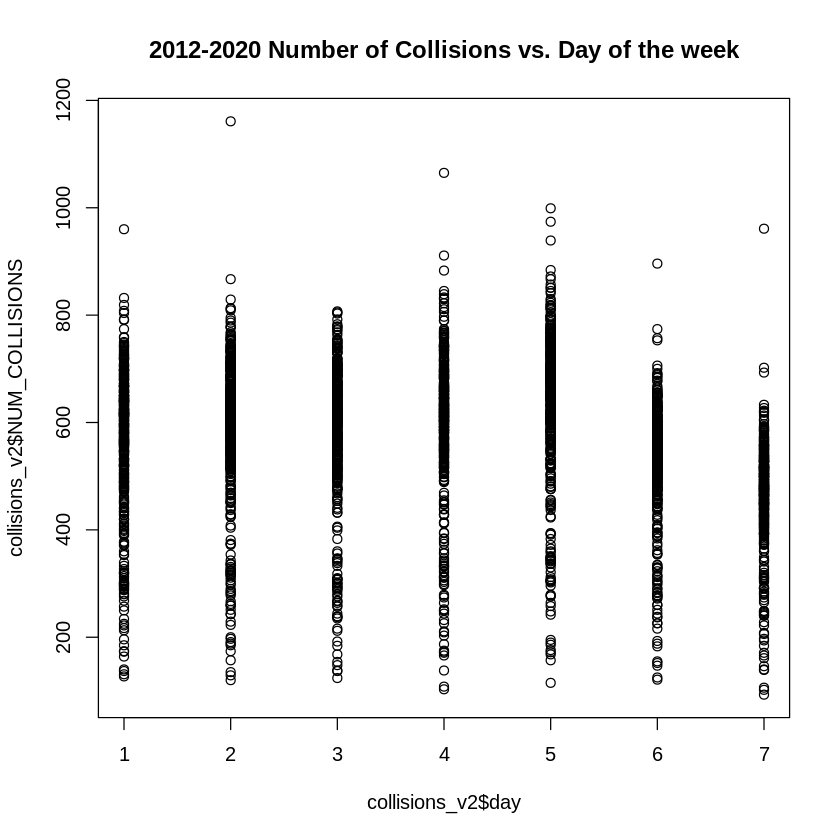

In [27]:
# plot Number of Collisions vs. Day of the week for all years
plot(collisions_v2$day, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Day of the week")

In [28]:
# summary of the number of collisions for 2012-2020
summary(collisions_v2$NUM_COLLISIONS)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   93.0   498.0   580.0   561.7   651.0  1161.0 

The figure above shows data of the number of collisions for Monday (as 1) to Sunday (as 7). It can be noticed that the number of collisions increases during the weekdays, but drops for Saturday and Sunday. 

The examples of outliners are also very clear. This will be investigated looking at the data for each year.

It is worth to see how the median of the number of collisions (grouped by the day of the week) looks like.

In [29]:
# summarise by median of number of collisions grouped by a day of the week
m1 <- collisions_v2 %>%
    group_by(day) %>%
    summarise("Median of number of collisions" = median(NUM_COLLISIONS))

,day,Median of number of collisions
,<int>,<dbl>
1,1,592.5
2,2,609.5
3,3,605.0
4,4,613.5
5,5,659.0
6,6,546.0
7,7,477.5


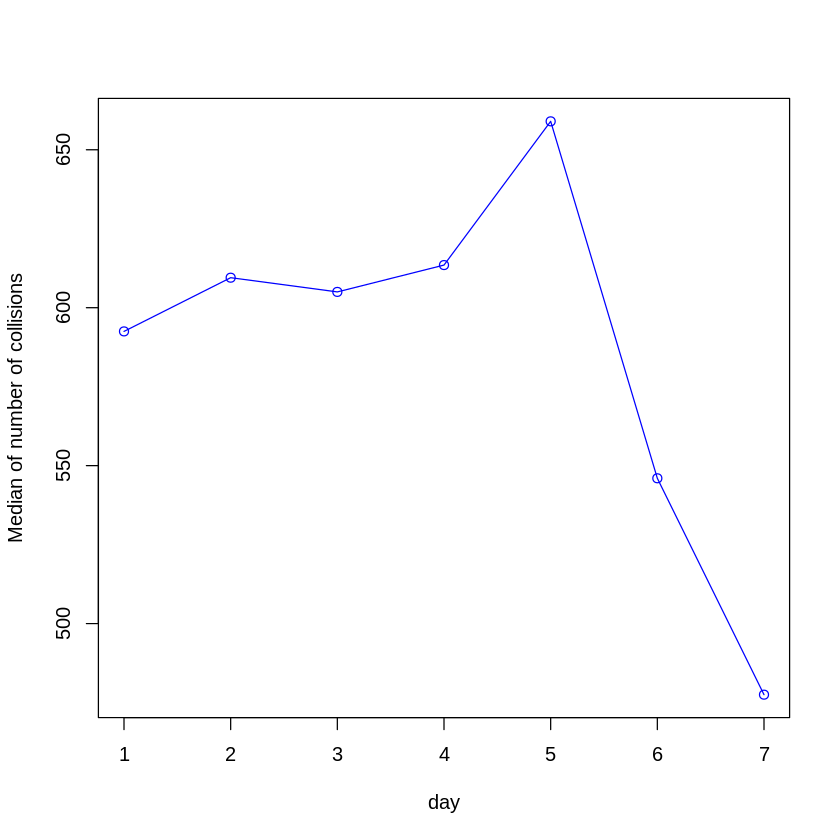

In [30]:
# print the results of median of number of collisions grouped by a day of the week
m1
# graph with points and line
plot(m1, type="o", col="blue")

Taking into account the median of number of collisions for each day of the week, we can notice that the value increases from Monday to Friday, with a slight decrease on Wednesday. Then it drops drastically over the weekend, reaching its lowest value on Sundays.


Let's check how this data looks like for each year.

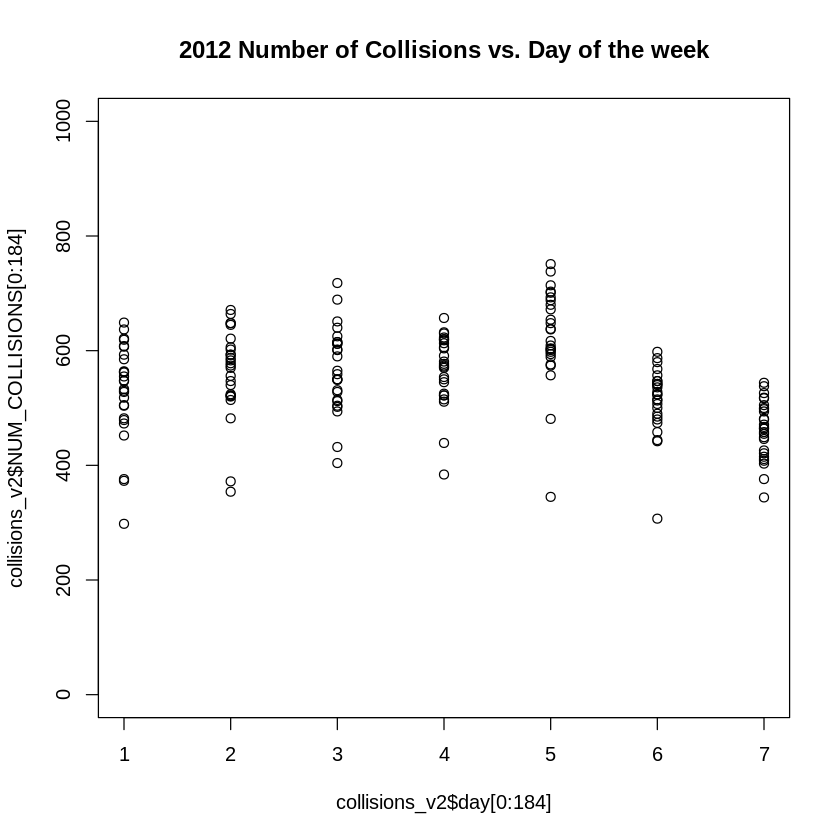

In [31]:
# plot the number of collisions vs. day of the week for 2012 (remember the data are from 01/07/2012) collisions_v2
plot(collisions_v2$day[0:184], collisions_v2$NUM_COLLISIONS[0:184], main="2012 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [32]:
# summary of the number of collisions for 2012
summary(collisions_v2$NUM_COLLISIONS[0:184])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  298.0   500.0   548.5   546.4   604.5   751.0 

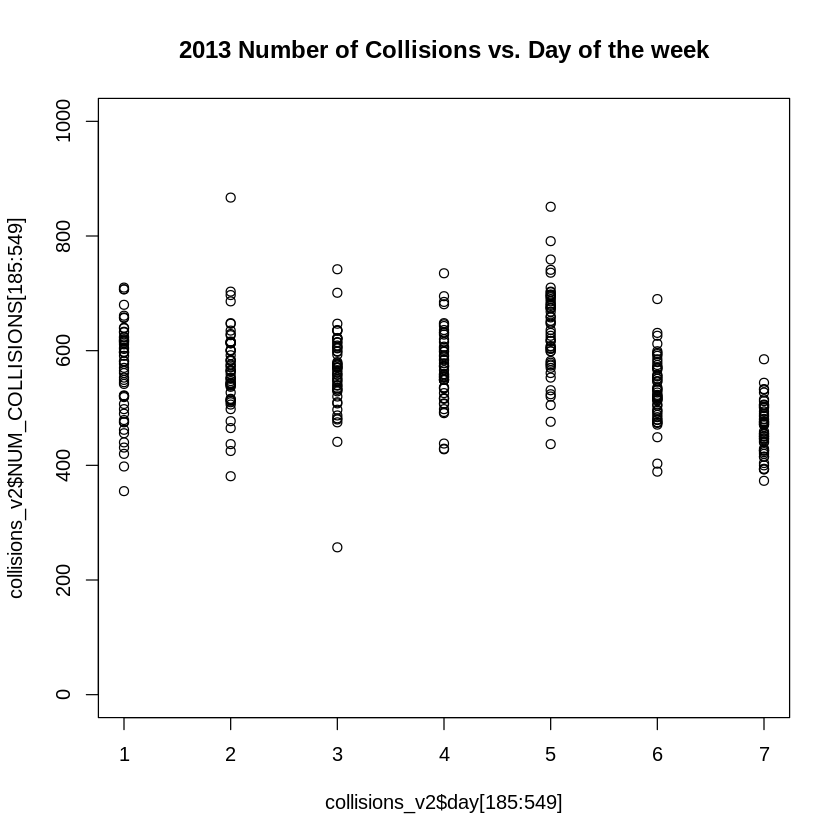

In [33]:
# plot the number of collisions vs. day of the week for 2013 collisions_v2
plot(collisions_v2$day[185:549], collisions_v2$NUM_COLLISIONS[185:549], main="2013 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [34]:
# summary of the number of collisions for 2013
summary(collisions_v2$NUM_COLLISIONS[185:549])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  257.0   505.0   558.0   558.2   613.0   867.0 

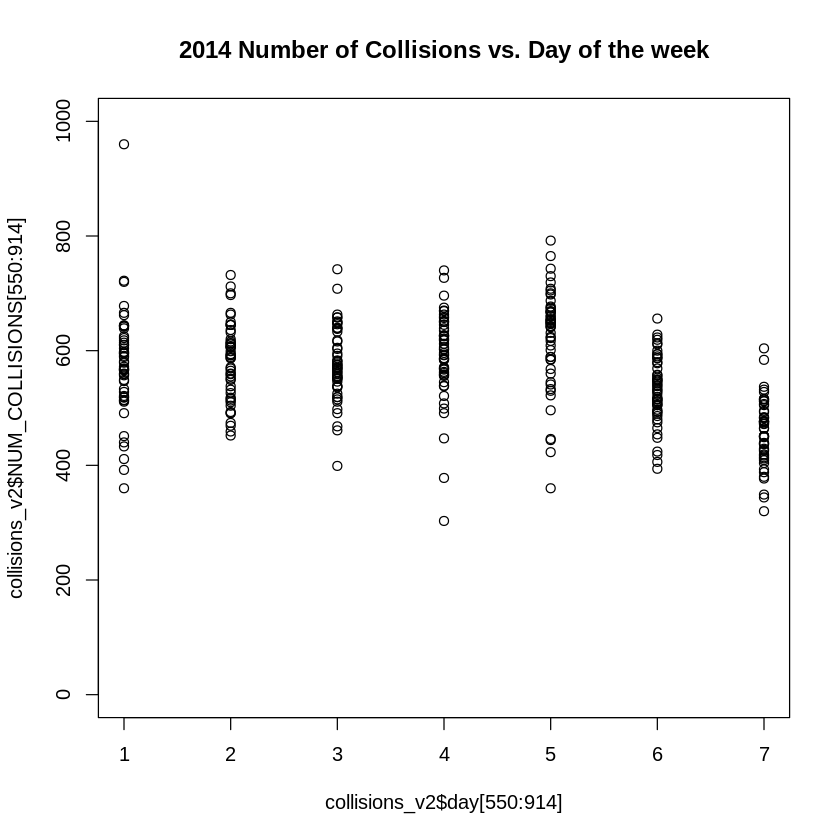

In [35]:
# plot the number of collisions vs. day of the week for 2014 collisions_v2
plot(collisions_v2$day[550:914], collisions_v2$NUM_COLLISIONS[550:914], main="2014 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [36]:
# summary of the number of collisions for 2014
summary(collisions_v2$NUM_COLLISIONS[550:914])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  303.0   510.0   568.0   564.5   623.0  1161.0 

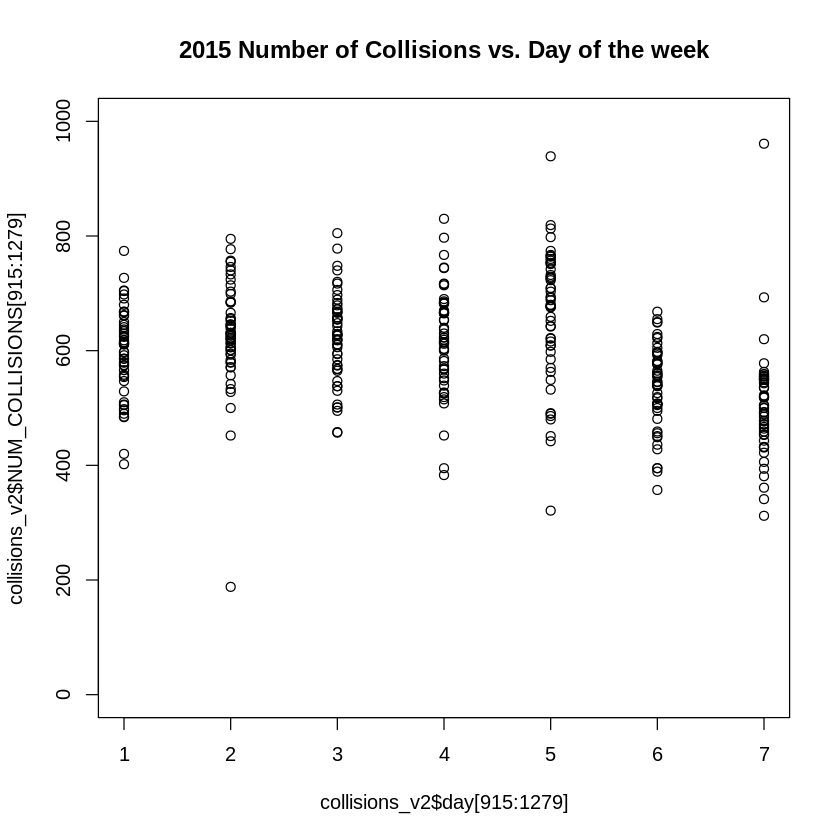

In [37]:
# plot the number of collisions vs. day of the week for 2015 collisions_v2
plot(collisions_v2$day[915:1279], collisions_v2$NUM_COLLISIONS[915:1279], main="2015 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [38]:
# summary of the number of collisions for 2015
summary(collisions_v2$NUM_COLLISIONS[915:1279])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  188.0   532.0   601.0   596.4   666.0   961.0 

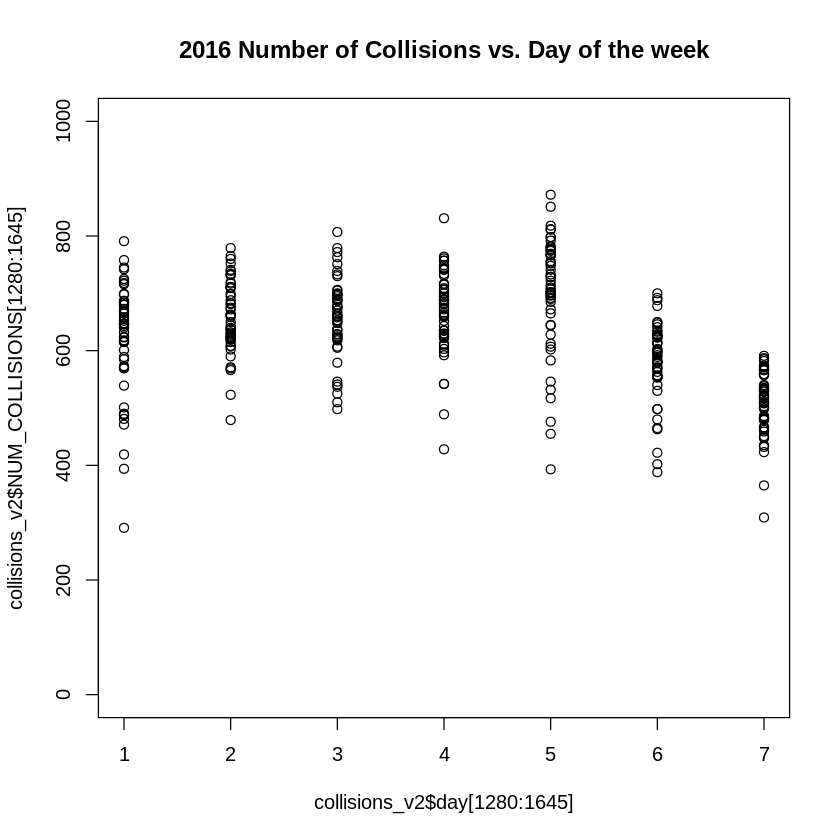

In [39]:
# plot the number of collisions vs. day of the week for 2016 collisions_v2
plot(collisions_v2$day[1280:1645], collisions_v2$NUM_COLLISIONS[1280:1645], main="2016 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [40]:
# summary of the number of collisions for 2016
summary(collisions_v2$NUM_COLLISIONS[1280:1645])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  291.0   568.2   635.0   628.0   696.8   872.0 

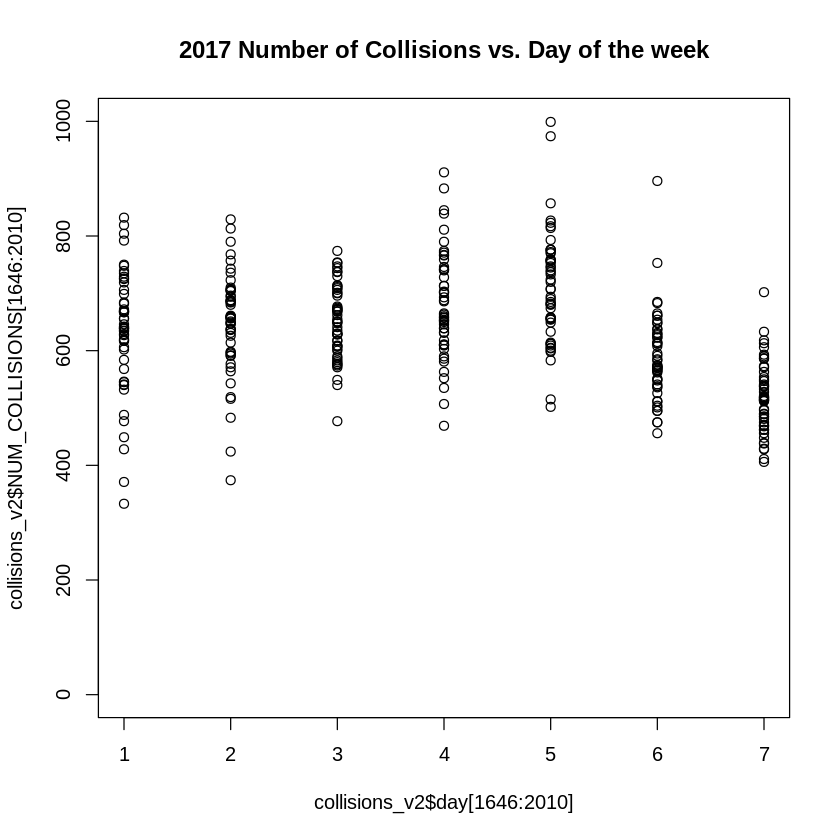

In [41]:
# plot the number of collisions vs. day of the week for 2017 collisions_v2
plot(collisions_v2$day[1646:2010], collisions_v2$NUM_COLLISIONS[1646:2010], main="2017 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [42]:
# summary of the number of collisions for 2017
summary(collisions_v2$NUM_COLLISIONS[1646:2010])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  333.0   570.0   636.0   632.9   700.0   999.0 

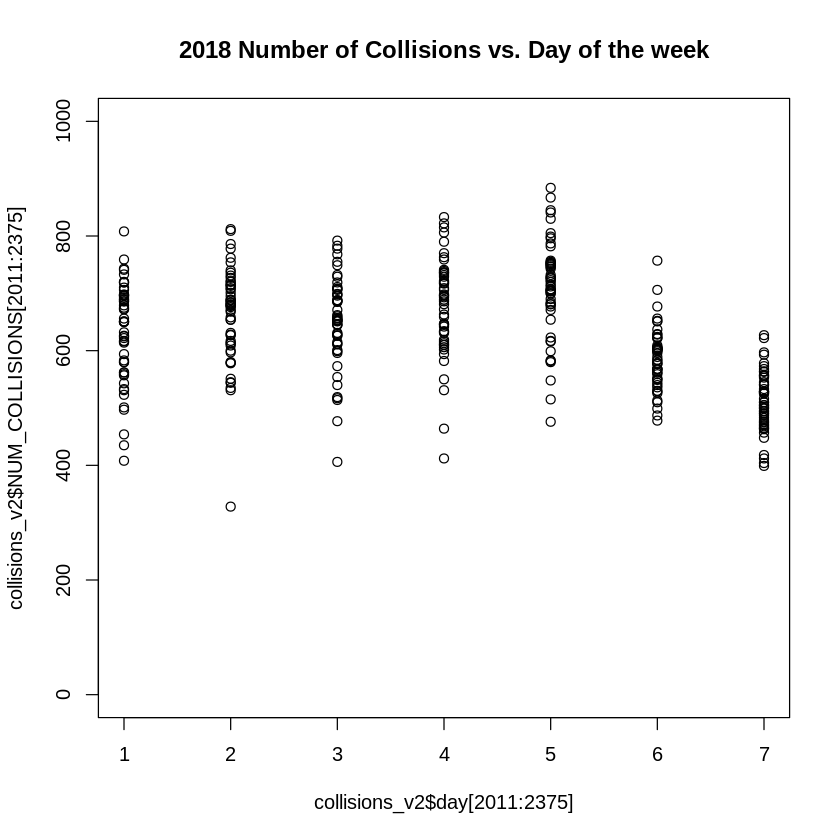

In [43]:
# plot the number of collisions vs. day of the week for 2018 collisions_v2
plot(collisions_v2$day[2011:2375], collisions_v2$NUM_COLLISIONS[2011:2375], main="2018 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [44]:
# summary of the number of collisions for 2018
summary(collisions_v2$NUM_COLLISIONS[2011:2375])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  328.0   562.0   634.0   634.4   706.0  1065.0 

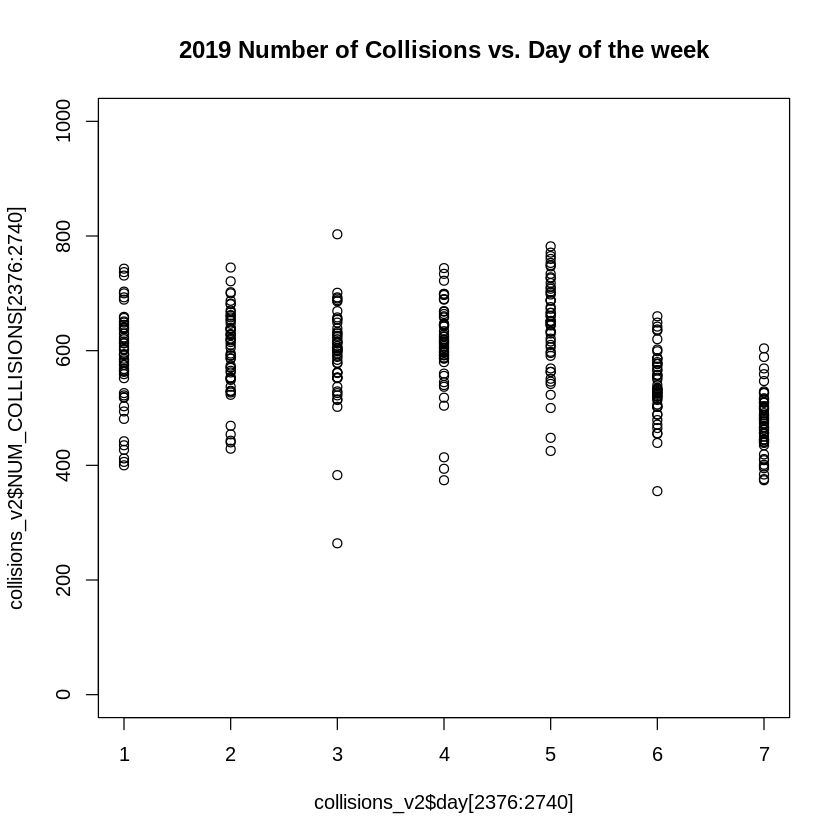

In [45]:
# plot the number of collisions vs. day of the week for 2019 collisions_v2
plot(collisions_v2$day[2376:2740], collisions_v2$NUM_COLLISIONS[2376:2740], main="2019 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [46]:
# summary of the number of collisions for 2019
summary(collisions_v2$NUM_COLLISIONS[2376:2740])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  264.0   522.0   589.0   579.4   641.0   803.0 

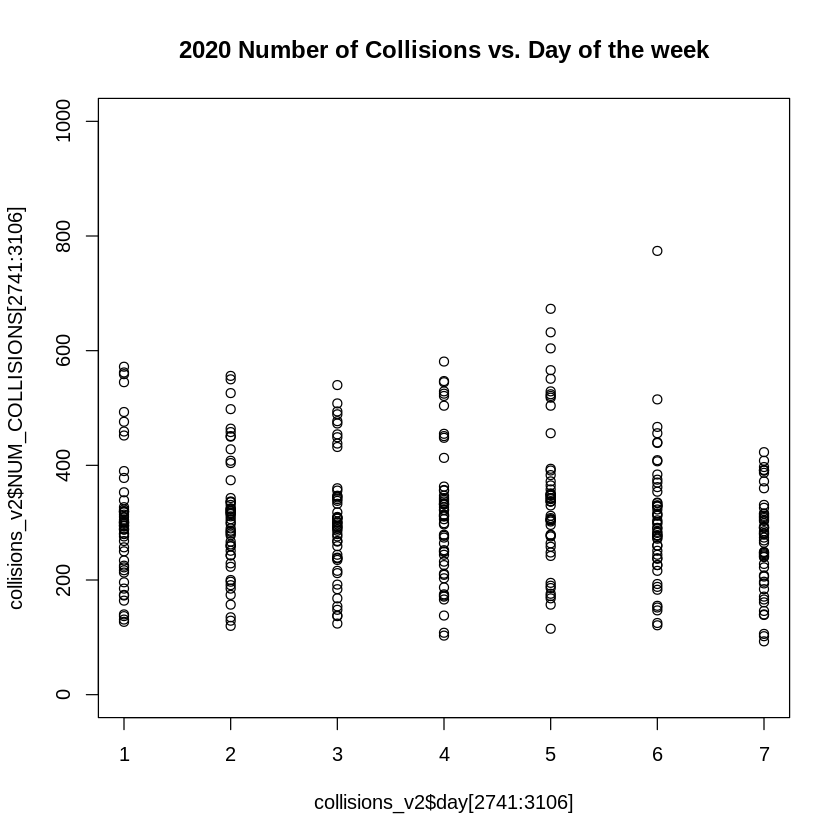

In [47]:
# plot the number of collisions vs. day of the week for 2020 collisions_v2
plot(collisions_v2$day[2741:3106], collisions_v2$NUM_COLLISIONS[2741:3106], main="2020 Number of Collisions vs. Day of the week",  ylim=c(0, 1000))

In [48]:
# summary of the number of collisions for 2020
summary(collisions_v2$NUM_COLLISIONS[2741:3106])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   93.0   242.2   301.0   308.3   347.8   774.0 

The data for 2012 are different - probably because there are only for months from July to December.
The data for 2020 are very unusual comparing to previous years. The minimum value is very low as well as median. The difference in values may be due to the situation that emerged in 2020 - the covid-19 virus pandemic. Due to the restrictions introduced related to the coronavirus, the data from this year should not be taken into account, because their atypicality may disrupt the normal patterns.

It is hard to see the linear relation between the number of the collisions and day of the week. This may change when we consider only weekdays, excluding Saturday and Sunday.

In [49]:
# data without Saturdays and Sundays
collisions_v2_weekdays <- collisions_v2 %>%
  filter(day < 6)

In [50]:
head(collisions_v2_weekdays)

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,1,2012,7,2,2012-07-02,80.3,54.1,1011.6,10.0,3.8,15.0,NA,88.0,66.9,0.00,NA,0,564
2,2,2012,7,3,2012-07-03,79.8,56.7,1012.8,10.0,2.9,12.0,NA,88.0,63.0,0.00,NA,0,664
3,3,2012,7,4,2012-07-04,81.8,65.6,1009.1,9.2,3.6,11.1,NA,91.0,68.0,0.06,NA,0,432
4,4,2012,7,5,2012-07-05,86.7,64.3,1007.4,9.4,3.8,15.0,NA,93.9,70.0,NA,NA,0,591
5,5,2012,7,6,2012-07-06,81.9,62.3,1011.7,10.0,3.1,9.9,NA,91.0,66.9,0.00,NA,0,638
6,1,2012,7,9,2012-07-09,78.5,56.8,1012.7,10.0,3.5,9.9,NA,84.0,68.0,0.09,NA,0,533


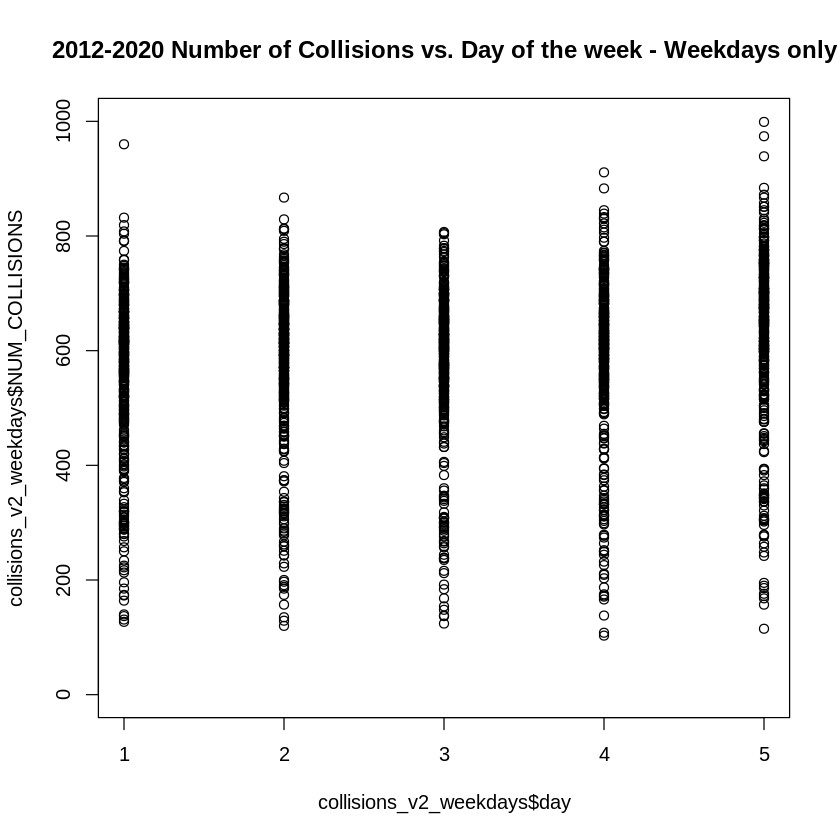

In [51]:
# plot the number of collisions vs. day of the week for 2012-2020
plot(collisions_v2_weekdays$day, collisions_v2_weekdays$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Day of the week - Weekdays only",  ylim=c(0, 1000))

In [52]:
# load library
library(ggplot2)

`geom_smooth()` using formula 'y ~ x'



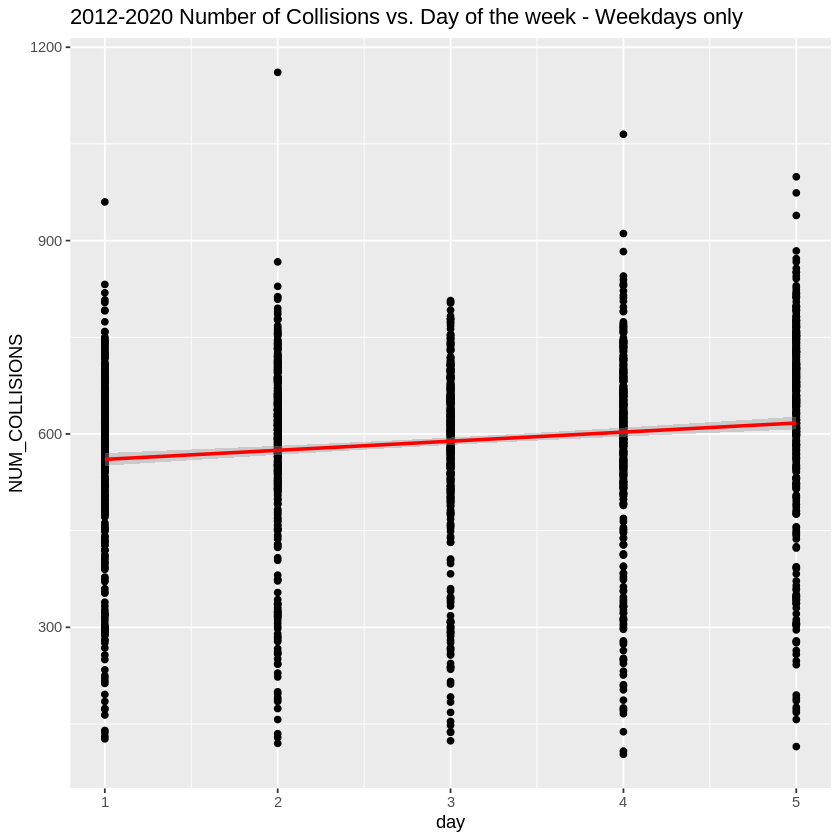

In [53]:
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_weekdays, aes(x = day, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red") +
  ggtitle("2012-2020 Number of Collisions vs. Day of the week - Weekdays only")

In [54]:
# correlation between day of the week and the number of collisions for weekdays only
cor(collisions_v2_weekdays$day, collisions_v2_weekdays$NUM_COLLISIONS)

[1] 0.1442452

It might be worth to consider getting rid of the data for the weekends - from Monday to Friday it is a positive linear relationship.

#### **2. Number of collisions vs. Date**

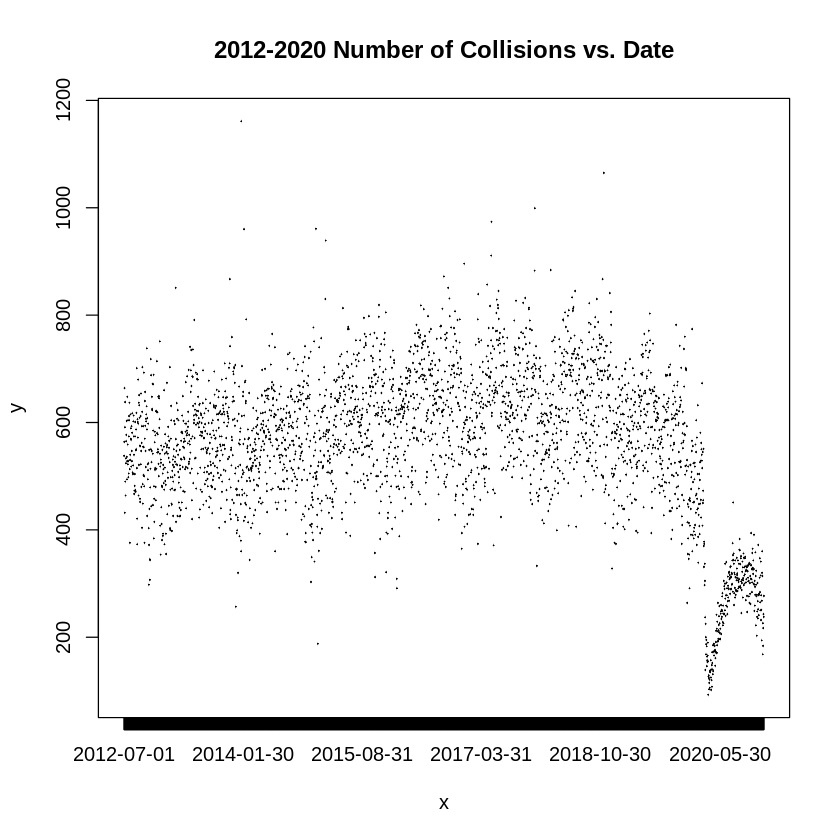

In [55]:
# plot the number of collisions over the day of the year for 2012-2020 collisions_v2
plot(collisions_v2$collision_date, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Date")

This figures show the spread of the data for number of collisions over years. It might be worth to look closer into sesonality - for this we need to see each year closer.

`geom_smooth()` using formula 'y ~ x'



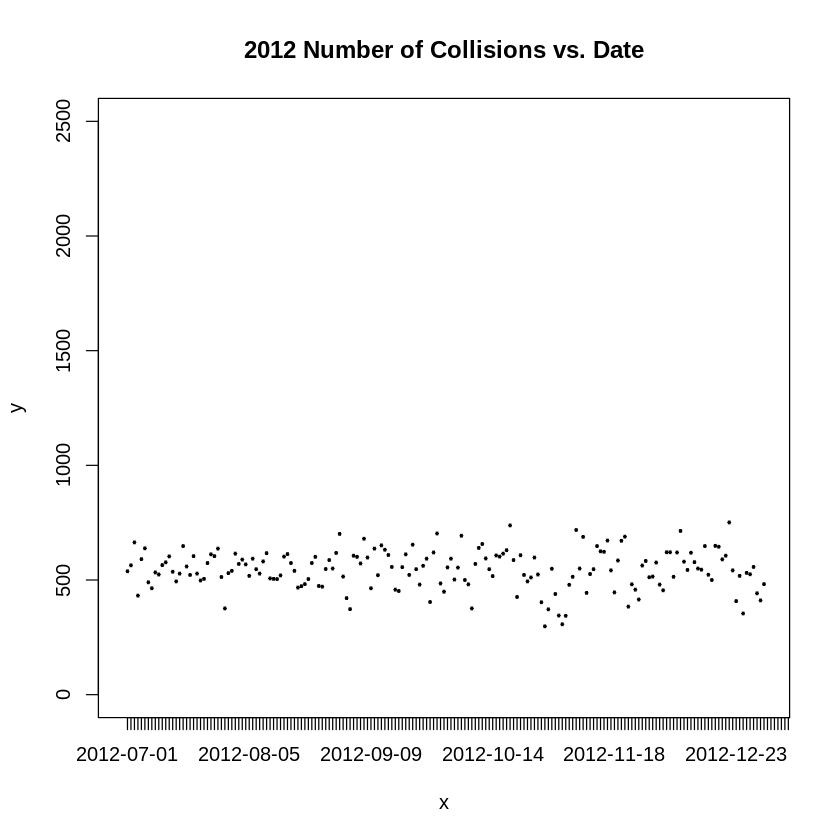

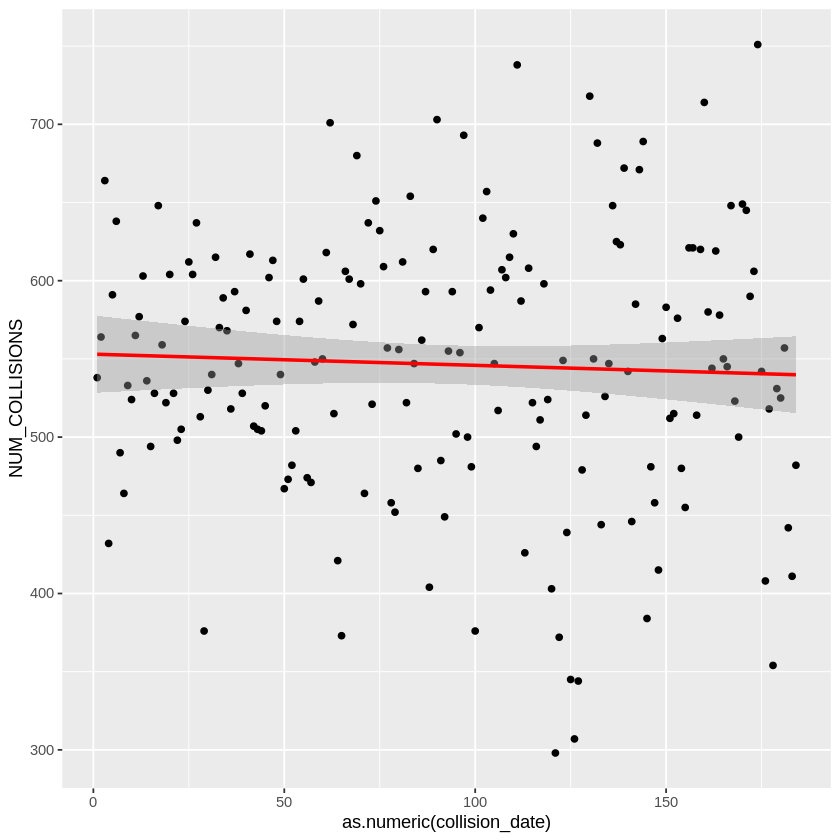

In [56]:
# plot the number of collisions vs. collision date for 2012 (remember the data are from 01/07/2012) collisions_v2
plot(collisions_v2$collision_date[0:184], collisions_v2$NUM_COLLISIONS[0:184], main="2012 Number of Collisions vs. Date", xlim=c(0, 184), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2012, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



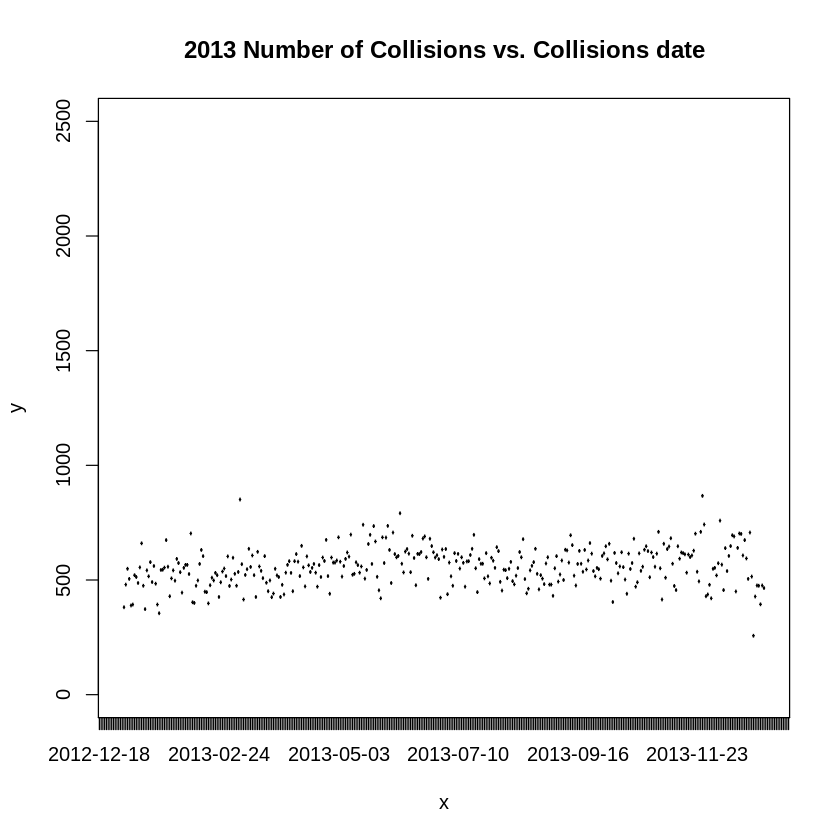

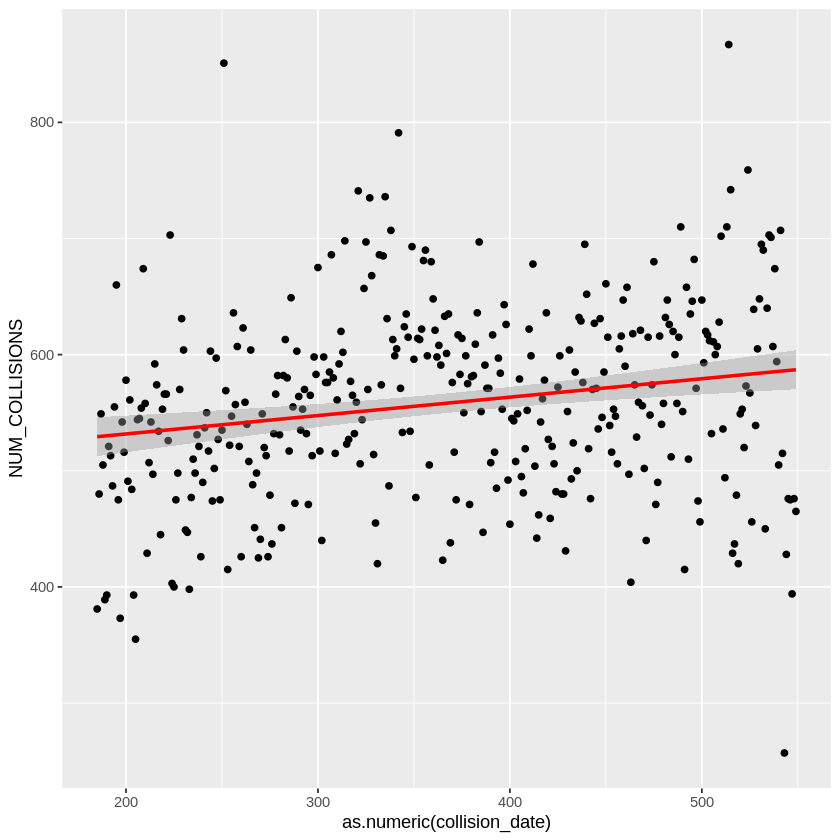

In [57]:
# plot the number of collisions vs. collision date for 2013 collisions_v2
plot(collisions_v2$collision_date[185:549], collisions_v2$NUM_COLLISIONS[185:549], main="2013 Number of Collisions vs. Collisions date", xlim=c(185, 549), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



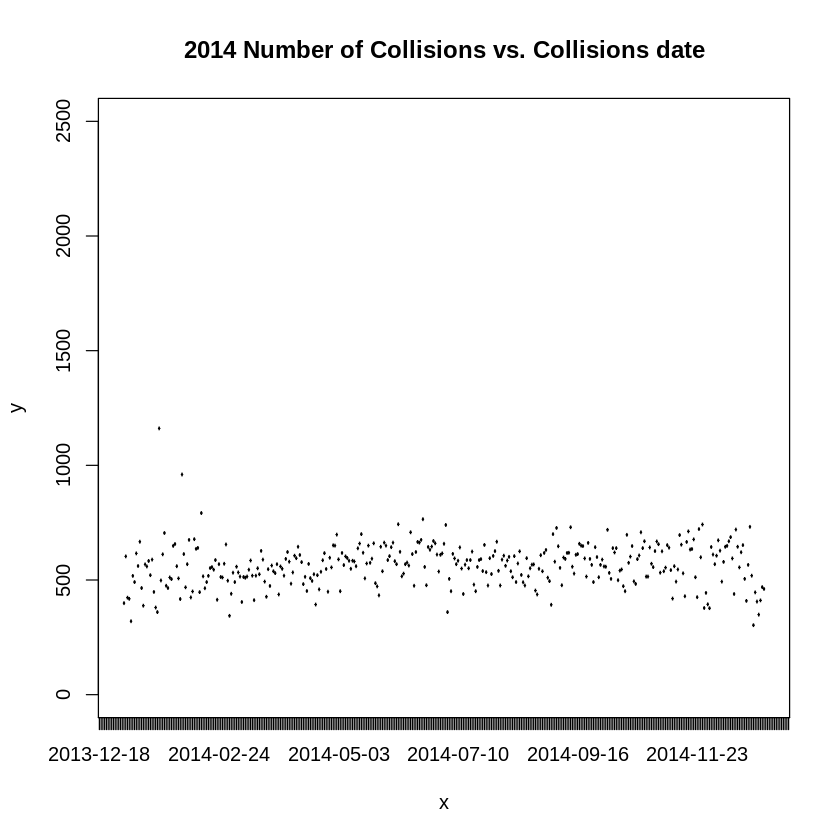

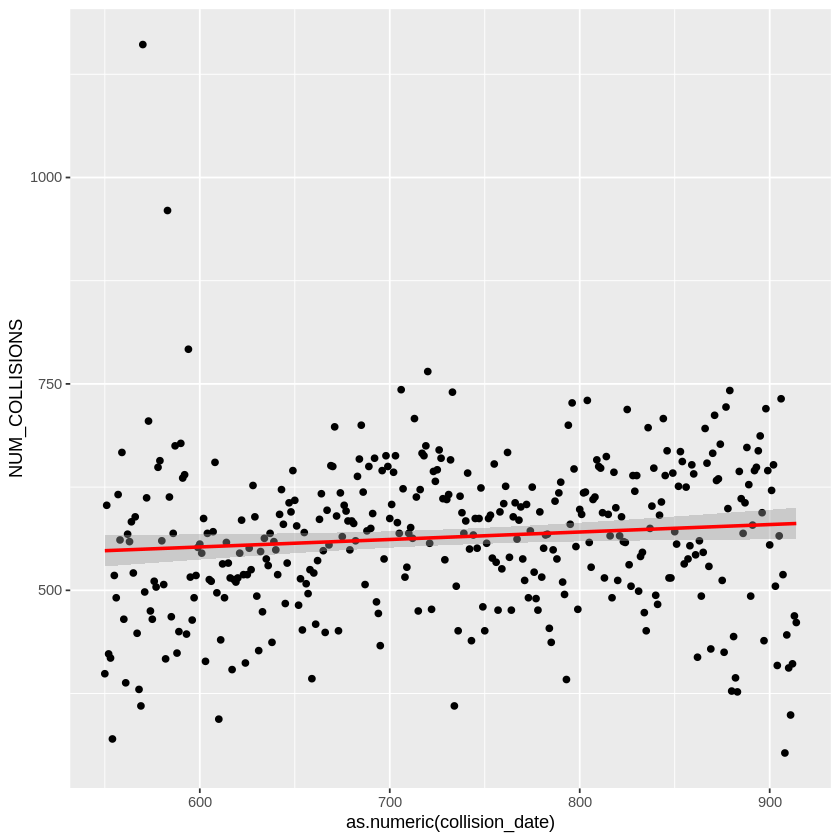

In [58]:
# plot the number of collisions vs. collision date for 2014 collisions_v2
plot(collisions_v2$collision_date[550:914], collisions_v2$NUM_COLLISIONS[550:914], main="2014 Number of Collisions vs. Collisions date", xlim=c(550, 914), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2014, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



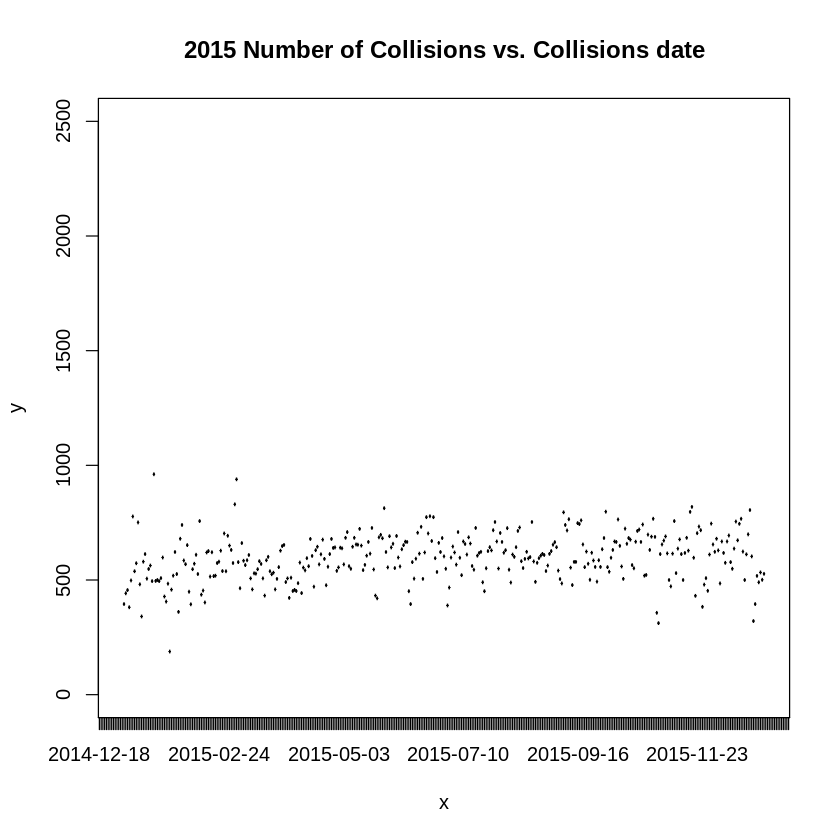

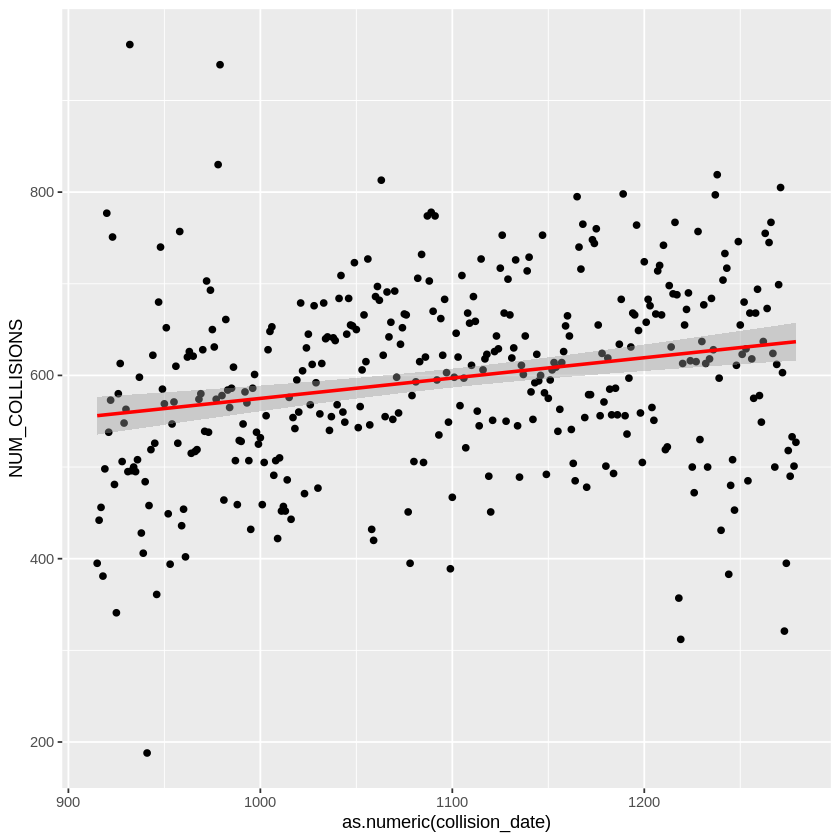

In [59]:
# plot the number of collisions vs. collision date for 2015 collisions_v2
plot(collisions_v2$collision_date[915:1279], collisions_v2$NUM_COLLISIONS[915:1279], main="2015 Number of Collisions vs. Collisions date", xlim=c(915, 1279), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2015, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



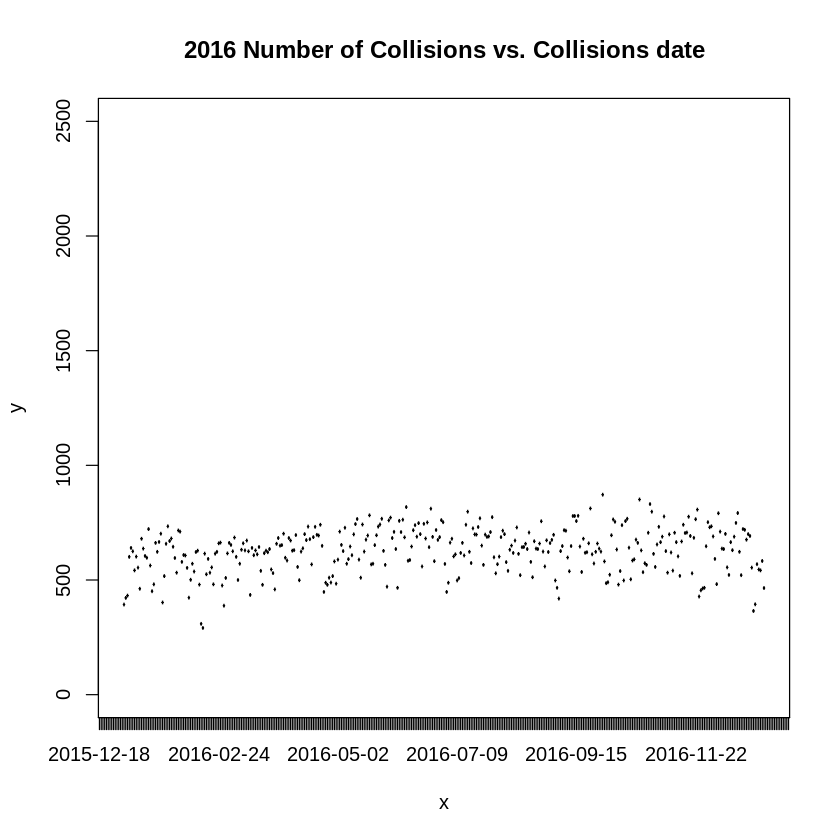

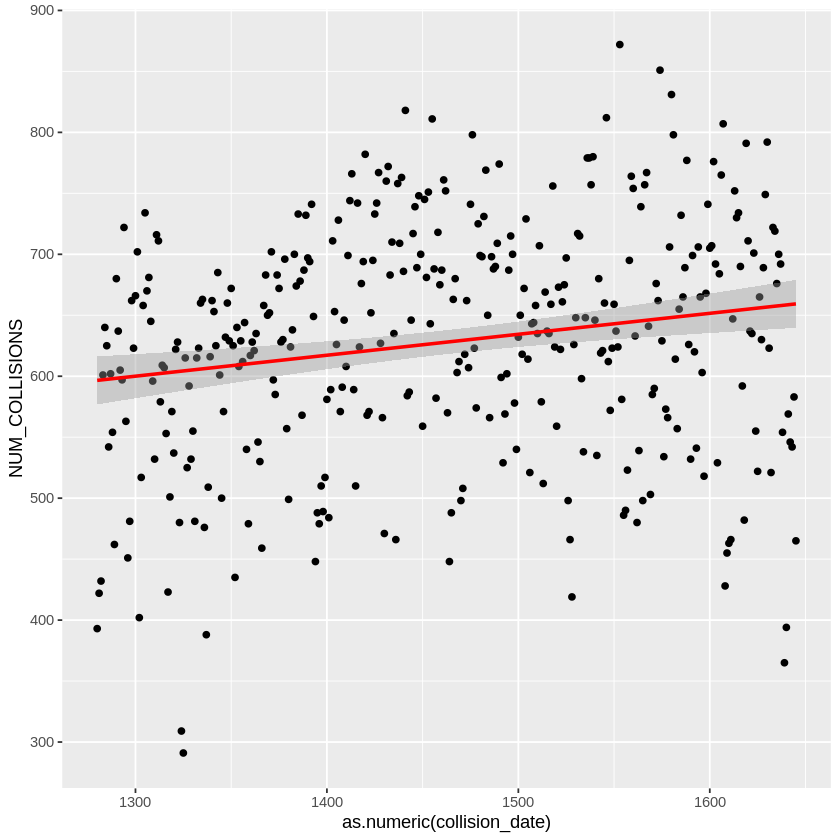

In [60]:
# plot the number of collisions vs. collision date for 2016 collisions_v2
plot(collisions_v2$collision_date[1280:1645], collisions_v2$NUM_COLLISIONS[1280:1645], main="2016 Number of Collisions vs. Collisions date", xlim=c(1280, 1645), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2016, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



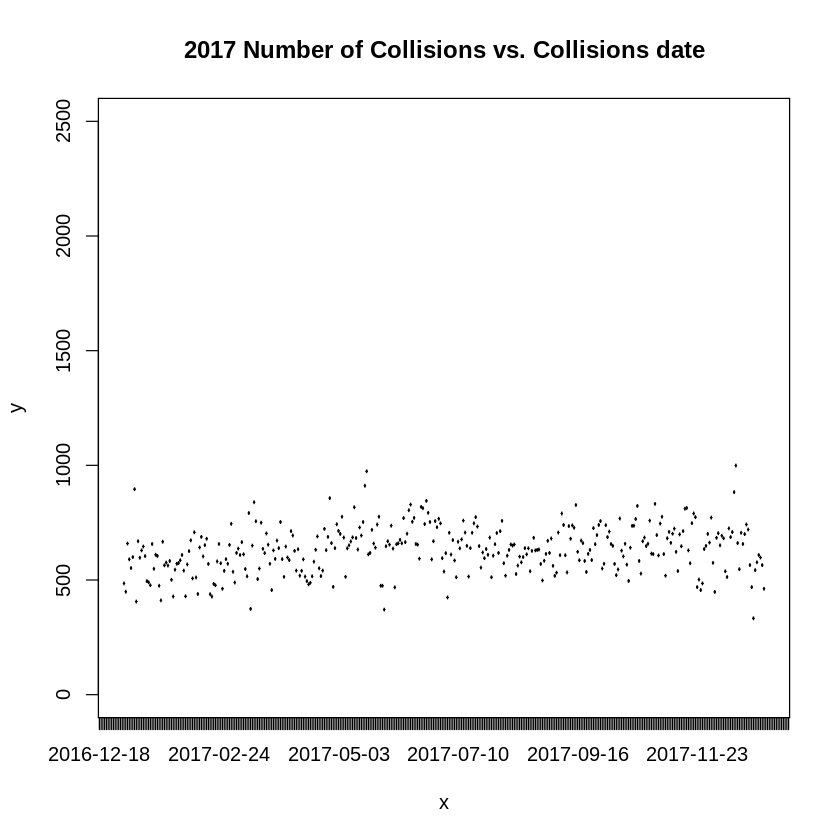

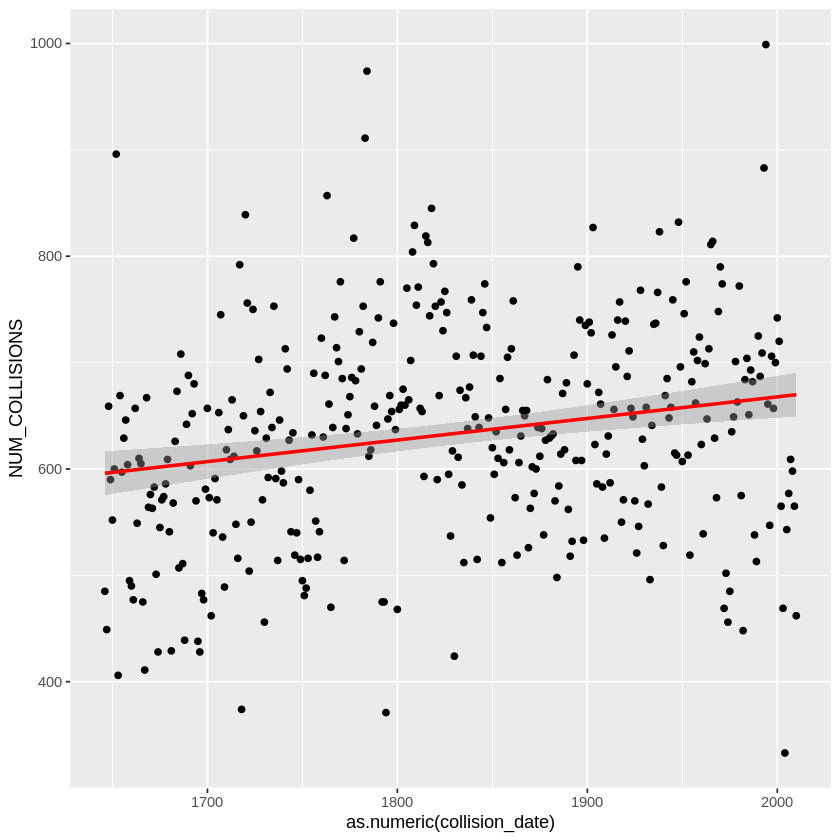

In [61]:
# plot the number of collisions vs. collision date for 2017 collisions_v2
plot(collisions_v2$collision_date[1646:2010], collisions_v2$NUM_COLLISIONS[1646:2010], main="2017 Number of Collisions vs. Collisions date", xlim=c(1646, 2010),  ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2017, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



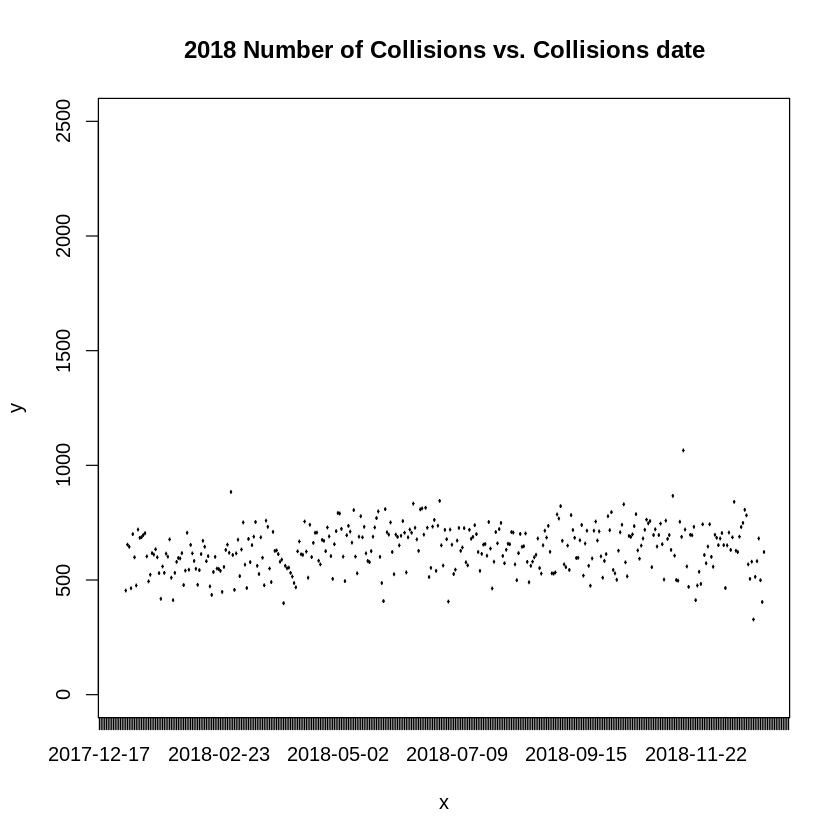

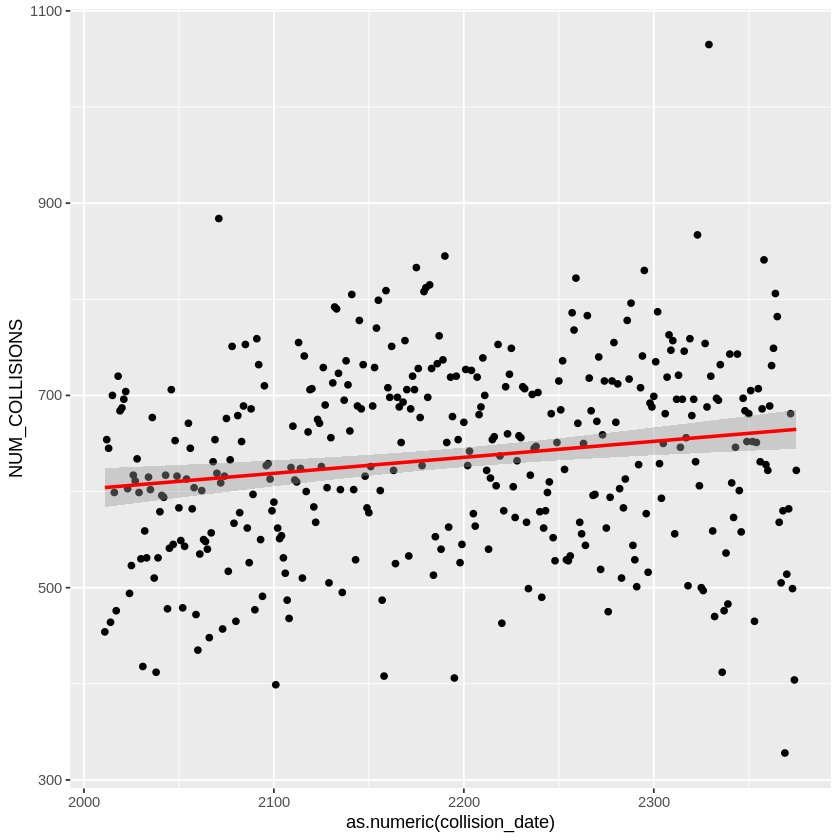

In [62]:
# plot the number of collisions vs. collision date for 2018 collisions_v2
plot(collisions_v2$collision_date[2011:2375], collisions_v2$NUM_COLLISIONS[2011:2375], main="2018 Number of Collisions vs. Collisions date", xlim=c(2010, 2375), ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2018, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



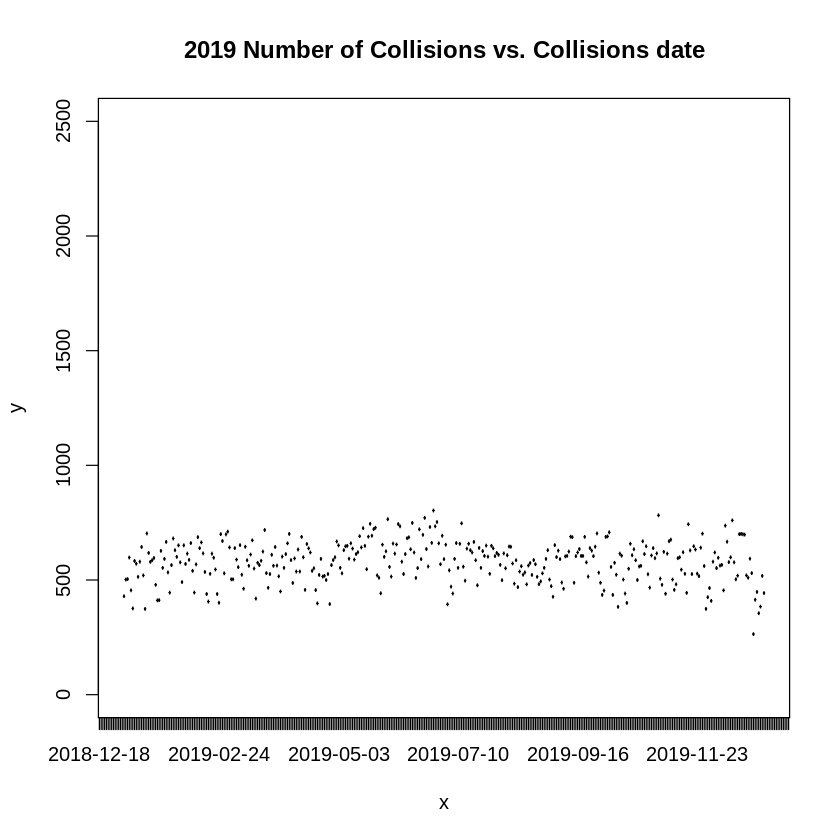

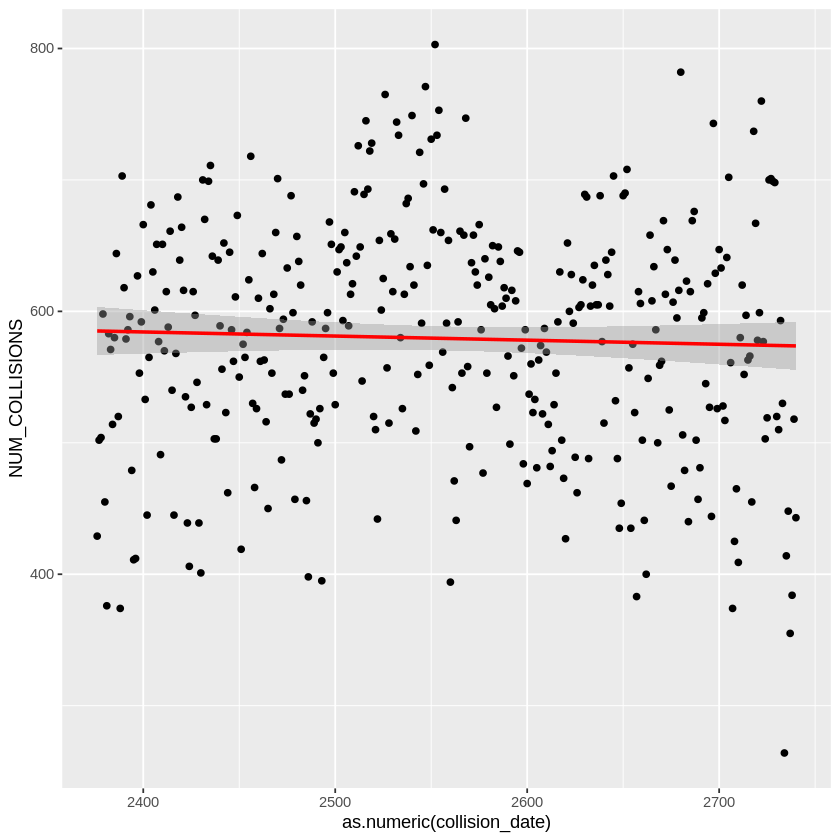

In [63]:
# plot the number of collisions vs. collision date for 2019 collisions_v2
plot(collisions_v2$collision_date[2376:2740], collisions_v2$NUM_COLLISIONS[2376:2740], main="2019 Number of Collisions vs. Collisions date", xlim=c(2376, 2740),  ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2019, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

`geom_smooth()` using formula 'y ~ x'



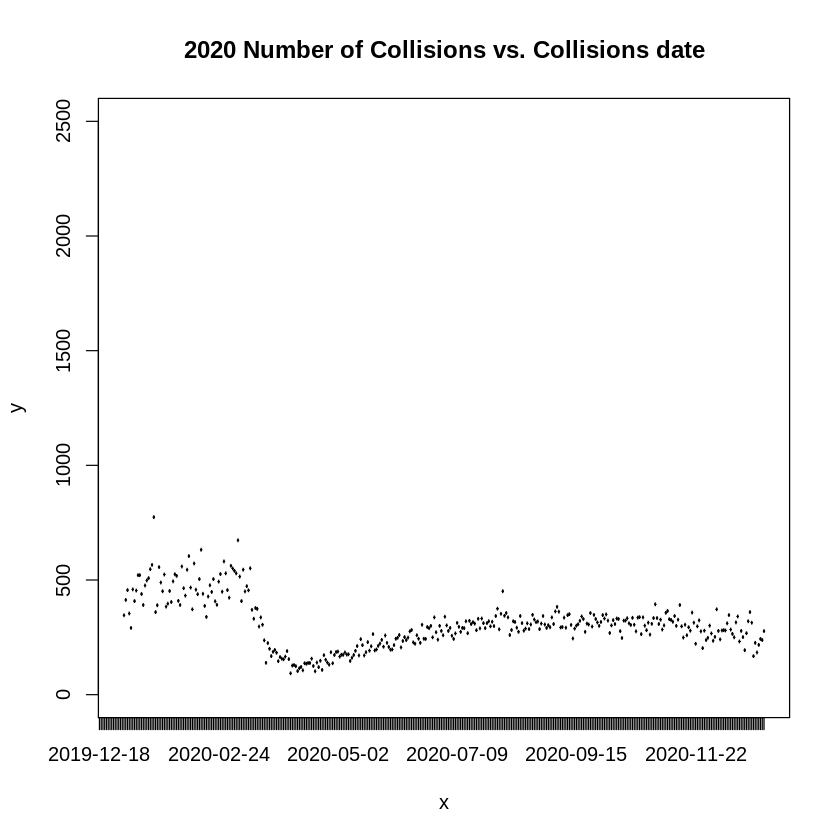

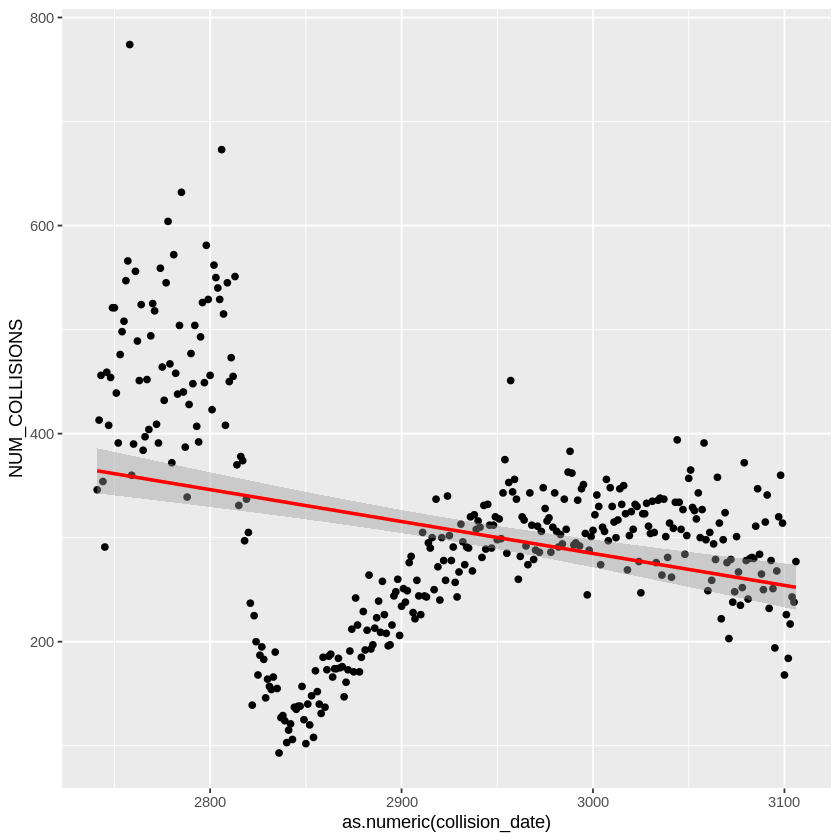

In [64]:
# plot the number of collisions vs. collision date for 2020 collisions_v2
plot(collisions_v2$collision_date[2741:3106], collisions_v2$NUM_COLLISIONS[2741:3106], main="2020 Number of Collisions vs. Collisions date", xlim=c(2741, 3106),  ylim=c(0, 2500))
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2020, aes(x = as.numeric(collision_date), y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

The distribution of the data is similar for each year, except 2020. The reason may be the COVID-19 pandemic and the big changes associated with it. Data for 2012 are also different, due to the smaller number of months (six months only). The data for 2020 are significantly different compared to previous years. Getting rid of them could be a good step towards the goal of this report.

Worth to notice is that for all years between 2013 and 2018 it is a positive trend between the number of collision and the date - the value increases from month to month. For 2019 trend looks a slightly different, but it will be checked again after clearing the data from outliers.

In [65]:
# get rid of 2012 and 2020
collisions_v2_2013_2019 <- collisions_v2 %>%
  filter(year > 2012) %>%
  filter(year < 2020)

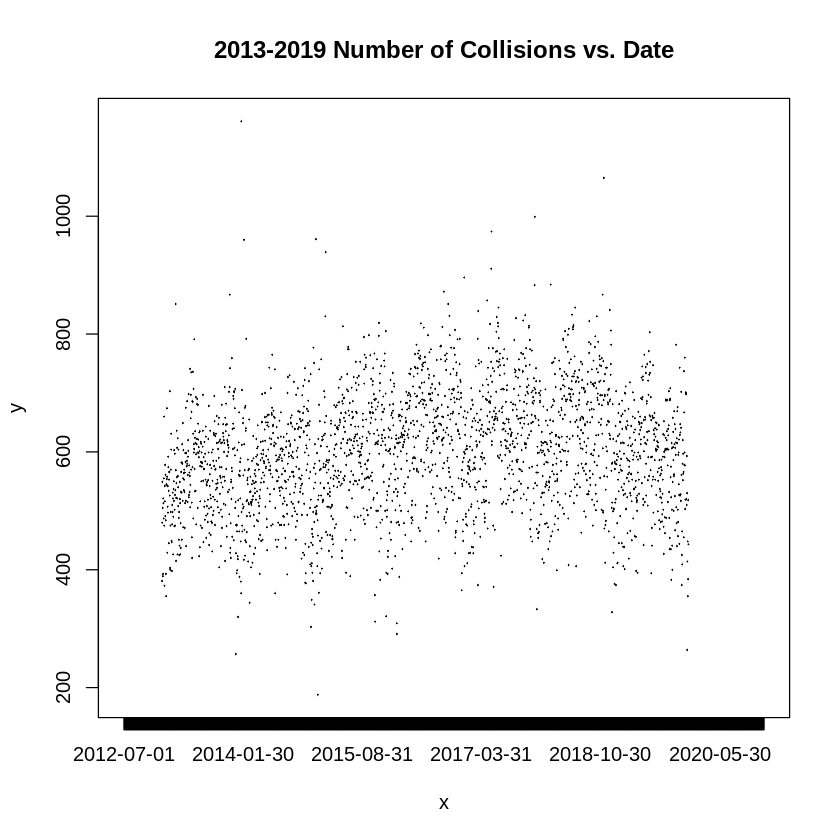

In [66]:
# plot the number of collisions over the day of the year for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$collision_date, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Date")

> #### **2a. Number of collisions vs. Date- is there some seasonality?**

In this subsection the seasonality for the number of collisions will be checked. For this purpose, the data between 2013 and 2019 will be taken into account. The outliers will be removed. Two columns will also be added to the dataset:

* dayindex - a number between 1 and 365 (or 366 for a leap year)
* dayofyear - the number for each day from this dataset:
  * 1-365 for days in 2013
  * 366-730 for days in 2014
  * 731-1095 for days in 2015
  * 1096-1461 for days in 2016 (leap year)
  * 1462-1826 for days in 2017
  * 1827-2191 for days in 2018
  * 2192-2556 for days in 2019

In [67]:
# create new columns with dayindex and dayofyear for 2013
dayofyear <- 1*seq_len(nrow(collisions_v2_2013))
dayindex <- 1*seq_len(nrow(collisions_v2_2013))
# create a new dataset that has data for 2013 with new columns
collisions_v2_2013a <- cbind(dayindex, dayofyear, collisions_v2_2013)


In [68]:
# create new columns with dayindex and dayofyear for 2014
dayofyear <- 1*seq_len(nrow(collisions_v2_2014))
dayindex <- 1*seq_len(nrow(collisions_v2_2014)) + 365
# create a new dataset that has data for 2014 with new columns
collisions_v2_2014a <- cbind(dayindex, dayofyear, collisions_v2_2014)

In [69]:
# create new columns with dayindex and dayofyear for 2015
dayofyear <- 1*seq_len(nrow(collisions_v2_2015))
dayindex <- 1*seq_len(nrow(collisions_v2_2015)) + 730
# create a new dataset that has data for 2015 with new columns
collisions_v2_2015a <- cbind(dayindex, dayofyear, collisions_v2_2015)

In [70]:
# create new columns with dayindex and dayofyear for 2016 (leap year!)
dayofyear <- 1*seq_len(nrow(collisions_v2_2016))
dayindex <- 1*seq_len(nrow(collisions_v2_2016)) + 1095
# create a new dataset that has data for 2016 with new columns
collisions_v2_2016a <- cbind(dayindex, dayofyear, collisions_v2_2016)

In [71]:
# create new columns with dayindex and dayofyear for 2017
dayofyear <- 1*seq_len(nrow(collisions_v2_2017))
dayindex <- 1*seq_len(nrow(collisions_v2_2017)) + 1461
# create a new dataset that has data for 2017 with new columns
collisions_v2_2017a <- cbind(dayindex, dayofyear, collisions_v2_2017)

In [72]:
# create new columns with dayindex and dayofyear for 2018
dayofyear <- 1*seq_len(nrow(collisions_v2_2018))
dayindex <- 1*seq_len(nrow(collisions_v2_2018)) + 1826
# create a new dataset that has data for 2018 with new columns
collisions_v2_2018a <- cbind(dayindex, dayofyear, collisions_v2_2018)

In [73]:
# create new columns with dayindex and dayofyear for 2019
dayofyear <- 1*seq_len(nrow(collisions_v2_2019))
dayindex <- 1*seq_len(nrow(collisions_v2_2019)) + 2191
# create a new dataset that has data for 2019 with new columns
collisions_v2_2019a <- cbind(dayindex, dayofyear, collisions_v2_2019)

With recently added new columns it is now possible to see the data for few years in the same graph. Let's see the data grouped for three and four years using the newly created *dayofyear* and *dayindex*. 

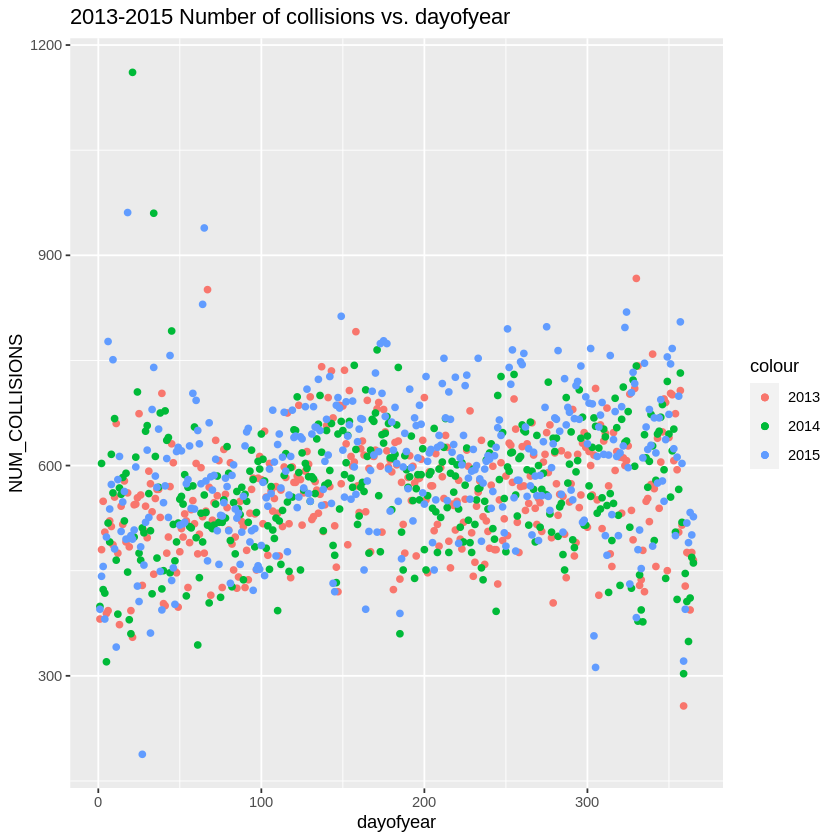

In [74]:
# plot the number of collisions vs. dayofyear for 2013-2015
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayofyear, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayofyear, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayofyear, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayofyear")


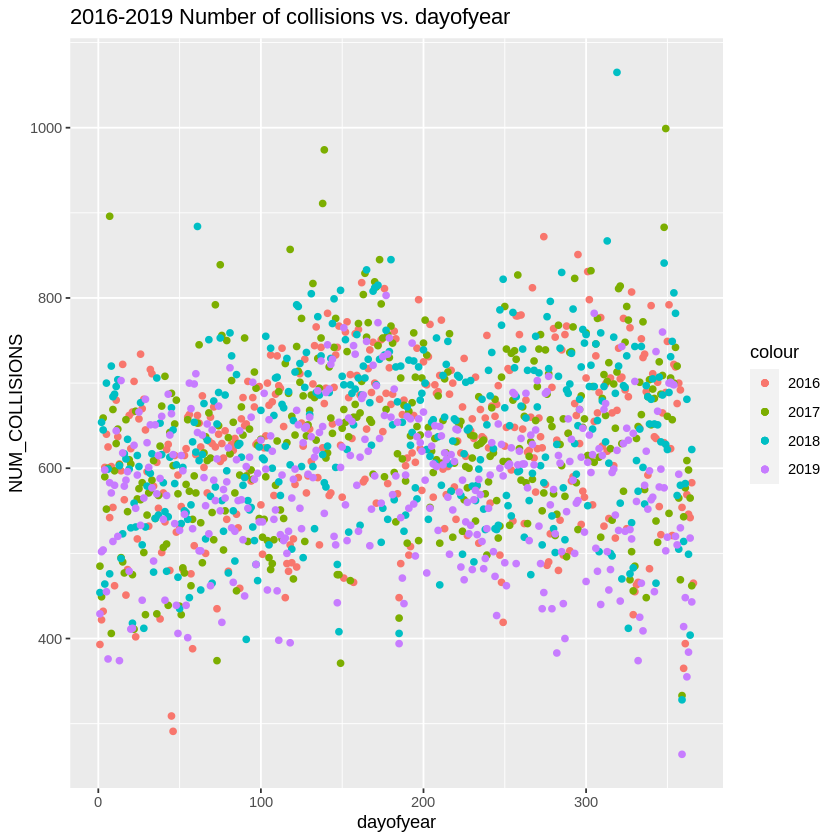

In [75]:
# plot the number of collisions vs. dayofyear for 2016-2019
ggplot() +
geom_point(data = collisions_v2_2016a, aes(dayofyear, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayofyear, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayofyear, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayofyear, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayofyear")

From the above charts, it can be seen that there is a seasonal pattern throughout the year: an increase in value from the beginning of the year to June and then a decline around mid-August. Between September and December, a new increase, with a significant drop at the end of the year.

Let us analyze the number of collisions using *dayindex*.

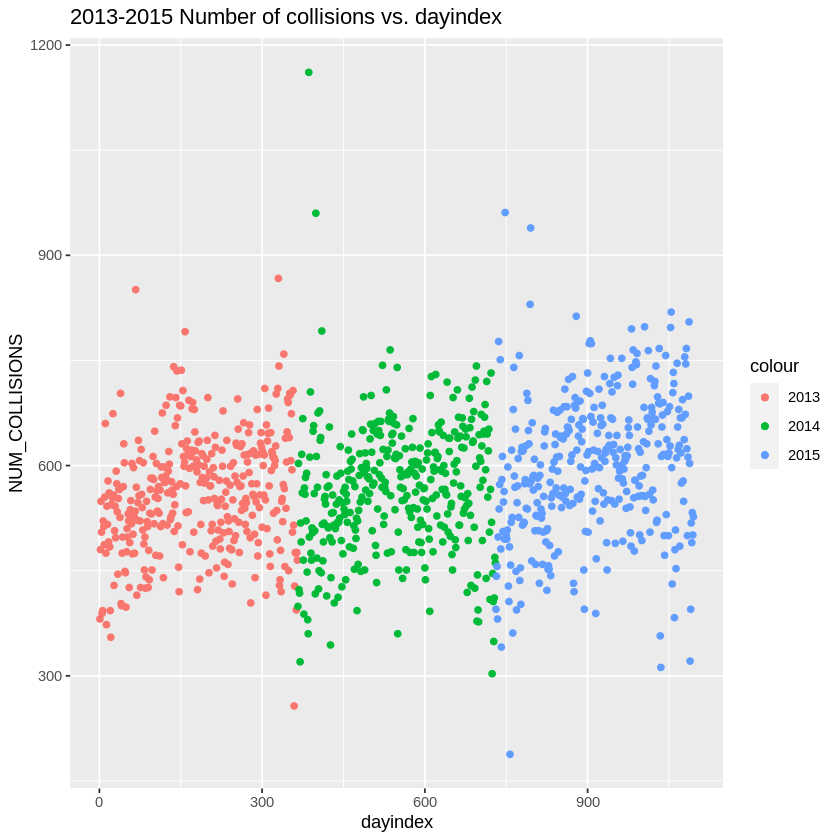

In [76]:
# plot the number of collisions vs. dayindex for 2013-2015
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayindex")

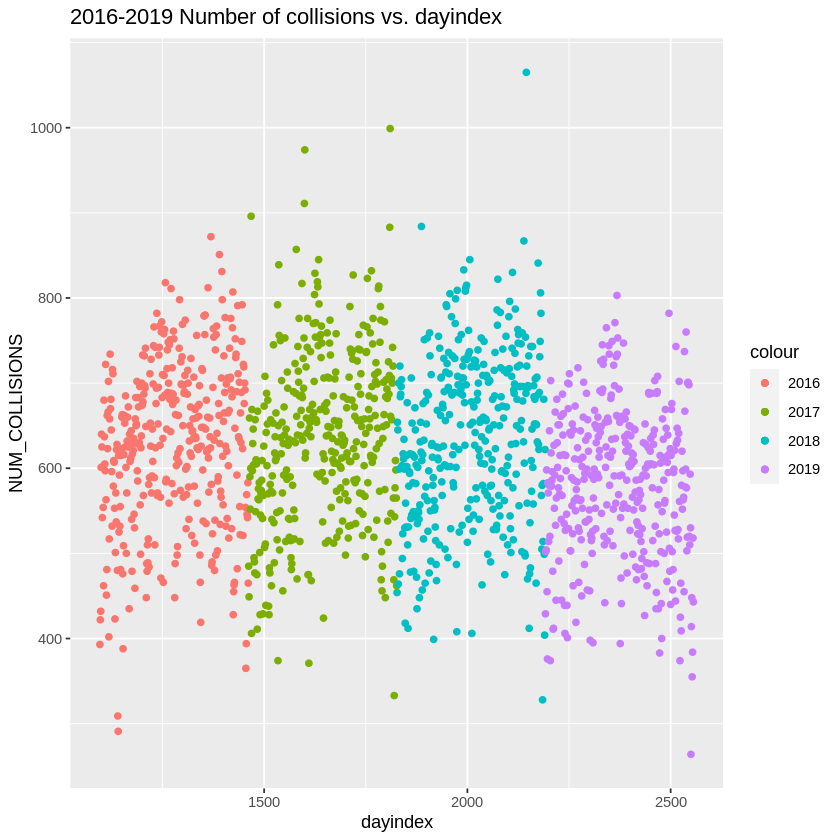

In [77]:
# plot the number of collisions vs. dayindex for 2016-2019
ggplot() +
geom_point(data = collisions_v2_2016a, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayindex")

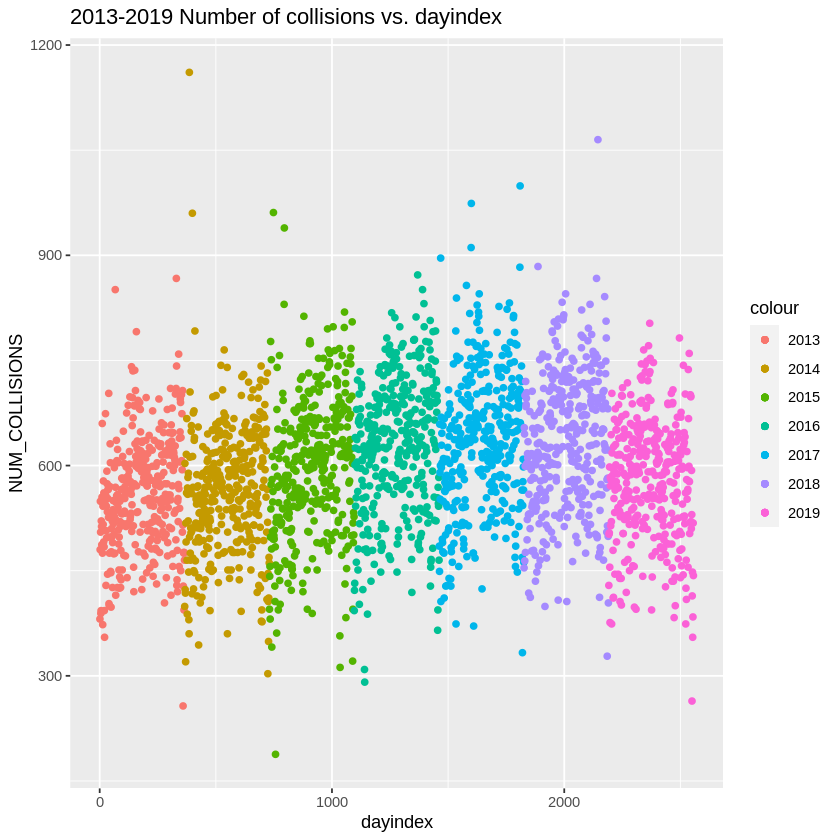

In [78]:
# plot the number of collisions vs. dayindex for 2013-2019
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
geom_point(data = collisions_v2_2016a, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2013-2019 Number of collisions vs. dayindex")

There is a noticeable increase in the number of collisions from year to year, but for 2019 a decrease is visible compared to the previous year.
The seasonal pattern described before seems to be confirmed here as well.

#### **3. Number of collisions vs. Temperature**

The graphs below show the relation between the number of collisions and the temperature. The first chart covers data for the years 2012-2020, while the second shows data without 2012 and 2020.

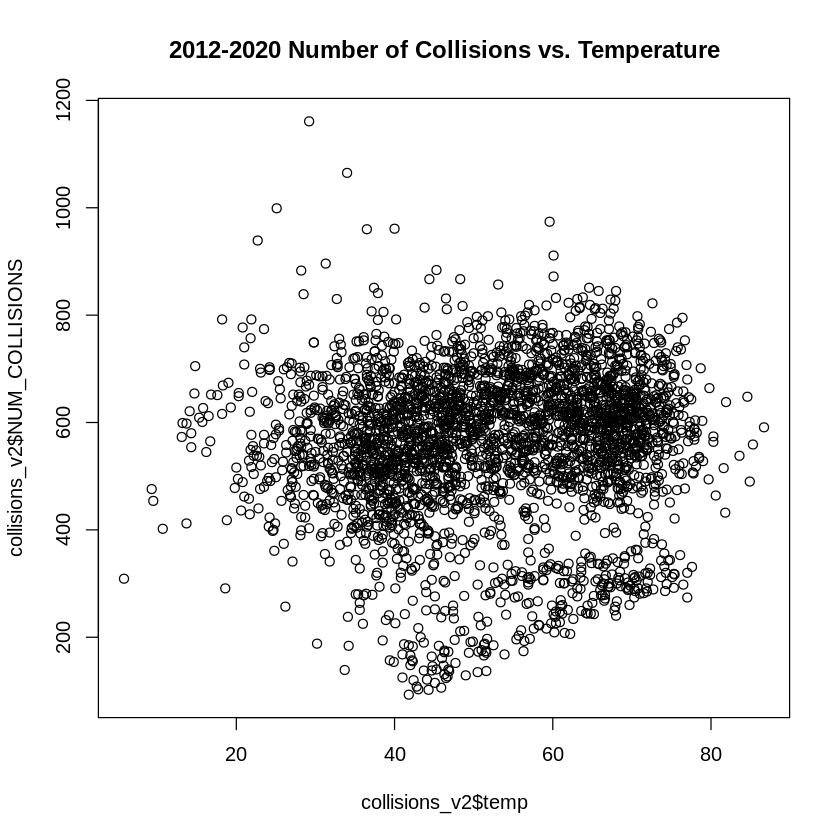

In [79]:
# plot the number of collisions and temperature for 2012-2020 collisions_v2
plot(collisions_v2$temp, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Temperature")

In [80]:
# correlation between collisions and temperature for 2012-2020 collisions_v2
cor(collisions_v2$temp, collisions_v2$NUM_COLLISIONS)

[1] 0.07486279

`geom_smooth()` using formula 'y ~ x'



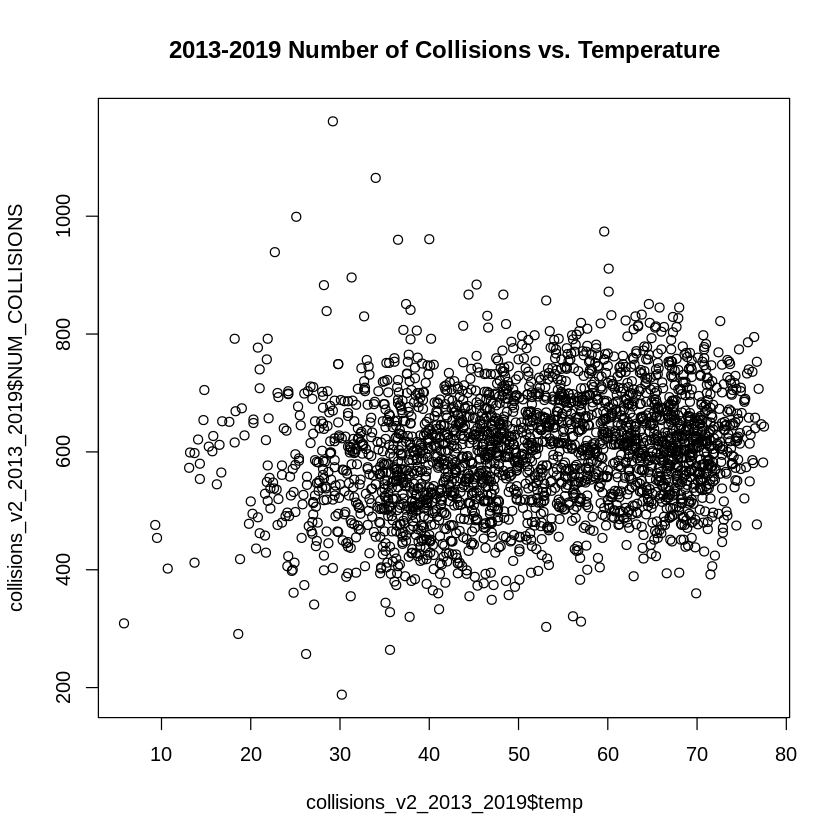

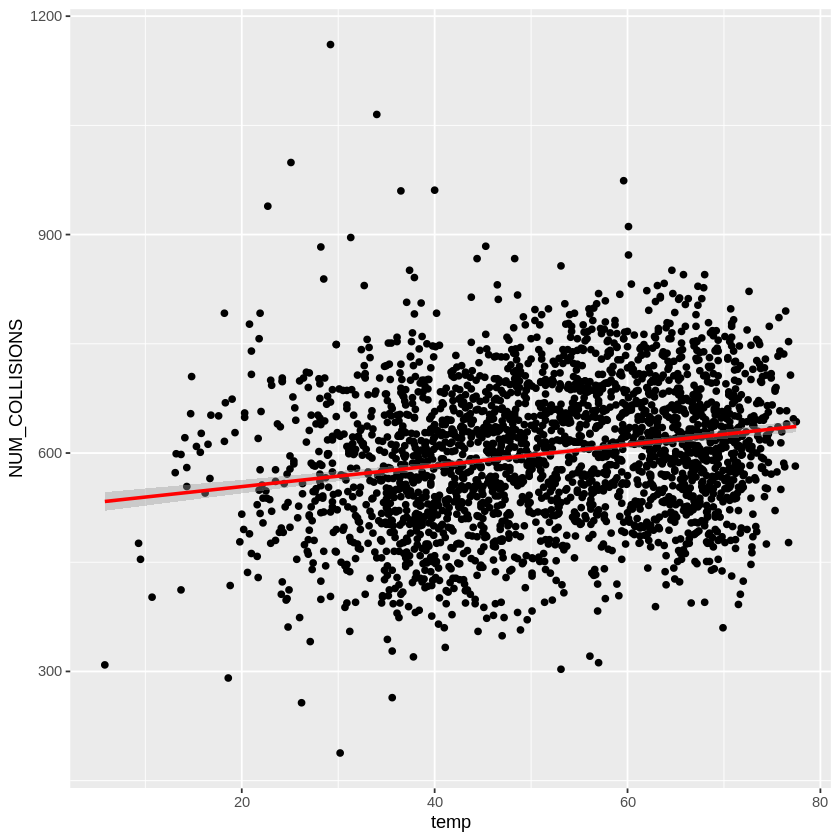

In [81]:
# plot the number of collisions and temperature for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$temp, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Temperature")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = temp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [82]:
cor(collisions_v2_2013_2019$temp, collisions_v2_2013_2019$NUM_COLLISIONS)

[1] 0.203015

For the data from all years, the correlation is quite low, however, rejecting the data from 2012 and 2020, this indicator increases significantly. There is also a positive relationship between the number of collisions and the temperature. Accordingly, the temperature will be taken into the data for linear regression.

#### **4. Number of collisions vs. Day, temp, max, min**

Let's look at the relationship of the number of collisions with the maximum and minimum temperature. For the summary view, the scatterplot matrix was used, in which the days (1-7) and the temperature studied earlier were taken into account. Again, the first graph is for 2012-2020 and the second for years between 2013 and 2019.

In [83]:
# load library
library(lattice)

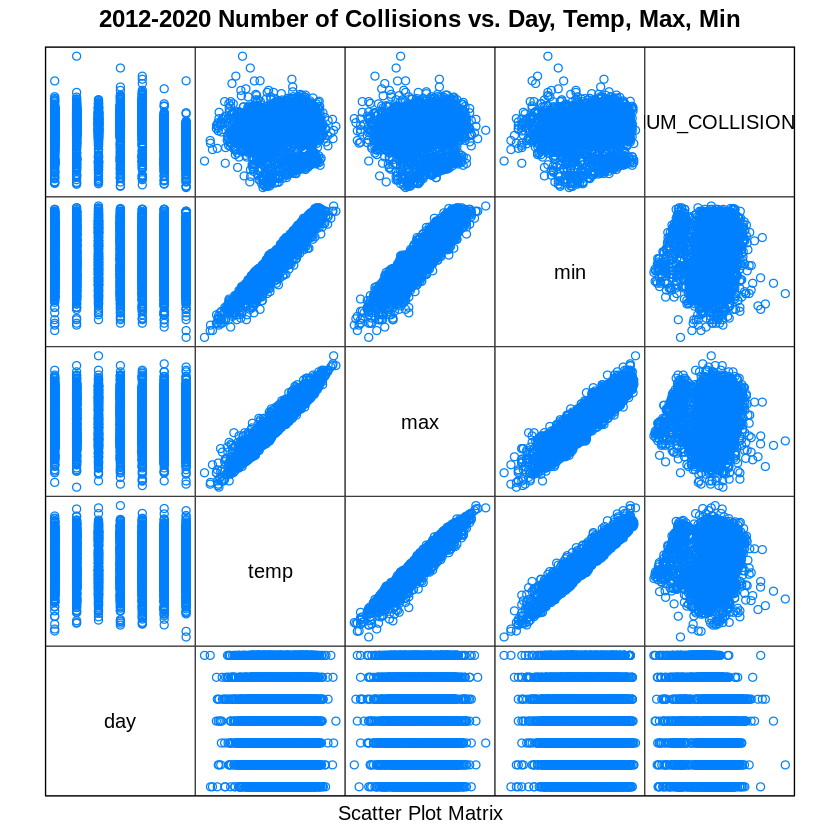

In [84]:
# splom for day of the week, temperature, max temp adn min temp and number of collisions for 2012-2020 collisions_v2
splom(~ collisions_v2[,c(1, 6, 13, 14, 18)], groups=NULL, data=collisions_v2,
axis.line.tck=0, axis.text.alpha=0, main="2012-2020 Number of Collisions vs. Day, Temp, Max, Min")

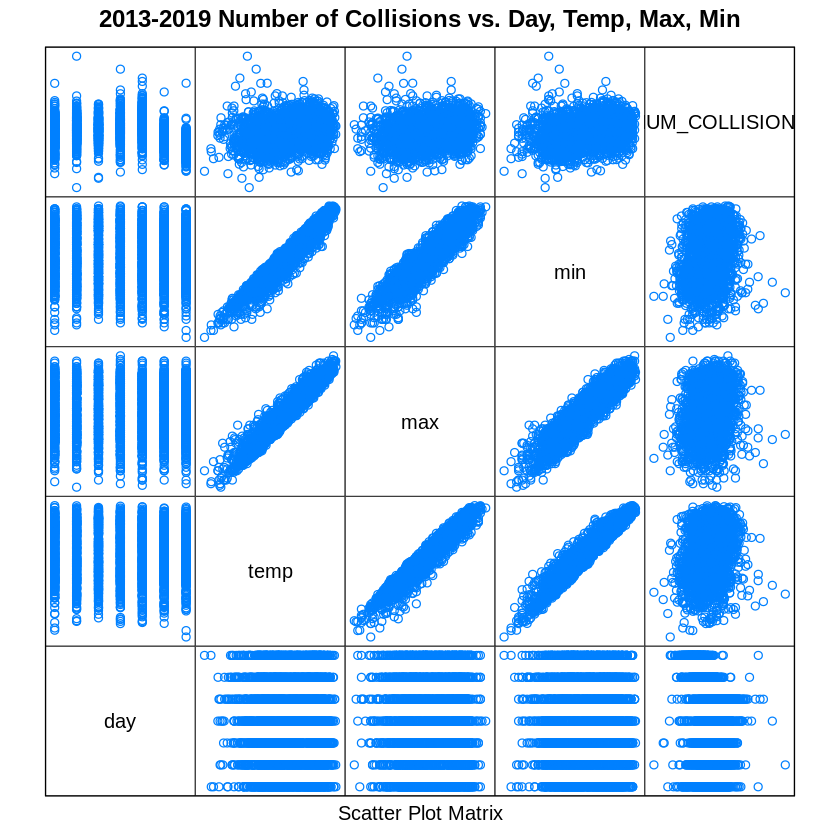

In [85]:
# splom for day of the week, temperature, max temp adn min temp and number of collisions for 2013-2019 collisions_v2
splom(~ collisions_v2_2013_2019[,c(1, 6, 13, 14, 18)], groups=NULL, data=collisions_v2,
axis.line.tck=0, axis.text.alpha=0, main="2013-2019 Number of Collisions vs. Day, Temp, Max, Min")

As we established earlier, this temperature will be included in the data for linear regression. For this reason, it seems unnecessary to take into account additional factors of temperature, such as its minimum and maximum temperature.

#### **5. Number of collisions vs. PRCP**

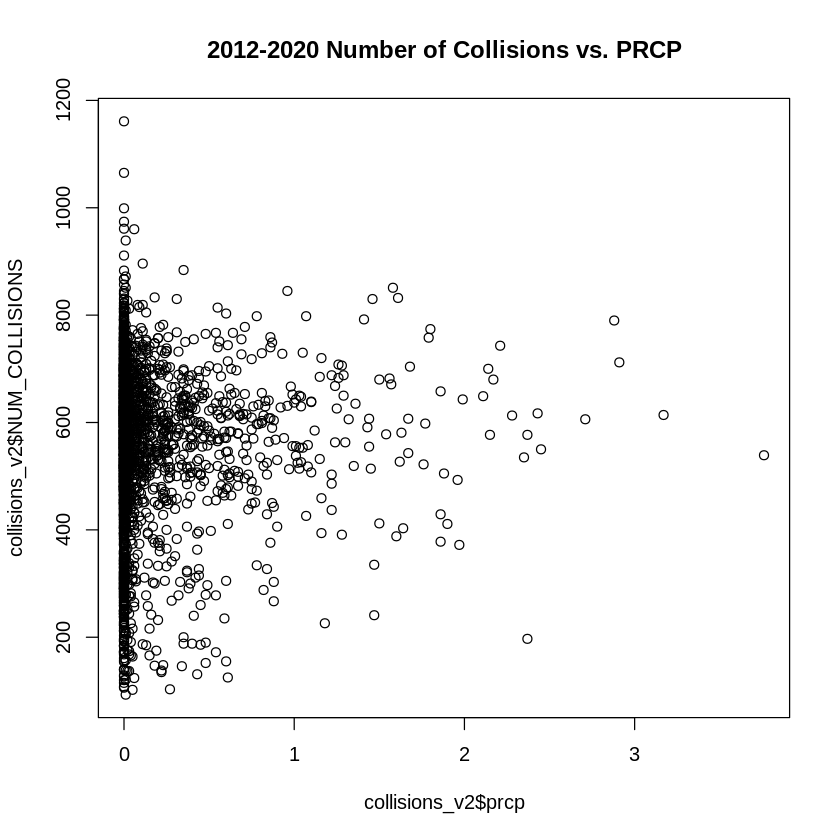

In [86]:
# plot the number of collisions and prcp for 2012-2020 collisions_v2
plot(collisions_v2$prcp, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. PRCP")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 17 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 17 rows containing missing values (geom_point).”


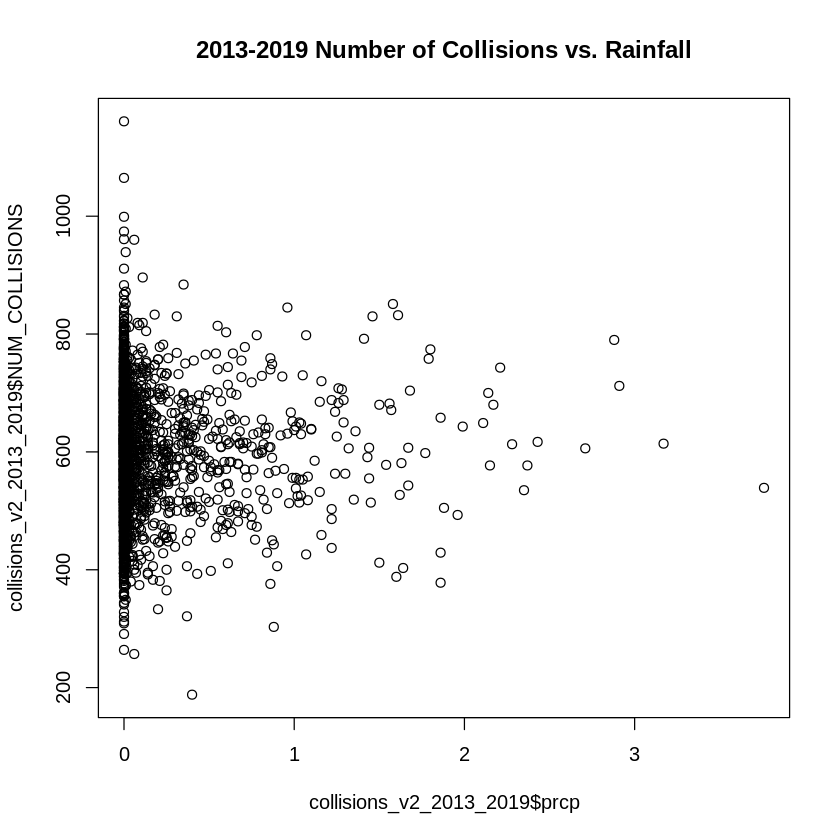

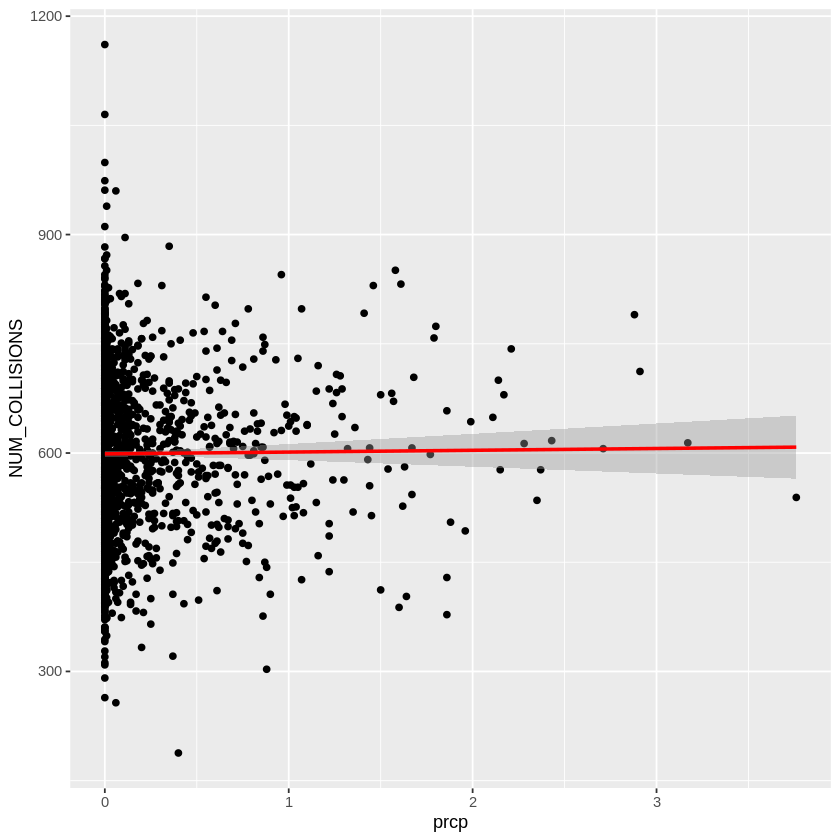

In [87]:
# plot the number of collisions and prcp for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$prcp, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Rainfall")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = prcp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [88]:
# correlation between the number of collisions and prcp for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$prcp, collisions_v2_2013_2019$NUM_COLLISIONS, use = "complete.obs")

[1] 0.008055173

Precipitation data does not appear to have a large impact on the number of collisions - correlation value is pretty small (0.01). This indicator will be omitted from the data for linear regression.

#### **6. Number of collisions vs. Wind speed**

The graphs below show the relation between the number of collisions and the wind speed. The first chart covers data for the years 2012-2020, while the second shows data without 2012 and 2020.

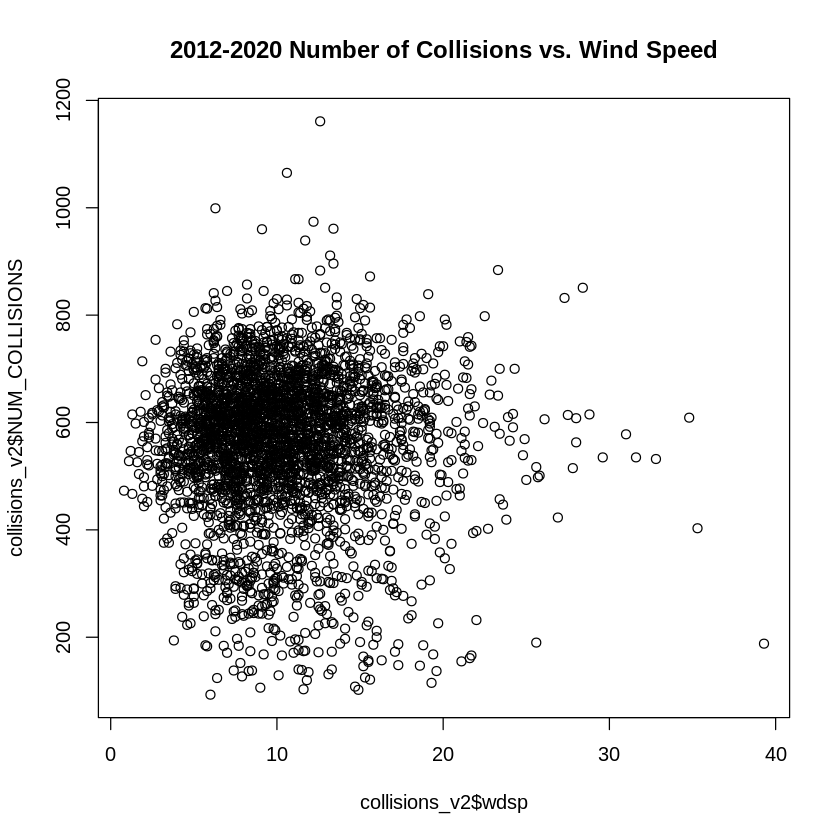

In [89]:
# plot the number of collisions and wdsp for 2012-2020 collisions_v2
plot(collisions_v2$wdsp, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Wind Speed")

In [90]:
# correlation between the number of collisions and wdsp for 2012-2020 collisions_v2
cor(collisions_v2$wdsp, collisions_v2$NUM_COLLISIONS)

[1] -0.008115542

`geom_smooth()` using formula 'y ~ x'



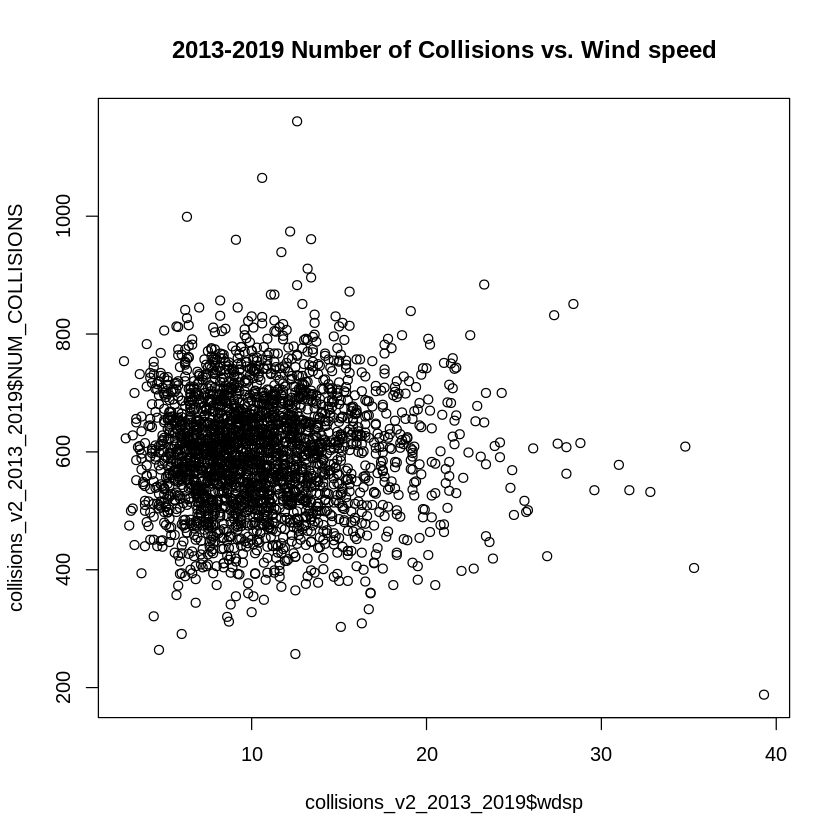

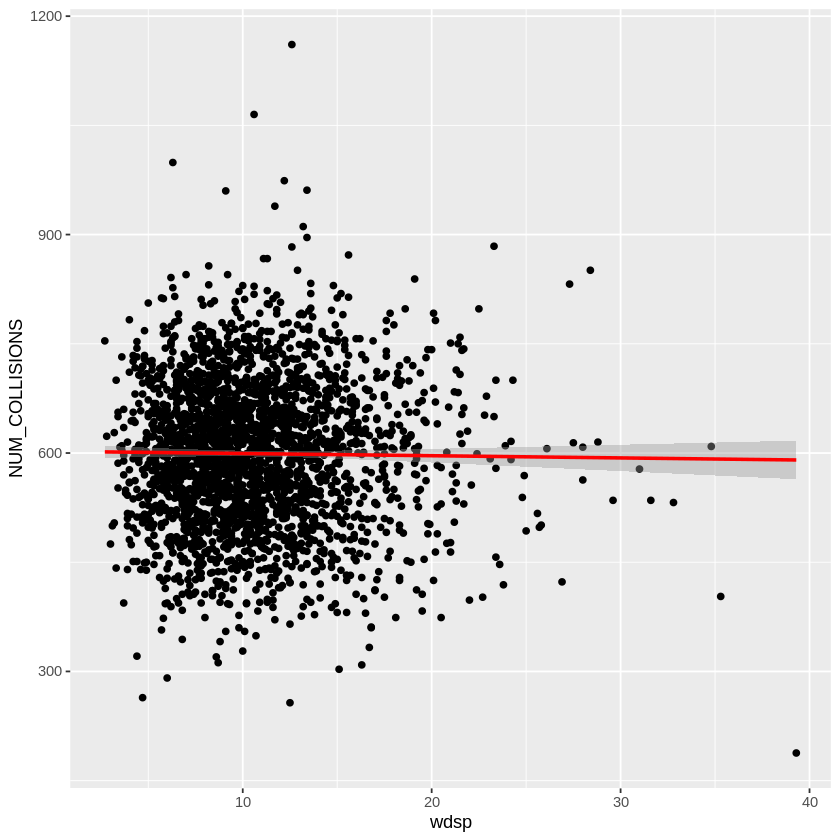

In [91]:
# plot the number of collisions and wind speed for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$wdsp, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Wind speed")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = wdsp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [92]:
# correlation between the number of collisions and wdsp for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$wdsp, collisions_v2_2013_2019$NUM_COLLISIONS)

[1] -0.01280795

It is a very weak negative linear relationship (-0.13) between the number of collisions and the wind speed.

#### **7. Number of collisions vs. Dew point**

The graphs below show the relation between the number of collisions and the dew point. The first chart covers data for the years 2012-2020, while the second shows data without 2012 and 2020.

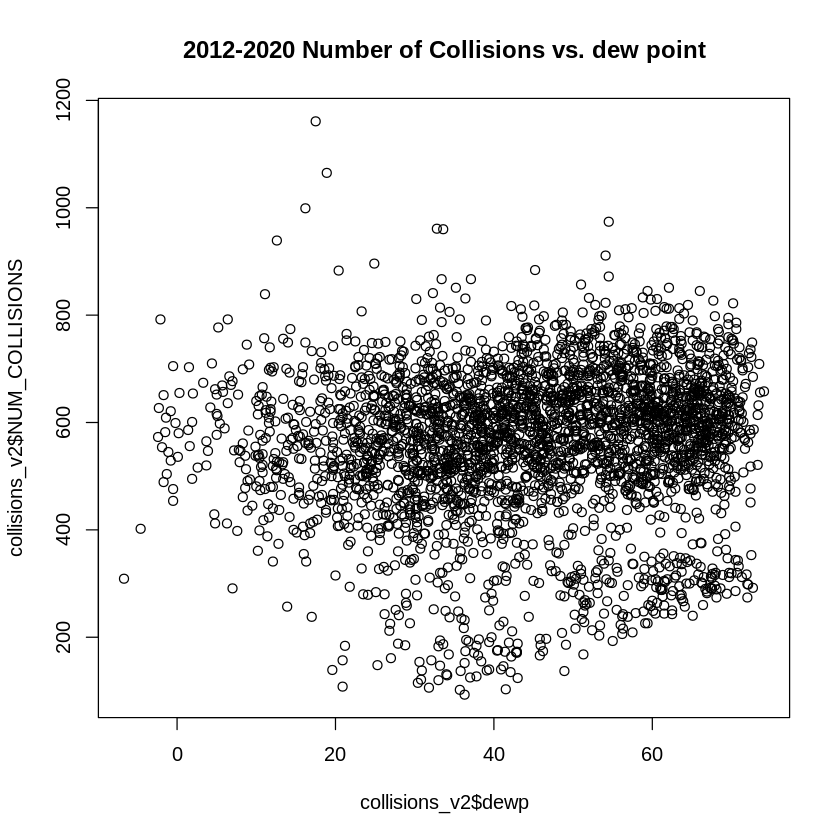

In [93]:
# plot the number of collisions and dewp for 2012-2020 collisions_v2
plot(collisions_v2$dewp, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. dew point")

In [94]:
# correlation between the number of collisions and dewp for 2012-2020 collisions_v2
cor(collisions_v2$dewp, collisions_v2$NUM_COLLISIONS, use = "complete.obs")

[1] 0.08320355

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


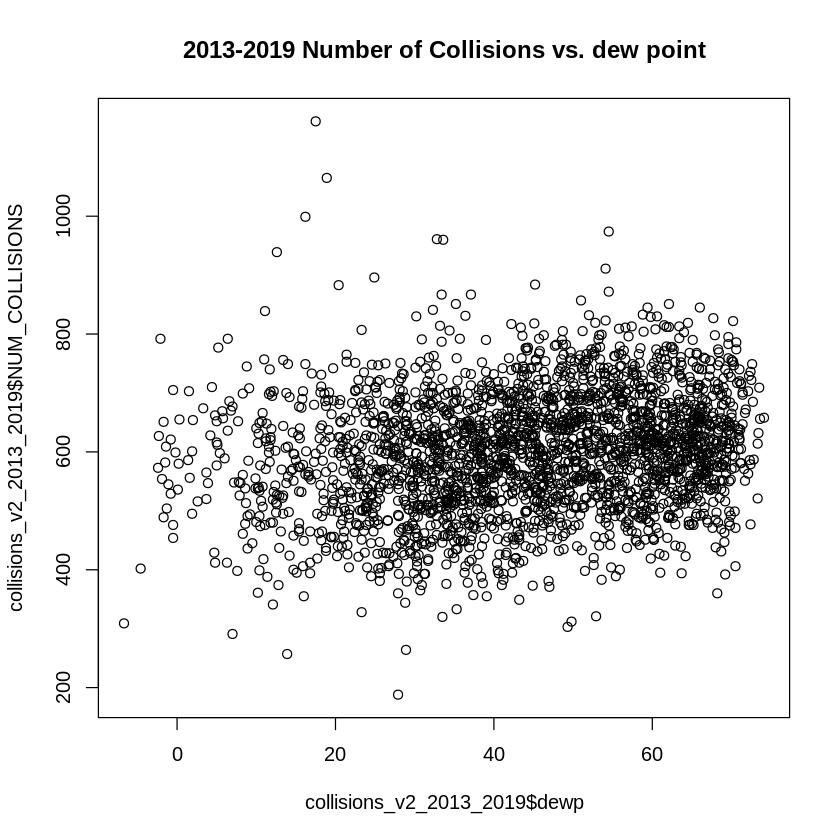

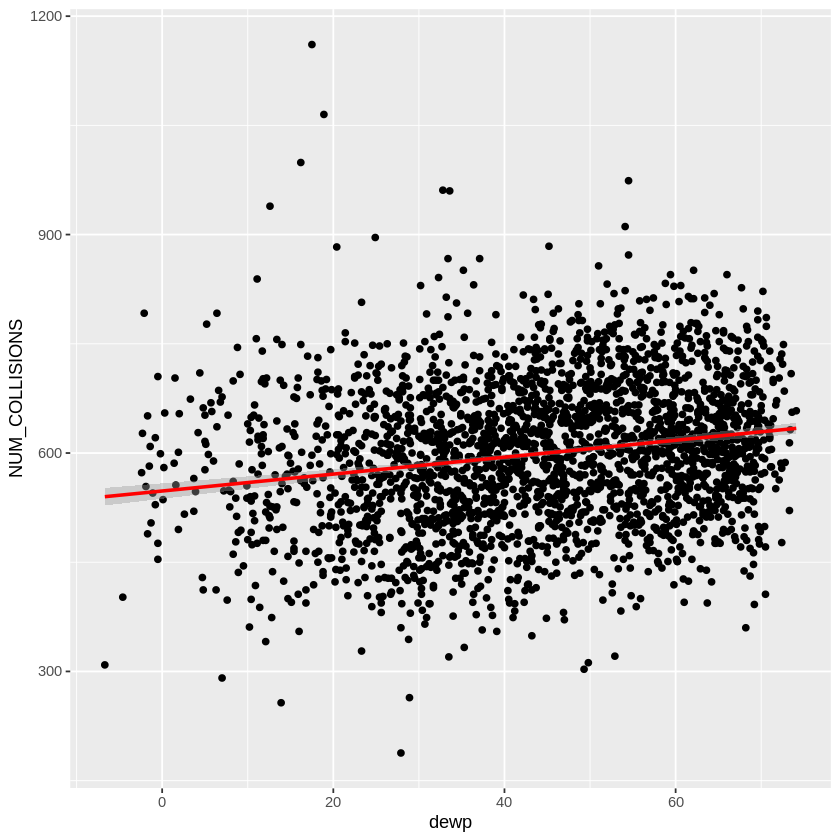

In [95]:
# plot the number of collisions and dew point for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$dewp, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. dew point")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = dewp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [96]:
# correlation between the number of collisions and dewp for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$dewp, collisions_v2_2013_2019$NUM_COLLISIONS, use = "complete.obs")

[1] 0.1968754

There is a visible positive relationship between the dew point and the number of collisions and the corelation value is not too small (0.2) for years 2013-2019. It is worth considering this factor in the data for linear regression.

#### **8. Number of collisions vs. Visability**

The graphs below show the relation between the number of collisions and the visability. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

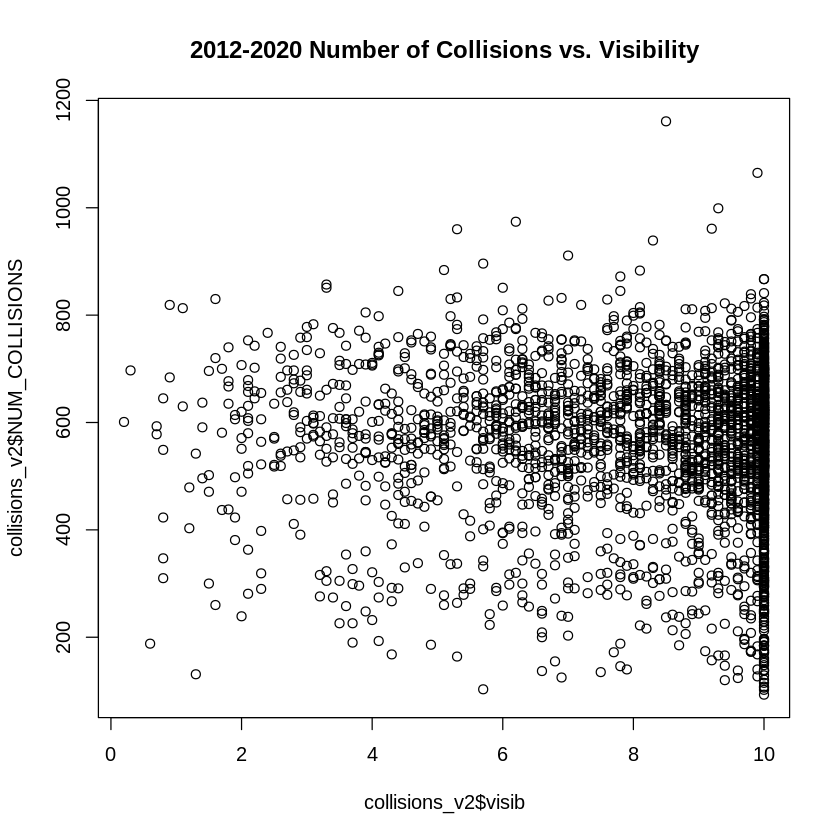

In [97]:
# plot the number of collisions and visibility for 2012-2020 collisions_v2
plot(collisions_v2$visib, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Visibility")

In [98]:
# correlation between the number of collisions and visability for 2012-2020 collisions_v2
cor(collisions_v2$visib, collisions_v2$NUM_COLLISIONS)

[1] -0.03980247

`geom_smooth()` using formula 'y ~ x'



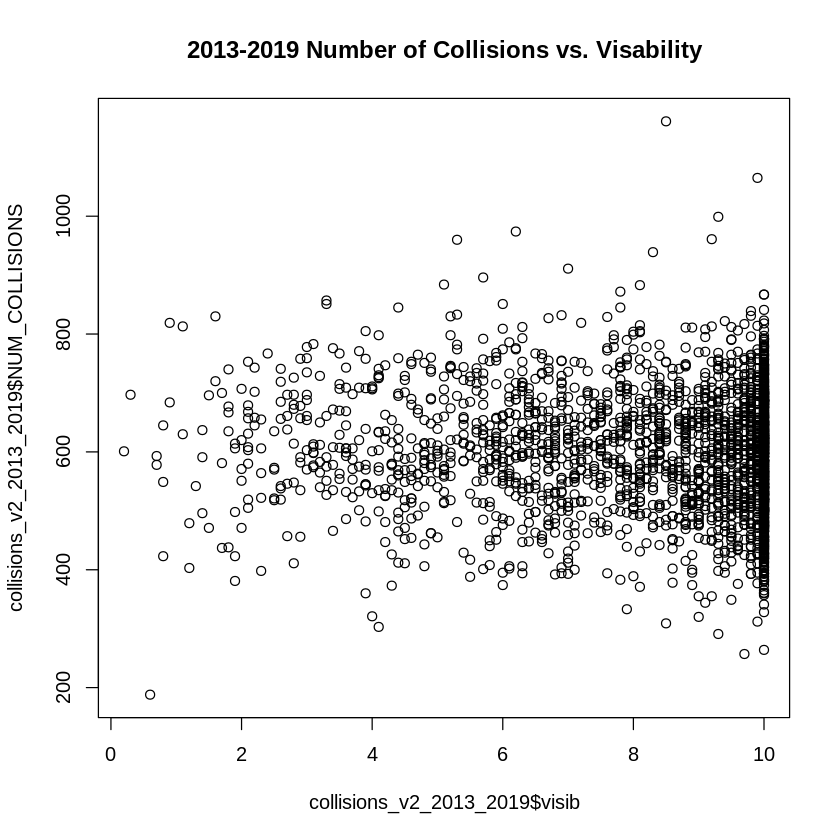

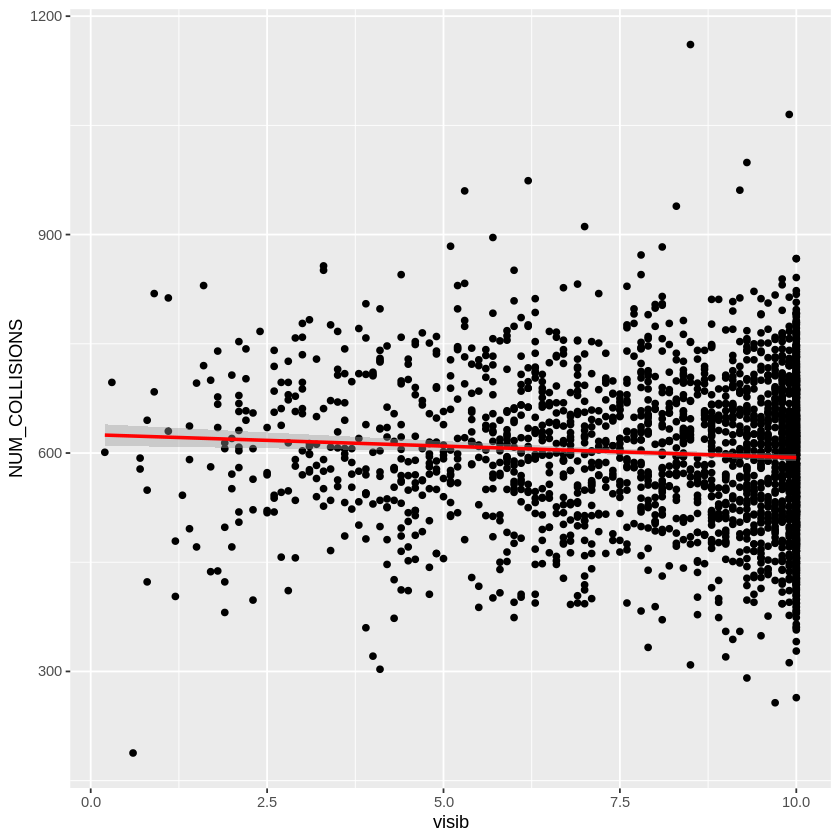

In [99]:
# plot the number of collisions and visablity for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$visib, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Visability")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = visib, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [100]:
# correlation between the number of collisions and visability for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$visib, collisions_v2_2013_2019$NUM_COLLISIONS)

[1] -0.06936653

A negative linear relationship is visible, however, the value of the correlation index it is not very significant (-0.69). Visability will not be taken into account. 

#### **9. Number of collisions vs. Snow depth**

The graphs below show the relation between the number of collisions and the snow depth. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

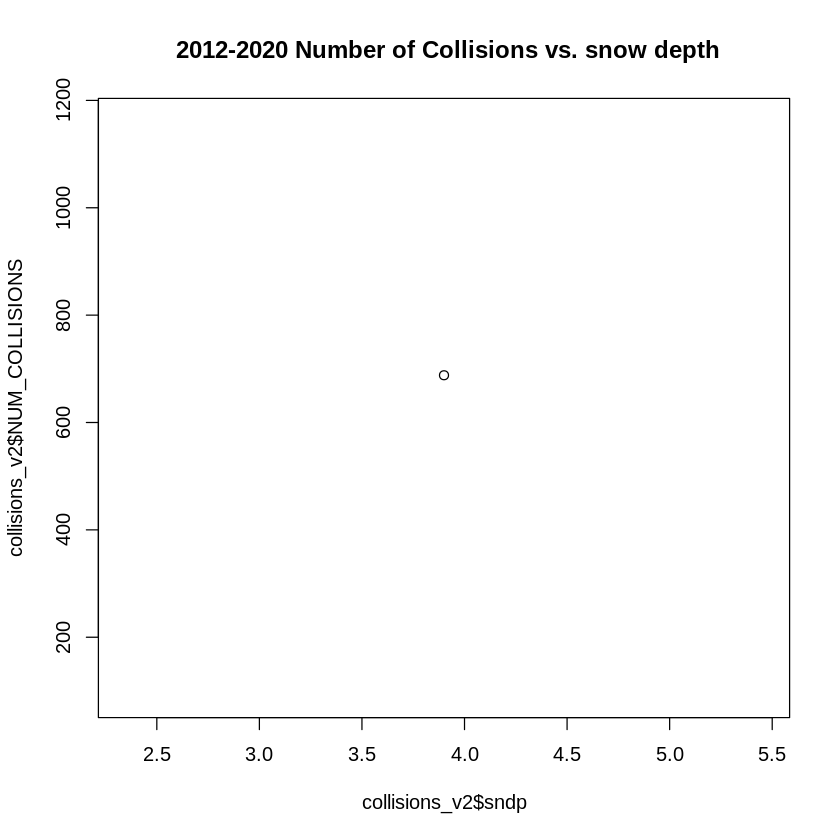

In [101]:
# plot the number of collisions vs. snow depth for 2012-2020 collisions_v2
plot(collisions_v2$sndp, collisions_v2$NUM_COLLISIONS, main=" 2012-2020 Number of Collisions vs. snow depth")

In [102]:
summary(collisions_v2_2013_2019$sndp)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
     NA      NA      NA     NaN      NA      NA    2556 

Due to the number of missing values for snow depth that is impossible to analyse relation between this factor and the number of collisions. This factor will be ignored.

#### **10. Number of collisions vs. Fog**

The graphs below show the relation between the number of collisions and fog. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

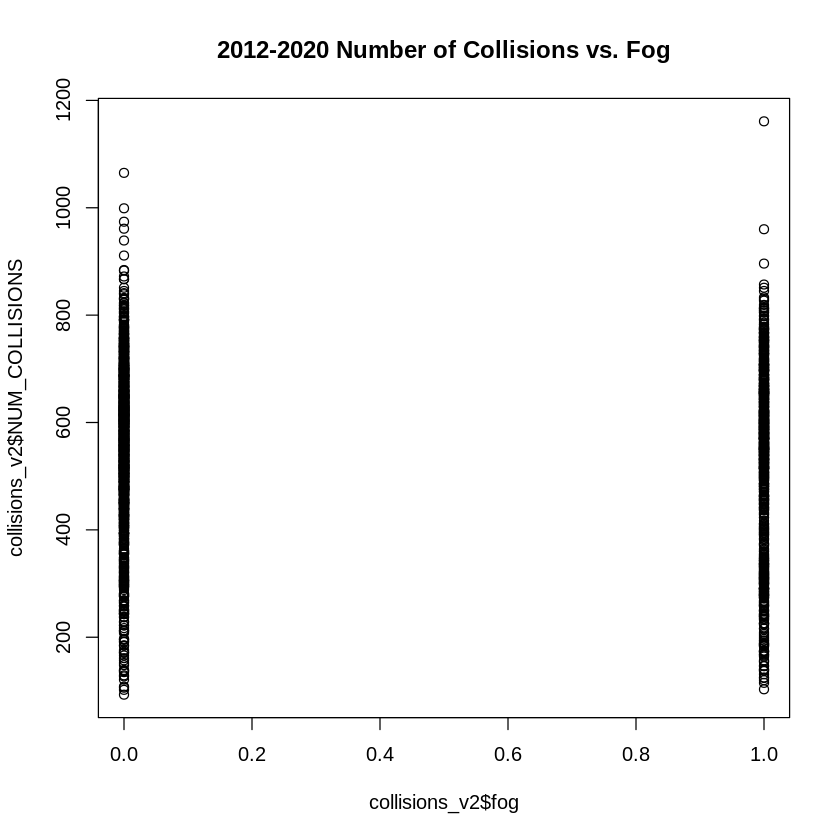

In [103]:
# plot the number of collisions vs. fog for 2012-2020 collisions_v2
plot(collisions_v2$fog, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Fog")

`geom_smooth()` using formula 'y ~ x'



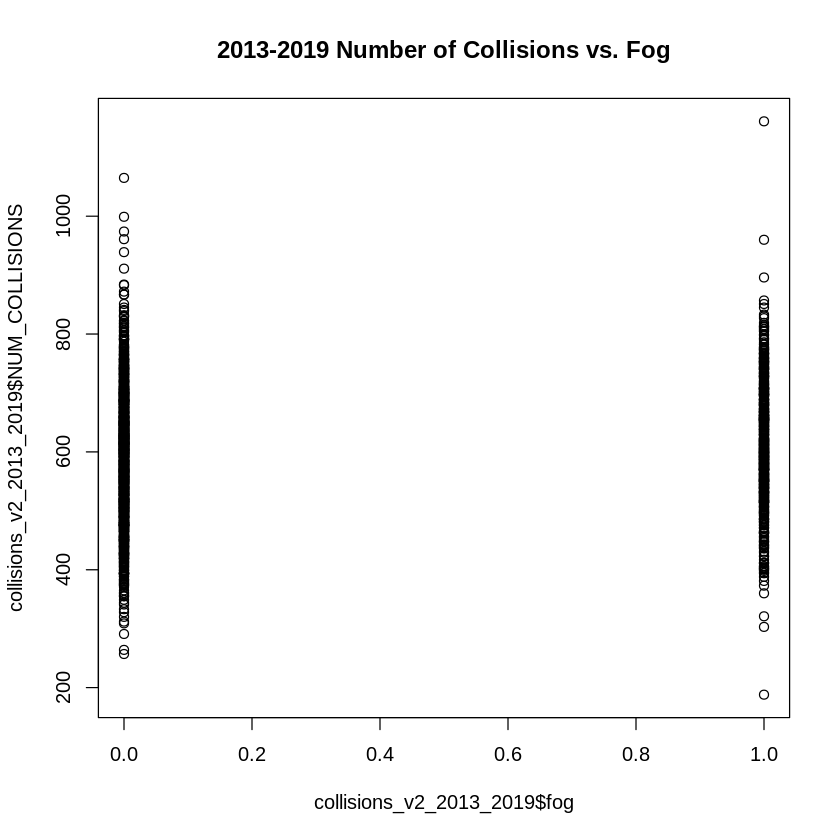

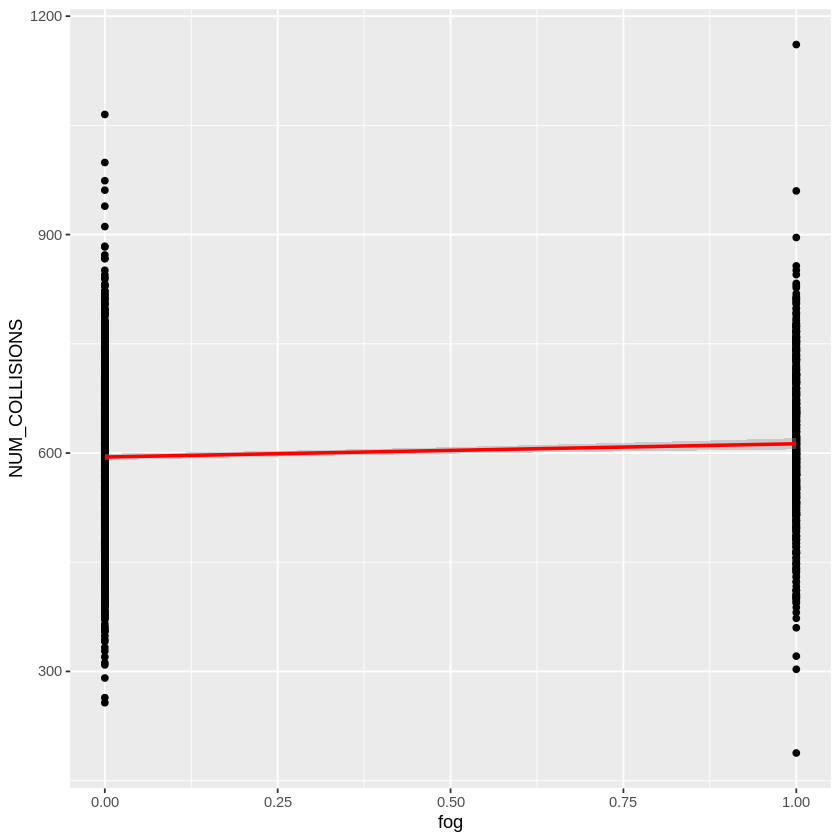

In [104]:
# plot the number of collisions and for for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$fog, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Fog")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = fog, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [105]:
# correlation between the number of collisions and fog for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$fog, collisions_v2_2013_2019$NUM_COLLISIONS)

[1] 0.07890563

The value of the correlation is not it is not very significant (0.79). Despite the slight positive relationship between fog and collision number, this factor will not be included in the data for linear regression.

#### **11. Number of collisions vs. Sea level pressure (SLP)**

The graphs below show the relation between the number of collisions and the sea level pressure. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

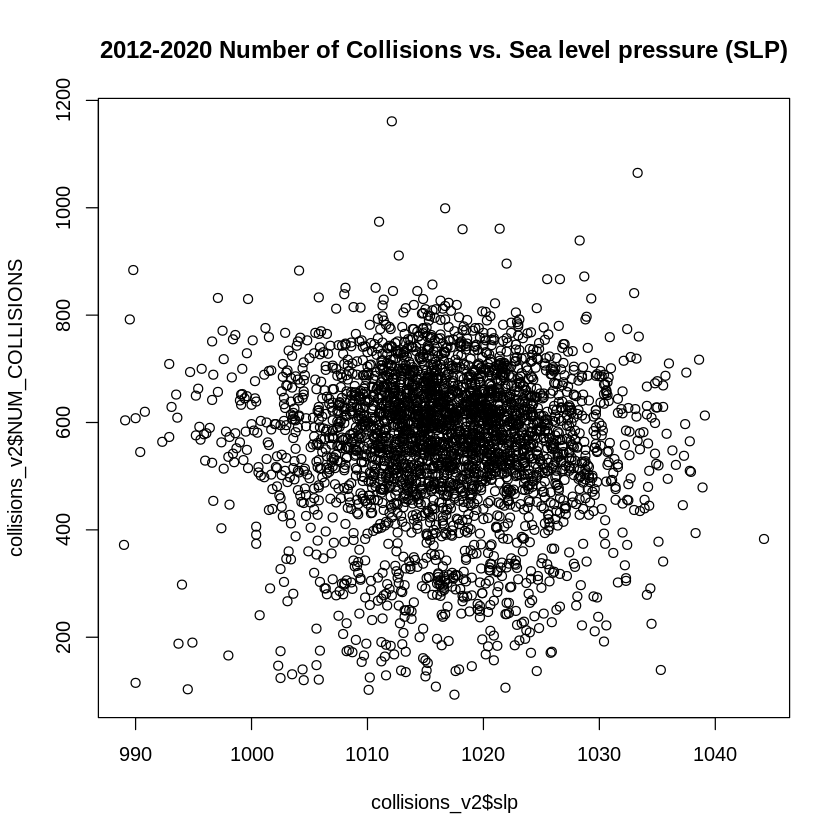

In [106]:
# plot the number of collisions vs. slp for 2012-2020 collisions_v2
plot(collisions_v2$slp, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Sea level pressure (SLP)")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”


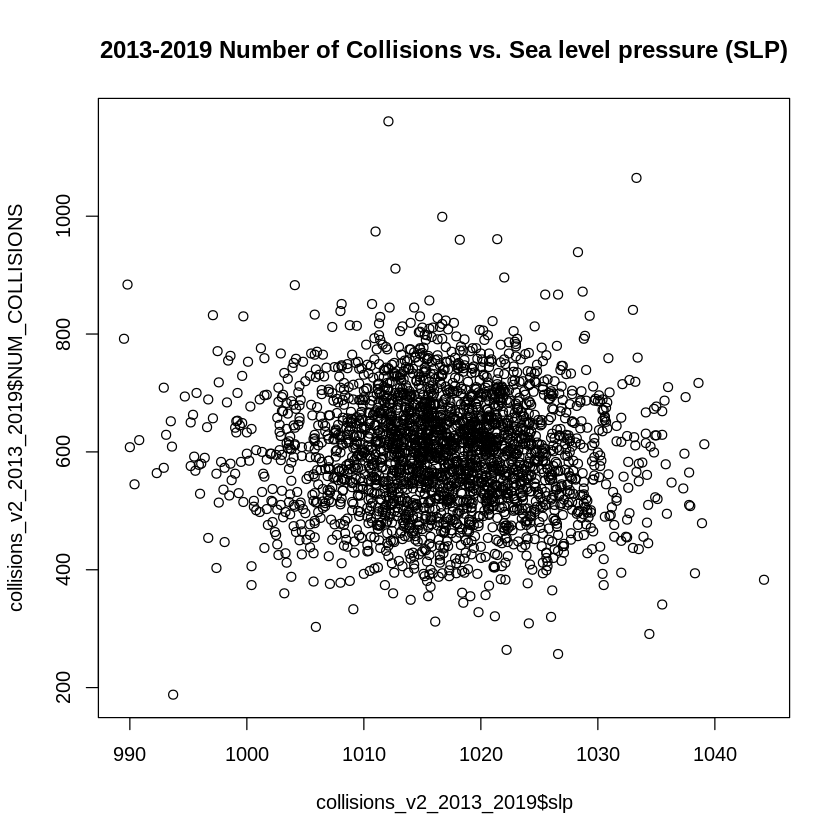

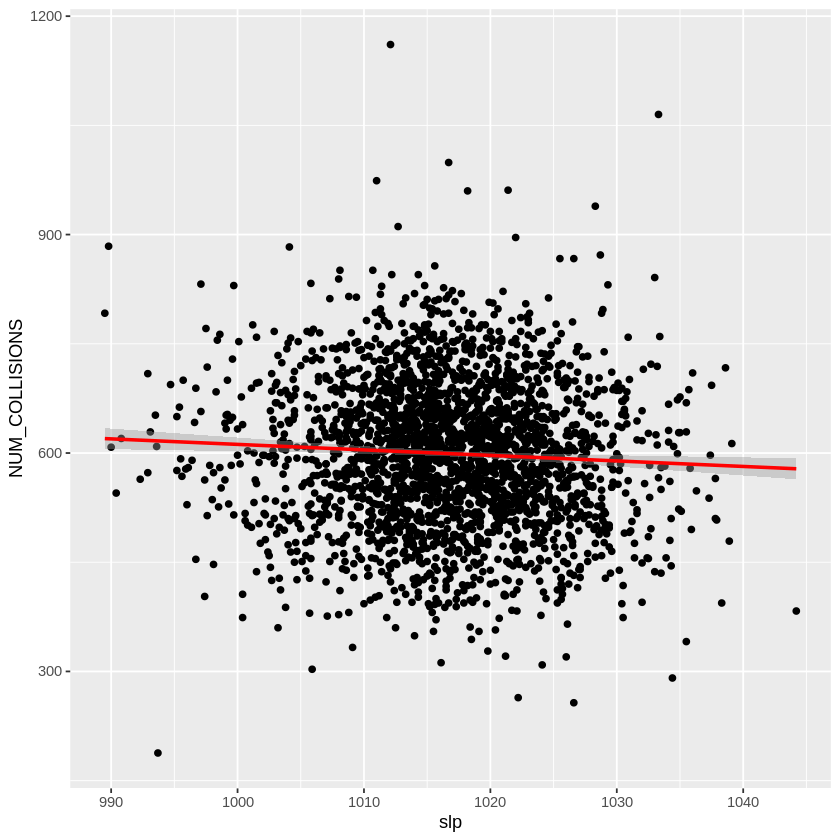

In [107]:
# plot the number of collisions and slp for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$slp, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Sea level pressure (SLP)")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = slp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [108]:
# correlation between the number of collisions and slp for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$slp, collisions_v2_2013_2019$NUM_COLLISIONS, use = "complete.obs")

[1] -0.05762012

A negative linear relationship is visible, however, the value of the correlation is very low (-0.06). Sea level pressure will not be taken into account in data for linear regression.

#### **12. Number of collisions vs. Maximum sustained wind speed (MXPSD)**

The graphs below show the relation between the number of collisions and the max sustained wind speed. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

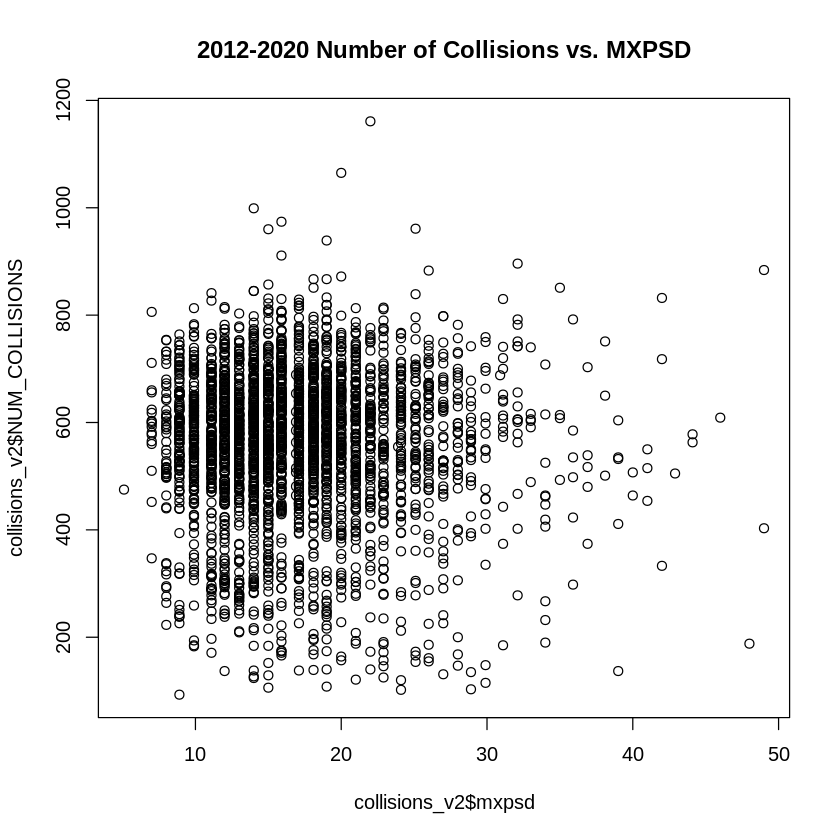

In [109]:
# plot the number of collisions vs. mxpsd for 2012-2020 collisions_v2
plot(collisions_v2$mxpsd, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. MXPSD")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 3 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”


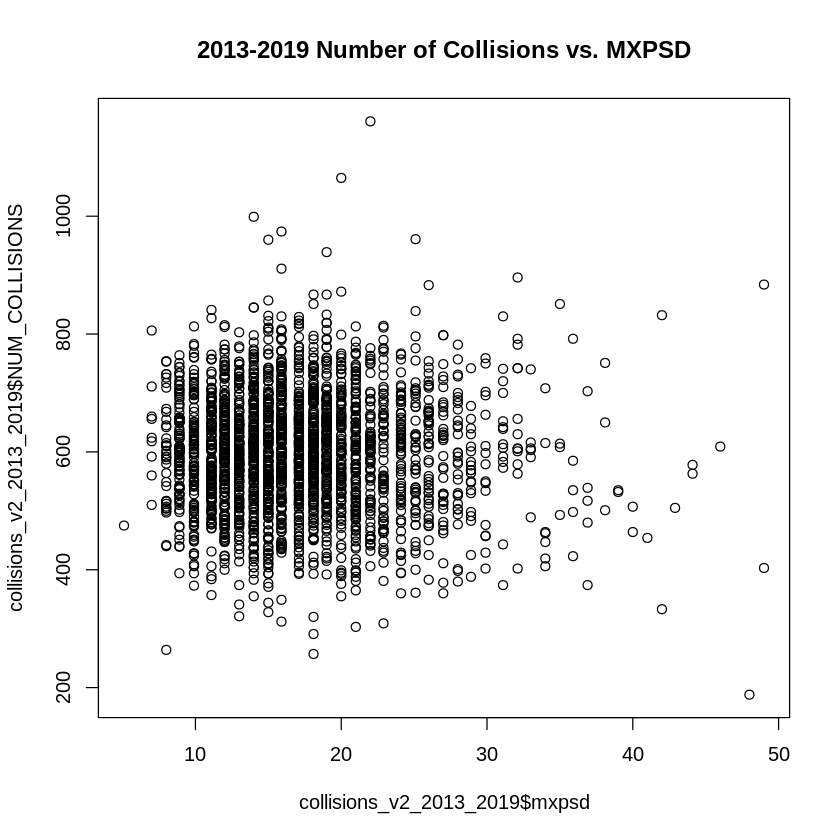

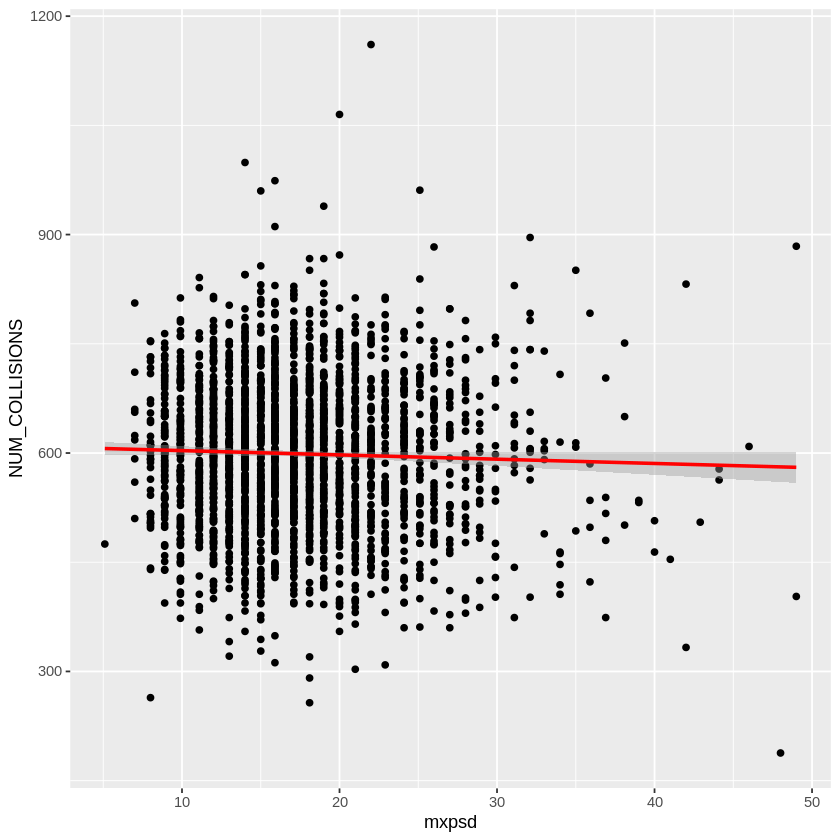

In [110]:
# plot the number of collisions and mxpsd for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$mxpsd, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. MXPSD")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = mxpsd, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [111]:
# correlation between the number of collisions and mxpsd for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$mxpsd, collisions_v2_2013_2019$NUM_COLLISIONS, use = "complete.obs")

[1] -0.03433594

A negative linear relationship is visible, however, the value of the correlation is not significant (-0.03). Maximum sustained wind speed will not be taken into account in data for linear regression.

#### **13. Number of collisions vs. Maximum wind gust (GUST)**

The graphs below show the relation between the number of collisions and the maximum wind gust. The first chart covers data for years 2012-2020, while the second shows data without 2012 and 2020.

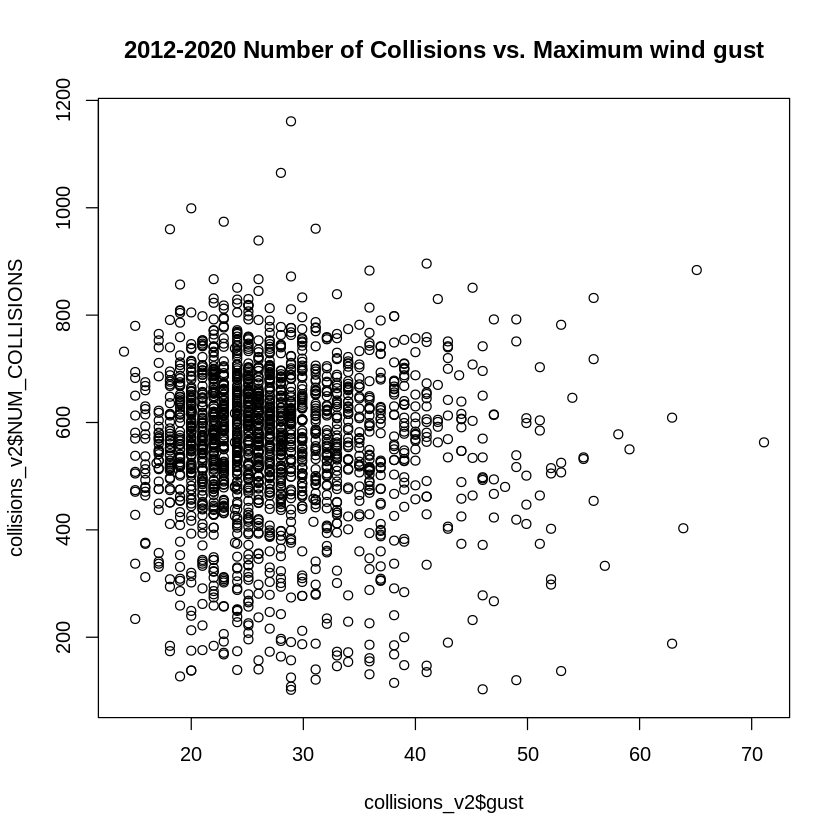

In [112]:
# plot the number of collisions vs. gust for 2012-2020 collisions_v2
plot(collisions_v2$gust, collisions_v2$NUM_COLLISIONS, main="2012-2020 Number of Collisions vs. Maximum wind gust")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 927 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 927 rows containing missing values (geom_point).”


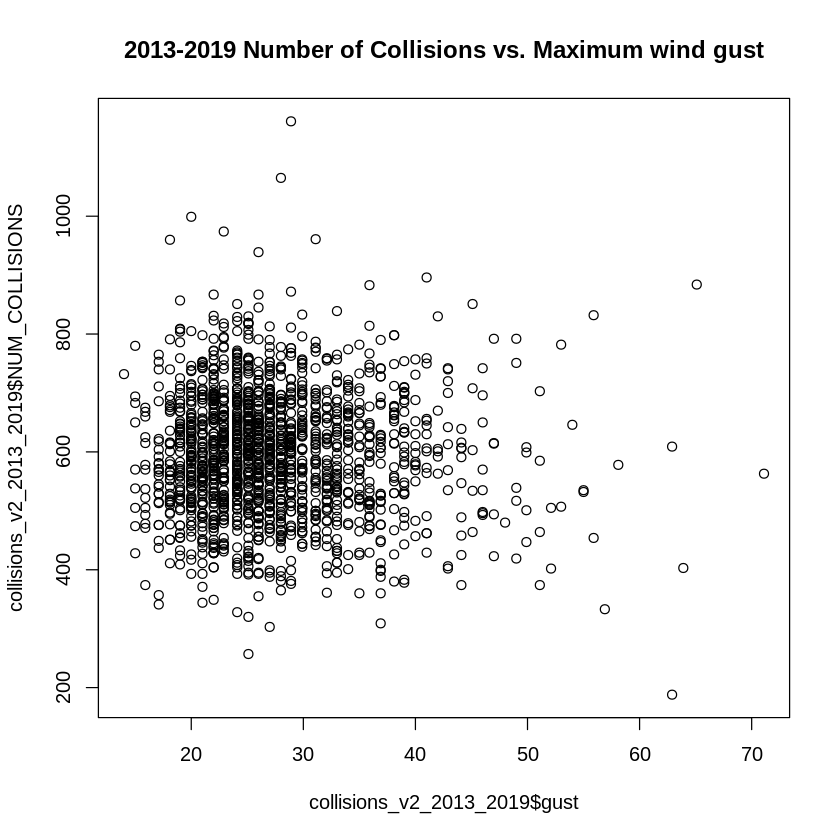

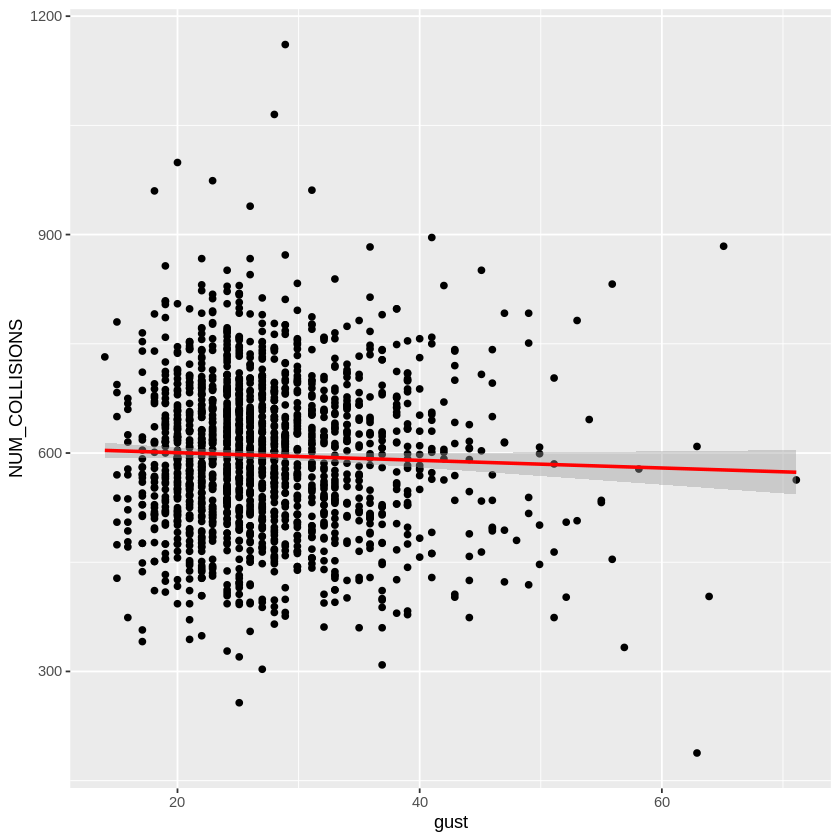

In [113]:
# plot the number of collisions and gust for 2013-2019 collisions_v2
plot(collisions_v2_2013_2019$gust, collisions_v2_2013_2019$NUM_COLLISIONS, main="2013-2019 Number of Collisions vs. Maximum wind gust")
# use ggplot with geom_smooth() to see linear trend
ggplot(collisions_v2_2013_2019, aes(x = gust, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red")

In [114]:
# correlation between the number of collisions and gust for 2013-2019 collisions_v2
cor(collisions_v2_2013_2019$gust, collisions_v2_2013_2019$NUM_COLLISIONS, use = "complete.obs")

[1] -0.03705646

The value of correlation between maximum wind gust and the number of collisions is not significant (-0.04). This factor will be ignored in data for linear regression.



---



**Conclusions after data analysis:** 

Based on the analysis, it can be stated that:

* the dataset for linear regression should contain *temperature* and *dew point* from the weather factors. Other weather factors do not showed significant correlation with the number of collisions.
* A positive relationship was noticeable between the day of the week and the number of collisions, but only for weekdays.
* Data for individual years have a noticeable pattern, however, only the years between 2013 and 2019 should be taken into account.
* The ouliers in NUM_COLLISIONS column should be removed.

### **IV. Data preparation for the Linear Regression Model and Deep Learning Neural Network Regression Model**

In this section the outliers will be removed from NUM_COLLISIONS column and the data will be standarised. Then a quick overview of the correlation between the previously selected factors and the number of collisions will be performed, the normal data distribution for NUM_COLLISIONS will be checked and then these data (selected columns) will be saved as a csv file.

One-hot encoding will be performed for the DNN model: changing months into text (e.g. 1 as January) and days of the week into text (e.g. 1 as Monday).

#### **1. Outliers**

It is worth recalling the data on the number of collisions versus dayindex for 2013-2019 before the outliers will be taken.

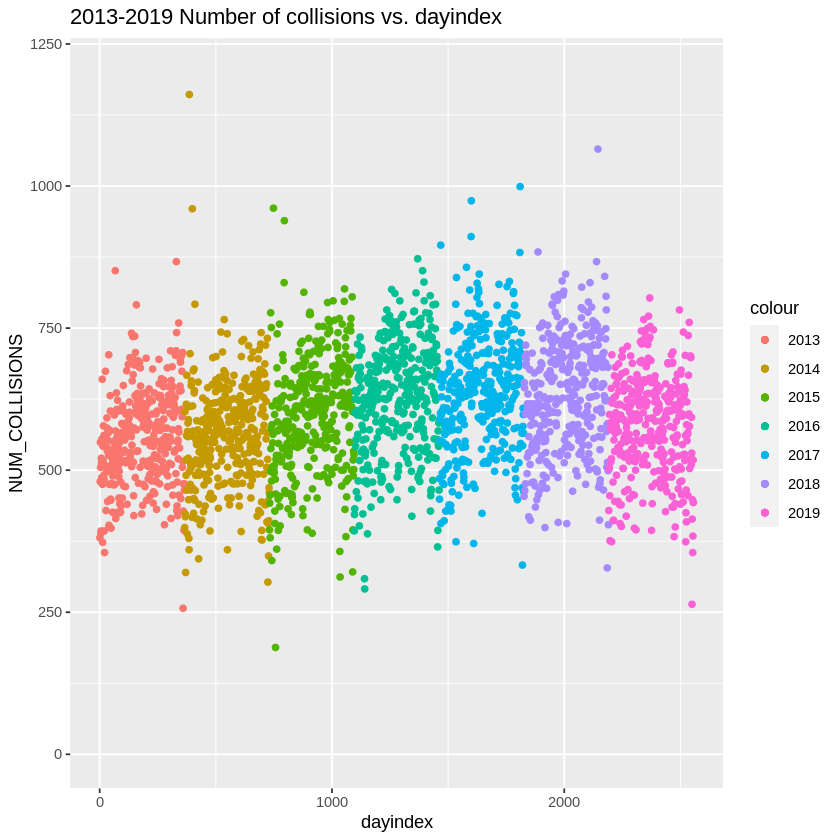

In [115]:
# plot the number of collisions vs. dayindex for 2013-2019
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
geom_point(data = collisions_v2_2016a, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2013-2019 Number of collisions vs. dayindex") + ylim(0, 1200)

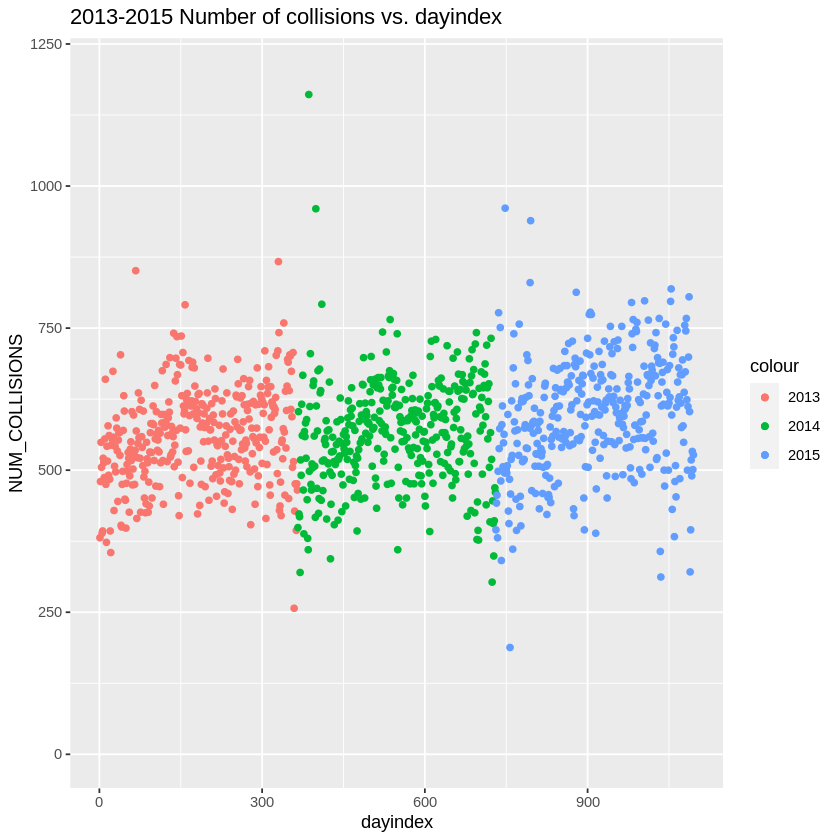

In [116]:
# plot the number of collisions vs. dayindex for 2013-2015
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayindex") + ylim(0, 1200)

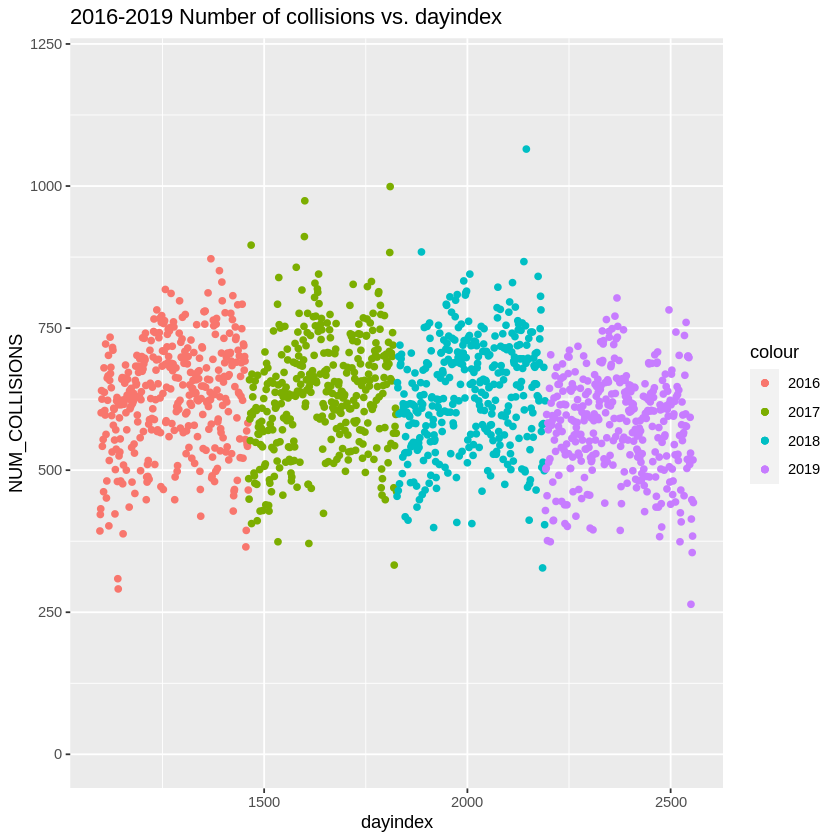

In [117]:
# plot the number of collisions vs. dayindex for 2016-2019
ggplot() +
geom_point(data = collisions_v2_2016a, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayindex") + ylim(0, 1200)

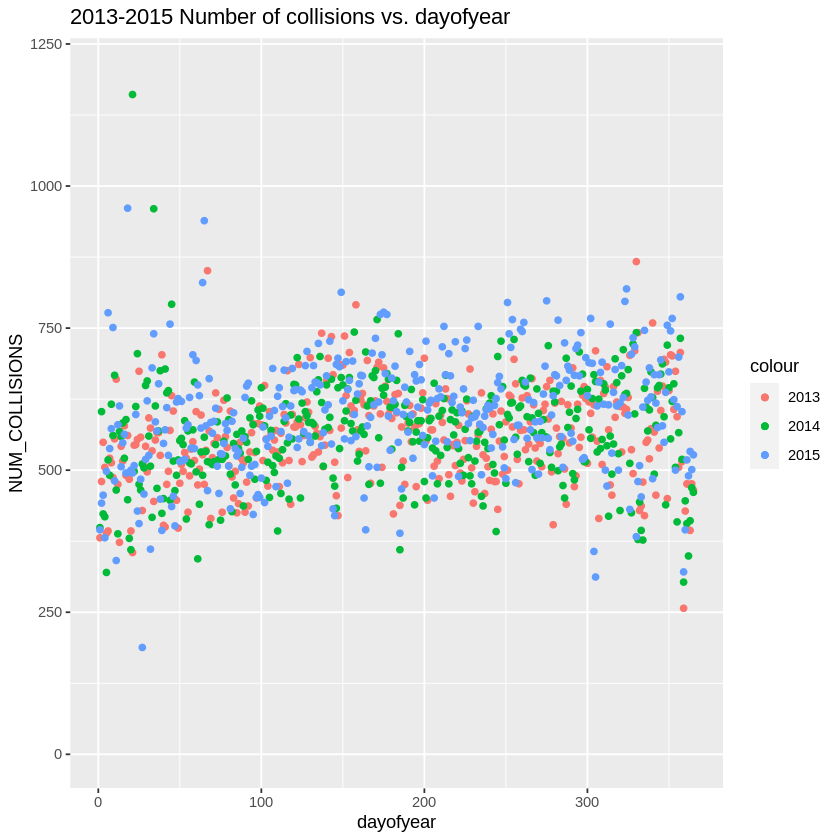

In [118]:
# plot the number of collisions vs. dayofyear for 2013-2015
ggplot() +
geom_point(data = collisions_v2_2013a, aes(dayofyear, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014a, aes(dayofyear, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015a, aes(dayofyear, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayofyear") + ylim(0, 1200)


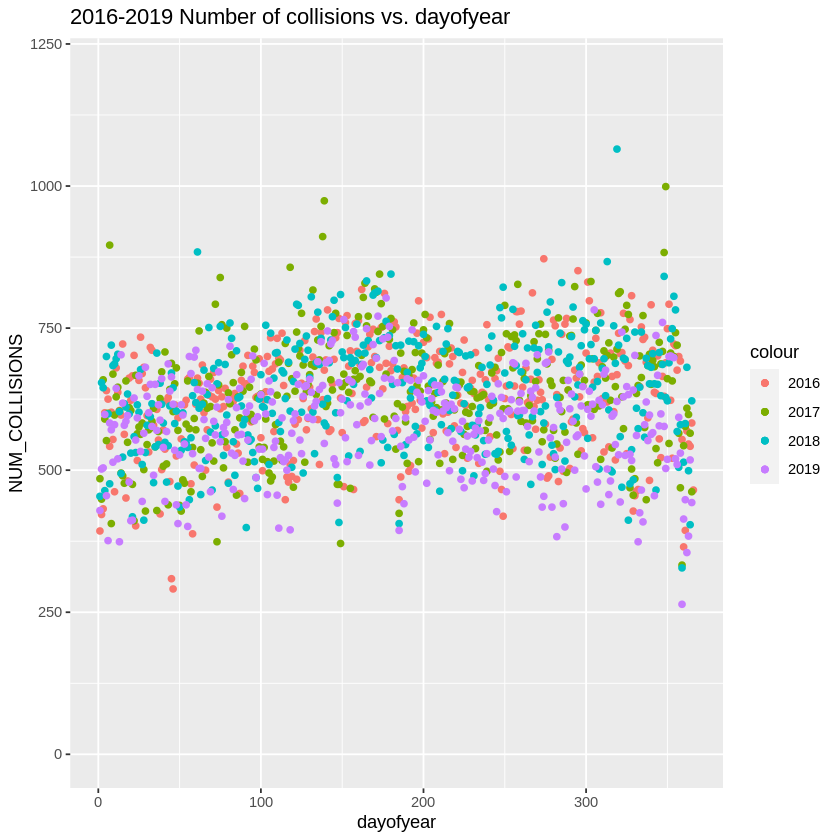

In [119]:
# plot the number of collisions vs. dayofyear for 2016-2019
ggplot() +
geom_point(data = collisions_v2_2016a, aes(dayofyear, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017a, aes(dayofyear, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018a, aes(dayofyear, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019a, aes(dayofyear, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayofyear") + ylim(0, 1200)

Based on the above charts, it can be concluded that values greater than or equal to 800 and less than or equal to 400 should be deleted.

In [120]:
# remove outliers less than or equal to 400 for NUM_COLLISIONS (2013-2019)
collisions_v2_2013b <- collisions_v2_2013a[which(collisions_v2_2013a$NUM_COLLISIONS >= 400), ]
collisions_v2_2014b <- collisions_v2_2014a[which(collisions_v2_2014a$NUM_COLLISIONS >= 400), ]
collisions_v2_2015b <- collisions_v2_2015a[which(collisions_v2_2015a$NUM_COLLISIONS >= 400), ]
collisions_v2_2016b <- collisions_v2_2016a[which(collisions_v2_2016a$NUM_COLLISIONS >= 400), ]
collisions_v2_2017b <- collisions_v2_2017a[which(collisions_v2_2017a$NUM_COLLISIONS >= 400), ]
collisions_v2_2018b <- collisions_v2_2018a[which(collisions_v2_2018a$NUM_COLLISIONS >= 400), ]
collisions_v2_2019b <- collisions_v2_2019a[which(collisions_v2_2019a$NUM_COLLISIONS >= 400), ]

In [121]:
# remove outliers greater than or equal to 800 for NUM_COLLISIONS (2013-2019)
collisions_v2_2013c <- collisions_v2_2013b[which(collisions_v2_2013b$NUM_COLLISIONS <= 800), ]
collisions_v2_2014c <- collisions_v2_2014b[which(collisions_v2_2014b$NUM_COLLISIONS <= 800), ]
collisions_v2_2015c <- collisions_v2_2015b[which(collisions_v2_2015b$NUM_COLLISIONS <= 800), ]
collisions_v2_2016c <- collisions_v2_2016b[which(collisions_v2_2016b$NUM_COLLISIONS <= 800), ]
collisions_v2_2017c <- collisions_v2_2017b[which(collisions_v2_2017b$NUM_COLLISIONS <= 800), ]
collisions_v2_2018c <- collisions_v2_2018b[which(collisions_v2_2018b$NUM_COLLISIONS <= 800), ]
collisions_v2_2019c <- collisions_v2_2019b[which(collisions_v2_2019b$NUM_COLLISIONS <= 800), ]

It is worth seeing what the data looks like after deleting outliers:

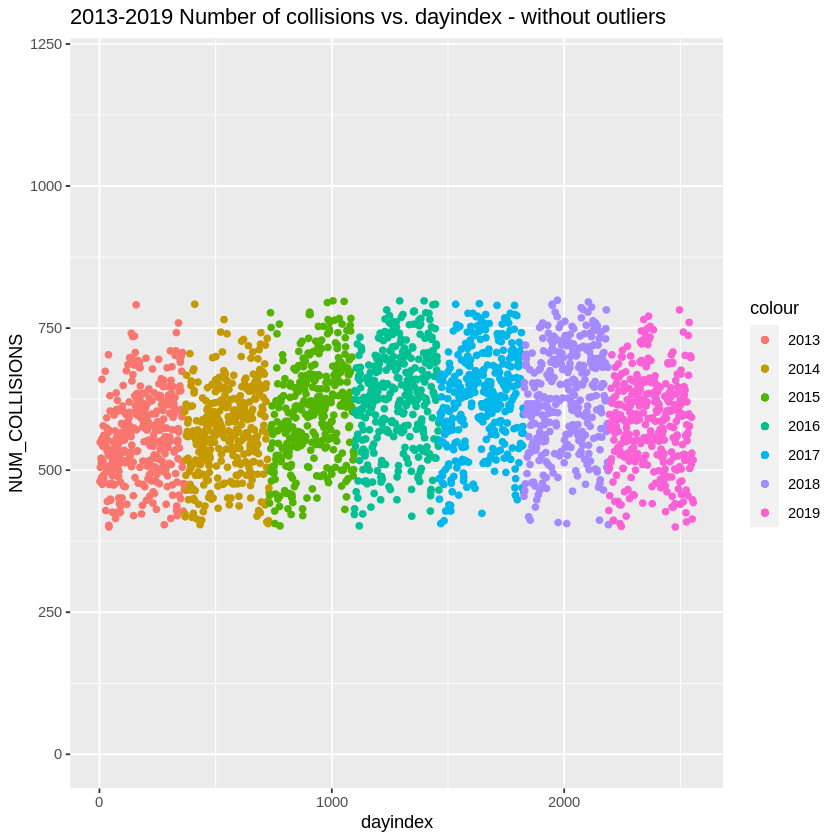

In [122]:
# plot the number of collisions vs. dayindex for 2013-2019 - without outliers
p1 <- ggplot() +
geom_point(data = collisions_v2_2013c, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014c, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015c, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
geom_point(data = collisions_v2_2016c, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017c, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018c, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019c, aes(dayindex, NUM_COLLISIONS, color = "2019"))

p1 + ylim(0, 1200) + ggtitle("2013-2019 Number of collisions vs. dayindex - without outliers")

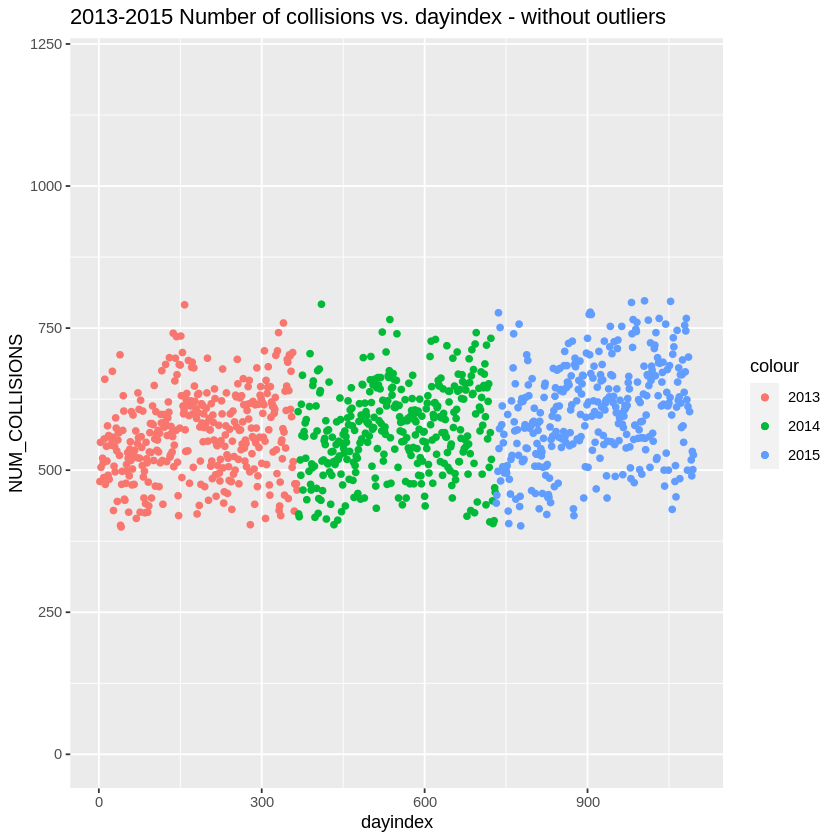

In [123]:
# plot the number of collisions vs. dayindex for 2013-2015 - without outliers
p2 <- ggplot() +
geom_point(data = collisions_v2_2013c, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014c, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015c, aes(dayindex, NUM_COLLISIONS, color = "2015"))

p2 + ylim(0, 1200) + ggtitle("2013-2015 Number of collisions vs. dayindex - without outliers")

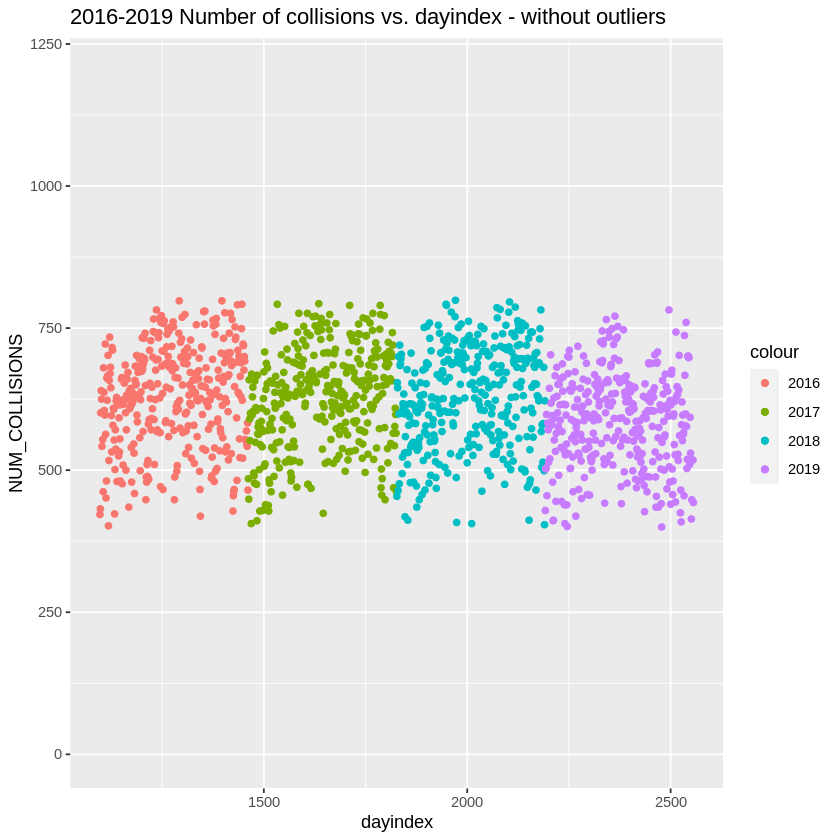

In [124]:
# plot the number of collisions vs. dayindex for 2016-2019 - without outliers
p3 <- ggplot() +
geom_point(data = collisions_v2_2016c, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017c, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018c, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019c, aes(dayindex, NUM_COLLISIONS, color = "2019"))

p3 + ylim(0, 1200) + ggtitle("2016-2019 Number of collisions vs. dayindex - without outliers")

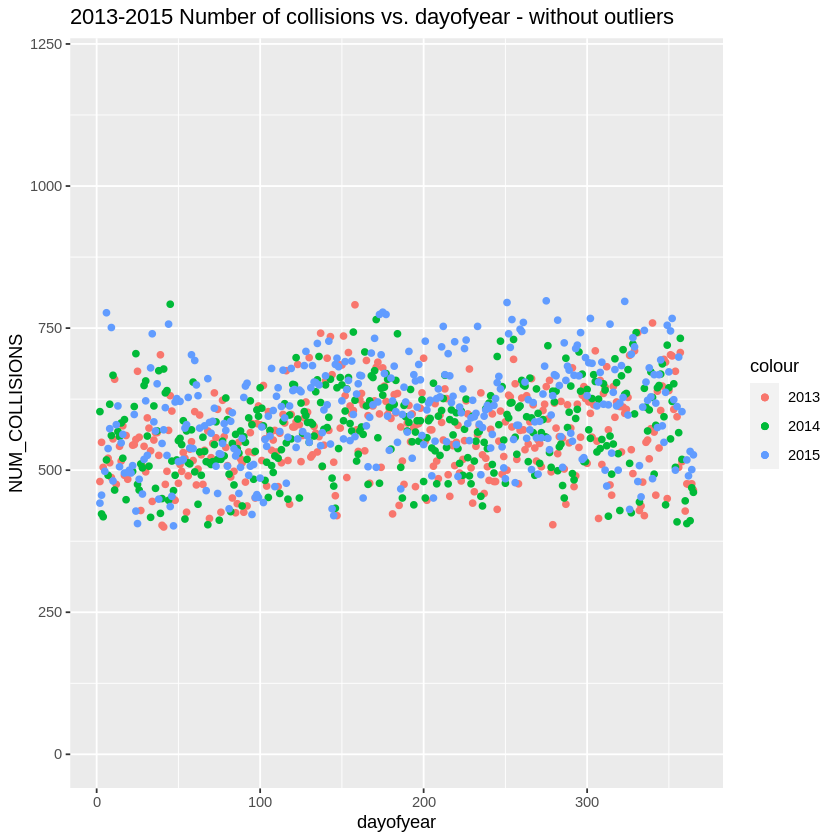

In [125]:
# plot the number of collisions vs. dayofyear for 2013-2015 - without outliers
p4 <- ggplot() +
geom_point(data = collisions_v2_2013c, aes(dayofyear, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014c, aes(dayofyear, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015c, aes(dayofyear, NUM_COLLISIONS, color = "2015"))

p4 + ylim(0, 1200) + ggtitle("2013-2015 Number of collisions vs. dayofyear - without outliers")


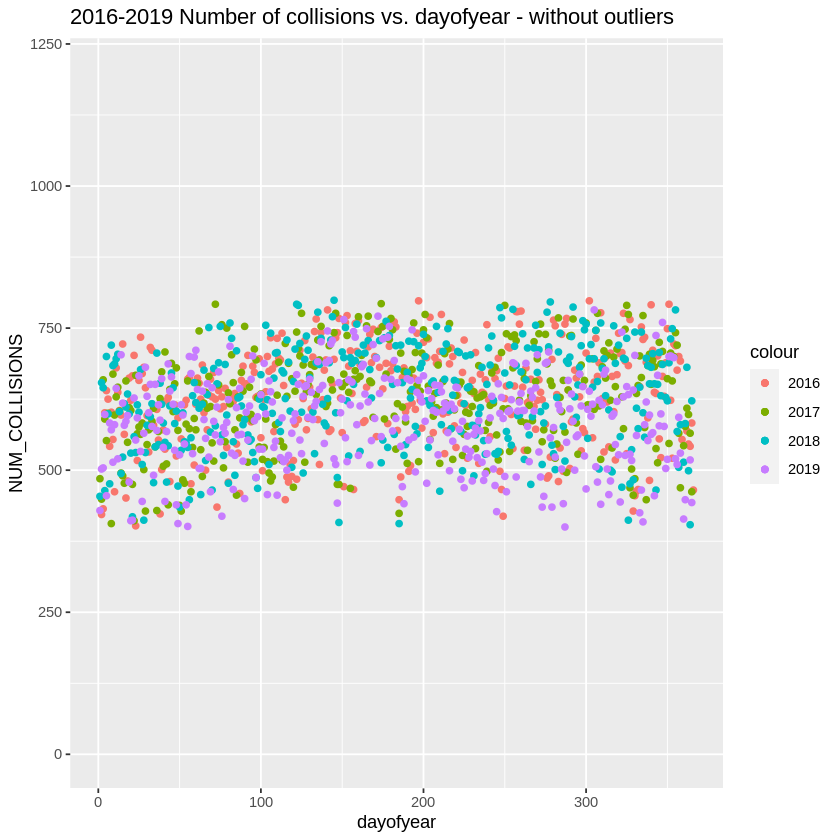

In [126]:
# plot the number of collisions vs. dayofyear for 2016-2019 - without outliers
p5 <- ggplot() +
geom_point(data = collisions_v2_2016c, aes(dayofyear, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017c, aes(dayofyear, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018c, aes(dayofyear, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019c, aes(dayofyear, NUM_COLLISIONS, color = "2019"))

p5 + ylim(0, 1200) + ggtitle("2016-2019 Number of collisions vs. dayofyear - without outliers")

Some outliers are still visible, however, to avoid deleting too much data, they will not be deleted.

#### **2. Data standardization**

> *Methodology*

For data standardization method called [Z-score](https://developers.google.com/machine-learning/data-prep/transform/normalization#z-score) will be used. This method rescales the data - the number of collisions in this case - that the mean of all collisions is zero and the standard deviation has a value 1. 

The formula for this method is:

**z = (𝑥 − 𝜇)/𝜎**

where x is the value, 𝜇 is the mean and 𝜎 is the standard deviation.

In other words we substract the mean of each value of number of collisions and we devide this by the standard deviation.

This report uses the R programming language, which has built-in data standardization function `scale()`. This function will be used to standardize the data in NUM_COLLISIONS column.

In [127]:
# save data as a new subsets for standardization for each year
collisions_v2_2013d <-  collisions_v2_2013c
collisions_v2_2014d <-  collisions_v2_2014c
collisions_v2_2015d <-  collisions_v2_2015c
collisions_v2_2016d <-  collisions_v2_2016c
collisions_v2_2017d <-  collisions_v2_2017c
collisions_v2_2018d <-  collisions_v2_2018c
collisions_v2_2019d <-  collisions_v2_2019c
# apply standardization formula on NUM_COLLISIONS data for each year
collisions_v2_2013d$NUM_COLLISIONS <- scale(collisions_v2_2013d$NUM_COLLISIONS)
collisions_v2_2014d$NUM_COLLISIONS <- scale(collisions_v2_2014d$NUM_COLLISIONS)
collisions_v2_2015d$NUM_COLLISIONS <- scale(collisions_v2_2015d$NUM_COLLISIONS)
collisions_v2_2016d$NUM_COLLISIONS <- scale(collisions_v2_2016d$NUM_COLLISIONS)
collisions_v2_2017d$NUM_COLLISIONS <- scale(collisions_v2_2017d$NUM_COLLISIONS)
collisions_v2_2018d$NUM_COLLISIONS <- scale(collisions_v2_2018d$NUM_COLLISIONS)
collisions_v2_2019d$NUM_COLLISIONS <- scale(collisions_v2_2019d$NUM_COLLISIONS)

The data after standardization has been saved under the new names for each year.

In the following subsection the data will be showed again after standardization proccess.

#### **3. Quick overview of the data after data standardization**

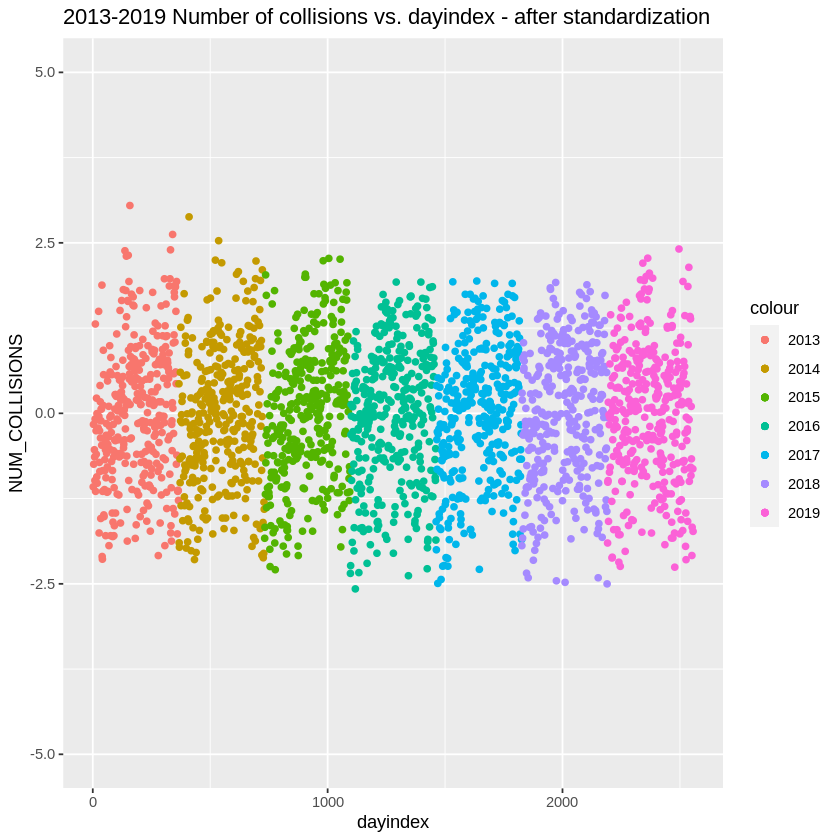

In [128]:
# plot the number of collisions vs. dayindex for 2013-2019 - after standardization
ggplot() +
geom_point(data = collisions_v2_2013d, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014d, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015d, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
geom_point(data = collisions_v2_2016d, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017d, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018d, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019d, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2013-2019 Number of collisions vs. dayindex - after standardization") + ylim(-5, 5)

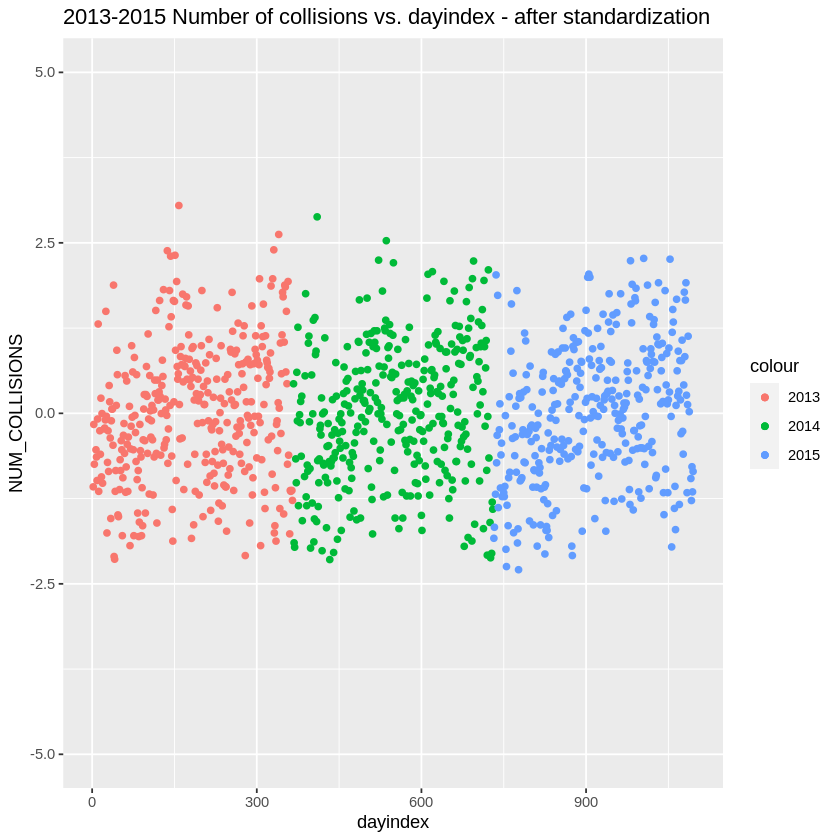

In [129]:
# plot the number of collisions vs. dayindex for 2013-2015 - after standardization
ggplot() +
geom_point(data = collisions_v2_2013d, aes(dayindex, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014d, aes(dayindex, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015d, aes(dayindex, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayindex - after standardization") + ylim(-5, 5)

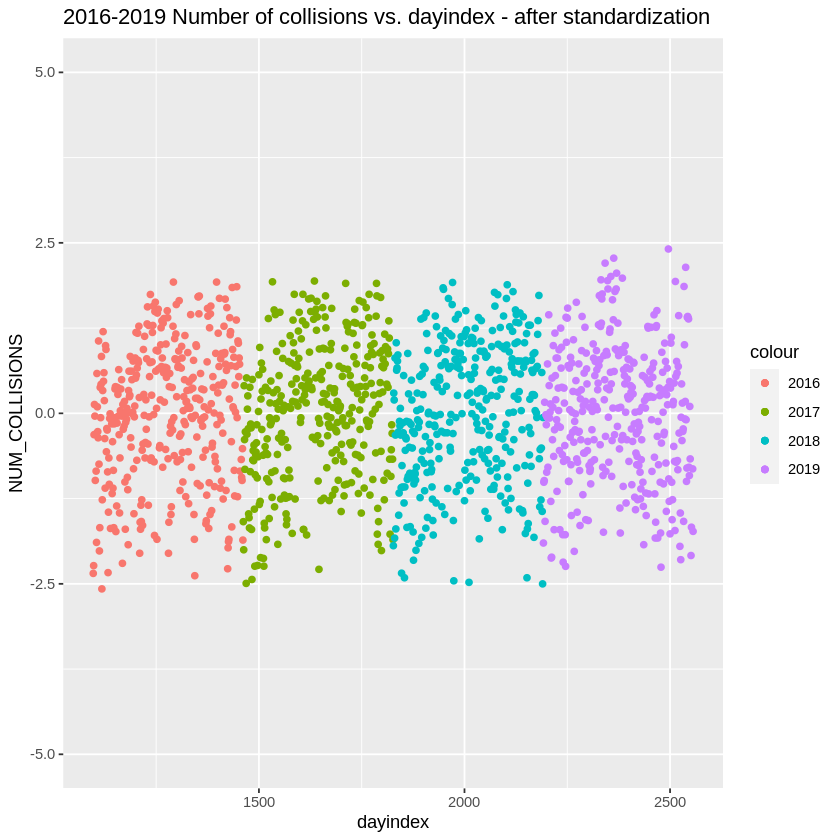

In [130]:
# plot the number of collisions vs. dayindex for 2016-2019 - after standardization
ggplot() +
geom_point(data = collisions_v2_2016d, aes(dayindex, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017d, aes(dayindex, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018d, aes(dayindex, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019d, aes(dayindex, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayindex - after standardization") + ylim(-5, 5)

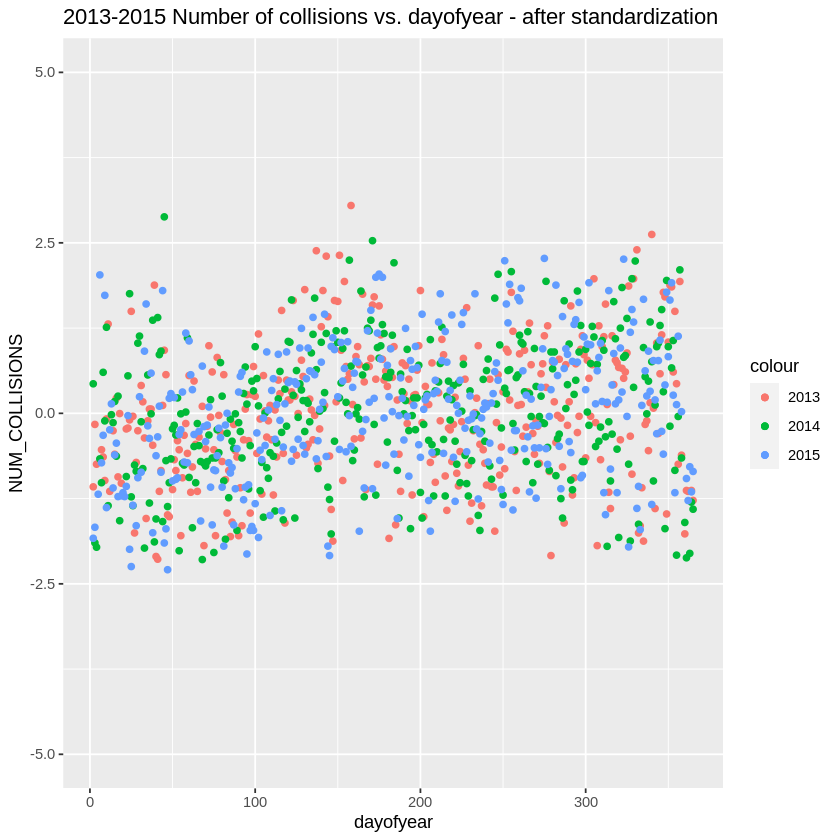

In [131]:
# plot the number of collisions vs. dayofyear for 2013-2015 - after standardization
ggplot() +
geom_point(data = collisions_v2_2013d, aes(dayofyear, NUM_COLLISIONS, color = "2013")) +
geom_point(data = collisions_v2_2014d, aes(dayofyear, NUM_COLLISIONS, color = "2014")) +
geom_point(data = collisions_v2_2015d, aes(dayofyear, NUM_COLLISIONS, color = "2015")) +
ggtitle("2013-2015 Number of collisions vs. dayofyear - after standardization") + ylim(-5, 5)


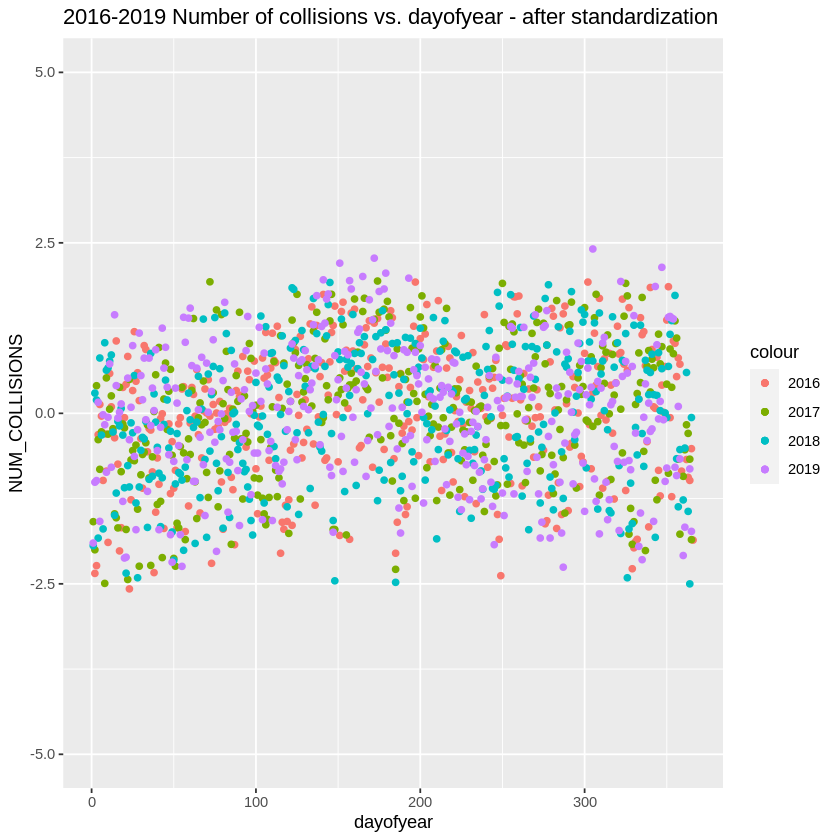

In [132]:
# plot the number of collisions vs. dayofyear for 2016-2019 - after standardization
ggplot() +
geom_point(data = collisions_v2_2016d, aes(dayofyear, NUM_COLLISIONS, color = "2016")) +
geom_point(data = collisions_v2_2017d, aes(dayofyear, NUM_COLLISIONS, color = "2017")) +
geom_point(data = collisions_v2_2018d, aes(dayofyear, NUM_COLLISIONS, color = "2018")) +
geom_point(data = collisions_v2_2019d, aes(dayofyear, NUM_COLLISIONS, color = "2019")) +
ggtitle("2016-2019 Number of collisions vs. dayofyear - after standardization") + ylim(-5, 5)

It is worth to check again relationship between the number of collisions and day of the week (for weekdays only). To do this we need to get rid of Saturday and Sunday from the subsets after data standardization.

In [133]:
# data after standardization without Saturdays and Sundays for each year
collisions_v2_2013e <- collisions_v2_2013d %>%
  filter(day < 6)
collisions_v2_2014e <- collisions_v2_2014d %>%
  filter(day < 6)
collisions_v2_2015e <- collisions_v2_2015d %>%
  filter(day < 6)
collisions_v2_2016e <- collisions_v2_2016d %>%
  filter(day < 6)
collisions_v2_2017e <- collisions_v2_2017d %>%
  filter(day < 6)
collisions_v2_2018e <- collisions_v2_2018d %>%
  filter(day < 6)
collisions_v2_2019e <- collisions_v2_2019d %>%
  filter(day < 6)
# merge subsets (after standardization) with weekdays into one
collisions_v3 <- rbind(collisions_v2_2013e, collisions_v2_2014e, collisions_v2_2015e, collisions_v2_2016e, collisions_v2_2017e, collisions_v2_2018e, collisions_v2_2019e)

The data for years between 2013 and 2019 without Saturdays and Sundays (weekdays only) have been saved as ***collisions_v3*** dataset.

`geom_smooth()` using formula 'y ~ x'



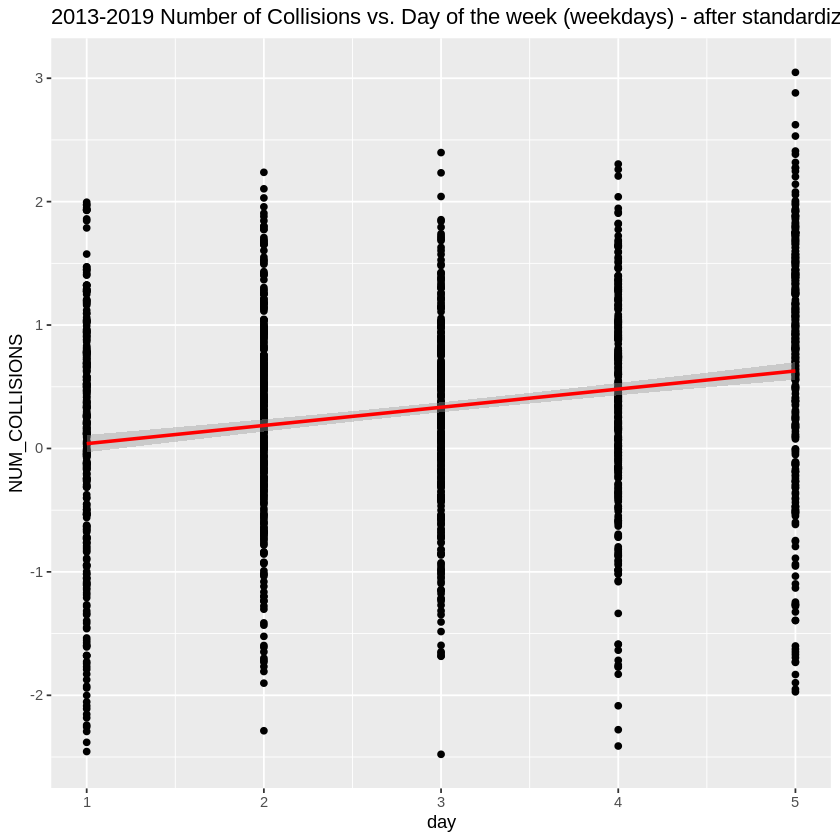

In [134]:
# plot day of the week (weekdays) vs. the number of collisions with geom_smooth() to see linear trend for 2013-2019 after standardization
ggplot(collisions_v3, aes(x = day, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red") +
  ggtitle("2013-2019 Number of Collisions vs. Day of the week (weekdays) - after standardization")

In [135]:
# correlation between day of the week (weekdays) and the number of collisions for 2013-2019 after standardization
cor(collisions_v3$day, collisions_v3$NUM_COLLISIONS)

0.2329192


This is a clear positive linear relationship between weekdays and the number of collisions. Correlation is not very strong, but can be used for our model.

`geom_smooth()` using formula 'y ~ x'



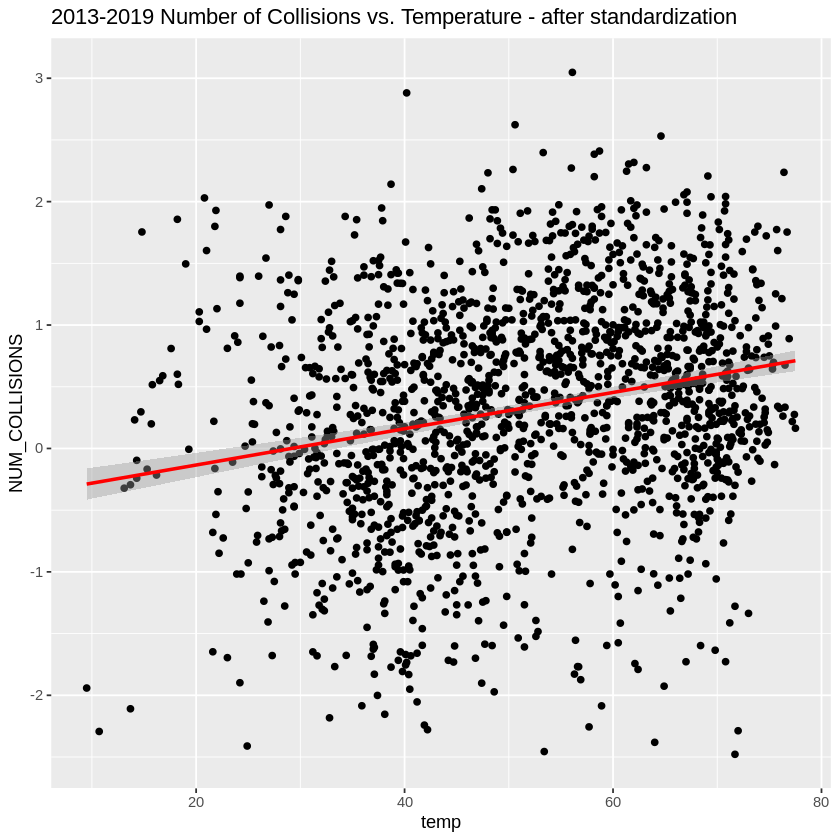

In [136]:
# plot temperature vs. the number of collisions with geom_smooth() to see linear trend for 2013-2019 after standardization
ggplot(collisions_v3, aes(x = temp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red") +
  ggtitle("2013-2019 Number of Collisions vs. Temperature - after standardization")

In [137]:
# correlation between temperature and the number of collisions for 2013-2019 after standardization
cor(collisions_v3$temp, collisions_v3$NUM_COLLISIONS)

0.2354892


Positive relationship between temperature and the number of collisions. Again, correlation is not very strong, but can be used.

`geom_smooth()` using formula 'y ~ x'



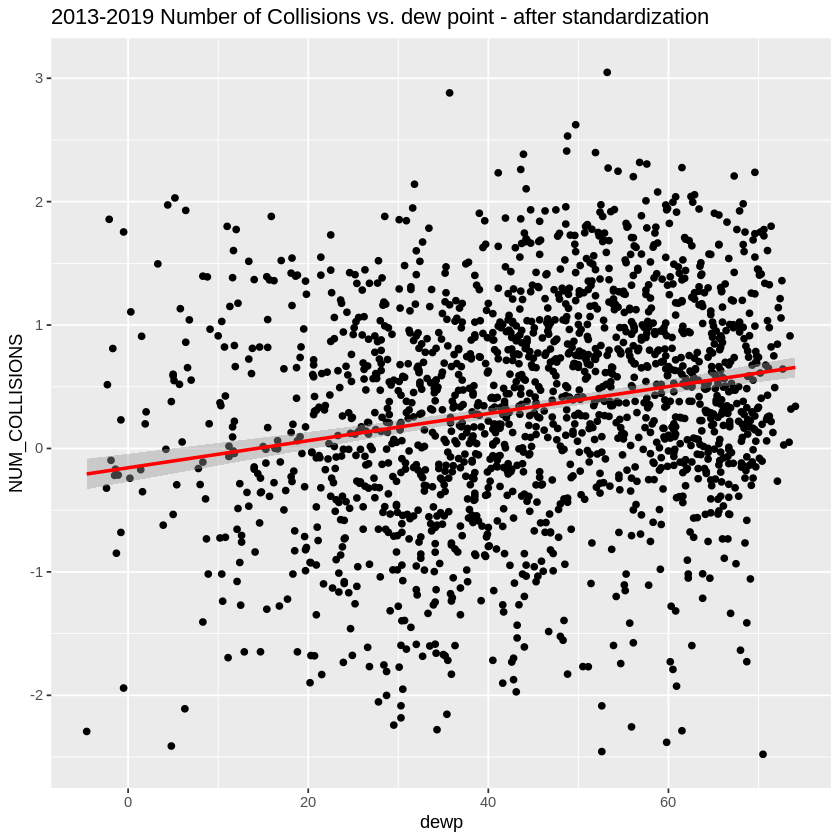

In [138]:
# plot dew point vs. the number of collisions with geom_smooth() to see linear trend for 2013-2019 after standardization
ggplot(collisions_v3, aes(x = dewp, y = NUM_COLLISIONS)) +
  geom_point() +
  geom_smooth(method=lm , color="red") +
  ggtitle("2013-2019 Number of Collisions vs. dew point - after standardization")

In [139]:
# correlation between temperature and the number of collisions for 2013-2019 after standardization
cor(collisions_v3$dewp, collisions_v3$NUM_COLLISIONS)

0.2117003


Similar conclusion as before: clear positive relationship and the value of correlation is not very significant.

#### **4. Normal distribution**

A histogram will be used to check the normal distribution of the number of vehicle collisions after data standardization.

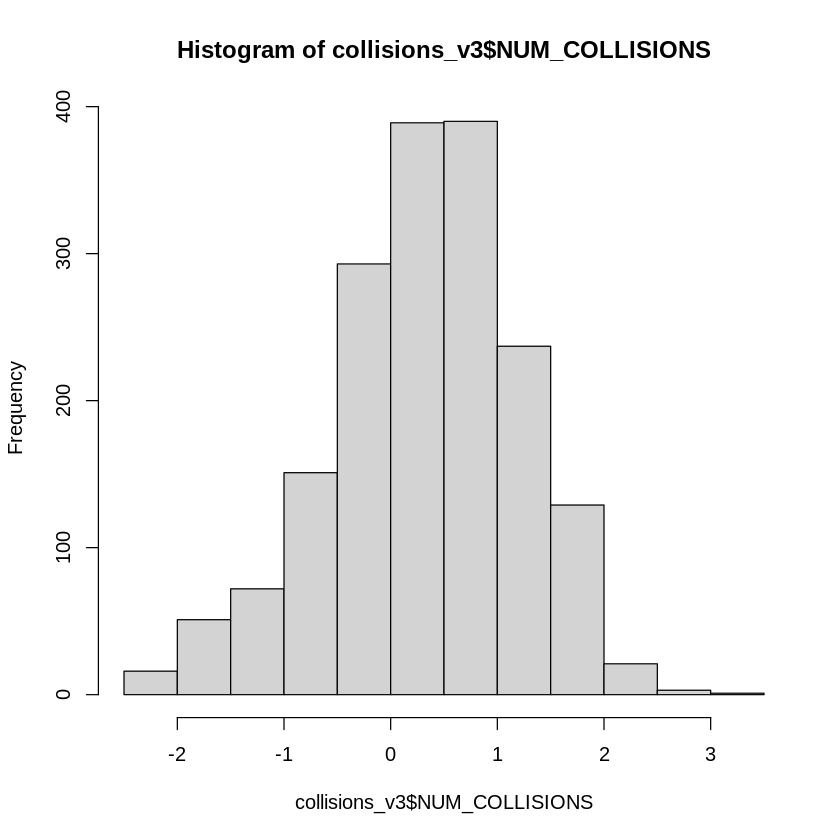

In [140]:
hist(collisions_v3$NUM_COLLISIONS)

The normal distribution of the number of collisions is good.

#### **5. The data for Linear Regression and DNN Regression models**

It is worth having the test data to test the model in Assignment Part Two. These data should not be included in the data prepared for linear regression and DNN regression models.

> #### **5a. The data for the Linear Regression Model**

For the Linear Regression Model the data for years 2012-2019 from following columns will be taken:

* *day* - day of the week (weekdays only)
* *temp* - temperature
* *dewp* - dew point
* *NUM_COLLISIONS* - the number of collisions

In [141]:
# see the head of main dataset for the Linear Regression Model
head(collisions_v3)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,"<dbl[,1]>"
1,2,2,3,2013,1,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,NA,0,-1.0777711
2,3,3,4,2013,1,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,NA,0,-0.1625106
3,4,4,5,2013,1,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,NA,0,-0.7461550
4,7,7,1,2013,1,7,2013-01-07,35.9,31.0,1020.5,8.8,8.5,17.1,22.0,42.1,28.0,0.01,NA,0,-0.5339207
5,8,8,2,2013,1,8,2013-01-08,39.8,34.1,1028.8,9.8,10.4,17.1,25.1,48.0,25.0,0.00,NA,0,-0.6400378
6,9,9,3,2013,1,9,2013-01-09,39.9,37.6,1026.2,6.8,5.3,11.1,NA,46.0,28.0,0.00,NA,1,-0.9849186


Next step is to select the data for day of the week, temperature, dew point and the number of collisions from *collisions_v3* dataset and save them.

In [142]:
# save the chosen data for the Linear Regression Model
data_for_linear_regression <- collisions_v3[,c("day", "temp", "dewp", "NUM_COLLISIONS")]

In [143]:
# see the head of data_for_linear_regression
head(data_for_linear_regression)

,day,temp,dewp,NUM_COLLISIONS
,<int>,<dbl>,<dbl>,"<dbl[,1]>"
1,3,27.5,12.1,-1.0777711
2,4,21.8,7.8,-0.1625106
3,5,32.2,21.1,-0.7461550
4,1,35.9,31.0,-0.5339207
5,2,39.8,34.1,-0.6400378
6,3,39.9,37.6,-0.9849186


> **Save the data for linear regression model**

In [144]:
# save the full data for linear regression model as csv file
write.csv(data_for_linear_regression, file="/content/data_for_linear_regression_full.csv")

The dataset for the Linear Regression Model has been saved in csv format, downloaded and then uploaded to my GitHub account [here](https://raw.githubusercontent.com/20023160uhi/20023160_Data_Analytics/main/data_for_linear_regression_full.csv)

> #### **5b. The data for DNN Regression Model**

The data for Deep Learning Neural Network should look a little different. For values such as day of the week and month a change for categorical data should be done:

* for the day of the week: Mon, Tue, etc. instead of 1, 2,...
* for the months of: Jan, Feb, etc. instead of 1, 2,...

One hot encoding will be used to apply these changes.

The data for DNN model will include all weather factors and other data in columns investigated earlier. The number of collisions do not need to be standarised, so subsets created before data standardization process will be used to create a dataset for this model. In this data all days of the week will be included.

In [145]:
# merge subsets created before data standardization
collisions_v4 <- rbind(collisions_v2_2013c, collisions_v2_2014c, collisions_v2_2015c, collisions_v2_2016c, collisions_v2_2017c, collisions_v2_2018c, collisions_v2_2019c) 

In [146]:
# see head of collisions_v4 dataset
head(collisions_v4)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
186,2,2,3,2013,1,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,NA,0,480
187,3,3,4,2013,1,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,NA,0,549
188,4,4,5,2013,1,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,NA,0,505
191,7,7,1,2013,1,7,2013-01-07,35.9,31.0,1020.5,8.8,8.5,17.1,22.0,42.1,28.0,0.01,NA,0,521
192,8,8,2,2013,1,8,2013-01-08,39.8,34.1,1028.8,9.8,10.4,17.1,25.1,48.0,25.0,0.00,NA,0,513
193,9,9,3,2013,1,9,2013-01-09,39.9,37.6,1026.2,6.8,5.3,11.1,NA,46.0,28.0,0.00,NA,1,487


Next step is to change months from numeric to text: 1 to Jan, 2 to Feb, 3 to Mar, etc.

In [147]:
# change months from numeric into text
collisions_v4$mo[collisions_v4$mo == 1] <- 'Jan'
collisions_v4$mo[collisions_v4$mo == 2] <- 'Feb'
collisions_v4$mo[collisions_v4$mo == 3] <- 'Mar'
collisions_v4$mo[collisions_v4$mo == 4] <- 'Apr'
collisions_v4$mo[collisions_v4$mo == 5] <- 'May'
collisions_v4$mo[collisions_v4$mo == 6] <- 'Jun'
collisions_v4$mo[collisions_v4$mo == 7] <- 'Jul'
collisions_v4$mo[collisions_v4$mo == 8] <- 'Aug'
collisions_v4$mo[collisions_v4$mo == 9] <- 'Sep'
collisions_v4$mo[collisions_v4$mo == 10] <- 'Oct'
collisions_v4$mo[collisions_v4$mo == 11] <- 'Nov'
collisions_v4$mo[collisions_v4$mo == 12] <- 'Dec'

Next, change day of the week from numeric to text, like 1 to Mon, 2 to Tue, etc.

In [148]:
# change day of the week from numeric into text
collisions_v4$day[collisions_v4$day == 1] <- 'Mon'
collisions_v4$day[collisions_v4$day == 2] <- 'Tue'
collisions_v4$day[collisions_v4$day == 3] <- 'Wed'
collisions_v4$day[collisions_v4$day == 4] <- 'Thu'
collisions_v4$day[collisions_v4$day == 5] <- 'Fri'
collisions_v4$day[collisions_v4$day == 6] <- 'Sat'
collisions_v4$day[collisions_v4$day == 7] <- 'Sun'

It is worth to see how this dataset looks like after these changes.

In [149]:
# see first 6 rows of collisions_v4
head(collisions_v4)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<chr>,<int>,<chr>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
186,2,2,Wed,2013,Jan,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,NA,0,480
187,3,3,Thu,2013,Jan,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,NA,0,549
188,4,4,Fri,2013,Jan,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,NA,0,505
191,7,7,Mon,2013,Jan,7,2013-01-07,35.9,31.0,1020.5,8.8,8.5,17.1,22.0,42.1,28.0,0.01,NA,0,521
192,8,8,Tue,2013,Jan,8,2013-01-08,39.8,34.1,1028.8,9.8,10.4,17.1,25.1,48.0,25.0,0.00,NA,0,513
193,9,9,Wed,2013,Jan,9,2013-01-09,39.9,37.6,1026.2,6.8,5.3,11.1,NA,46.0,28.0,0.00,NA,1,487


The changes made recently can be seen in the columns *day* and *mo*.

Next, the one hot encoding will be applied for months and days of the week.

In [150]:
# create matrix for months
months <- model.matrix(~0+collisions_v4$mo)
# see created matrix
head(months)

,collisions_v4$moApr,collisions_v4$moAug,collisions_v4$moDec,collisions_v4$moFeb,collisions_v4$moJan,collisions_v4$moJul,collisions_v4$moJun,collisions_v4$moMar,collisions_v4$moMay,collisions_v4$moNov,collisions_v4$moOct,collisions_v4$moSep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


In [151]:
# create matrix for days of the week
daysofweek <- model.matrix(~0+collisions_v4$day)
# see created matrix
head(daysofweek)

,collisions_v4$dayFri,collisions_v4$dayMon,collisions_v4$daySat,collisions_v4$daySun,collisions_v4$dayThu,collisions_v4$dayTue,collisions_v4$dayWed
1,0,0,0,0,0,0,1
2,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0
5,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1


The names of columns need to be changed.

In [152]:
# change column names for months
colnames(months) <- c("Apr", "Aug", "Dec", "Feb", "Jan", "Jul", "Jun", "Mar", "May", "Nov", "Oct", "Sep")
# see changes of column names
head(months)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


In [153]:
# change column names for daysofweek
colnames(daysofweek) <- c("Fri", "Mon", "Sat", "Sun", "Thu", "Tue", "Wed")
# see changes of column names
head(daysofweek)

,Fri,Mon,Sat,Sun,Thu,Tue,Wed
1,0,0,0,0,0,0,1
2,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0
4,0,1,0,0,0,0,0
5,0,0,0,0,0,1,0
6,0,0,0,0,0,0,1


At this point, the new data frame will be created with *months* and *daysofweek* datasets and columns from the *collisions_v4* dataset.

In [154]:
# create new dataset with months and daysofweek datasets and columns from collisions_v4 
data_for_dnn_regression <- data.frame(months, daysofweek, collisions_v4$year, collisions_v4$temp, collisions_v4$dewp, collisions_v4$slp, collisions_v4$visib, collisions_v4$wdsp, collisions_v4$mxpsd, collisions_v4$gust, collisions_v4$max, collisions_v4$min, collisions_v4$prcp, collisions_v4$sndp, collisions_v4$fog, collisions_v4$NUM_COLLISIONS)

In [155]:
head(data_for_dnn_regression)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,⋯,collisions_v4.visib,collisions_v4.wdsp,collisions_v4.mxpsd,collisions_v4.gust,collisions_v4.max,collisions_v4.min,collisions_v4.prcp,collisions_v4.sndp,collisions_v4.fog,collisions_v4.NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,0,0,0,0,1,0,0,0,0,0,⋯,10.0,12.4,15.9,25.1,33.1,21.9,0.00,NA,0,480
2,0,0,0,0,1,0,0,0,0,0,⋯,10.0,9.8,18.1,24.1,28.9,16.0,0.00,NA,0,549
3,0,0,0,0,1,0,0,0,0,0,⋯,10.0,11.3,22.0,29.9,41.0,24.1,0.00,NA,0,505
4,0,0,0,0,1,0,0,0,0,0,⋯,8.8,8.5,17.1,22.0,42.1,28.0,0.01,NA,0,521
5,0,0,0,0,1,0,0,0,0,0,⋯,9.8,10.4,17.1,25.1,48.0,25.0,0.00,NA,0,513
6,0,0,0,0,1,0,0,0,0,0,⋯,6.8,5.3,11.1,NA,46.0,28.0,0.00,NA,1,487


The column names have to be changed for recently created **data_for_dnn_regression** dataset. 

In [156]:
# change the names of other column names in data_for_dnn_regression dataset
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.year")] <- "year"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.temp")] <- "temp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.dewp")] <- "dewp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.slp")] <- "slp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.visib")] <- "visib"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.wdsp")] <- "wdsp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.mxpsd")] <- "mxpsd"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.gust")] <- "gust"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.max")] <- "max"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.min")] <- "min"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.prcp")] <- "prcp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.sndp")] <- "sndp"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.fog")] <- "fog"
colnames(data_for_dnn_regression)[which(names(data_for_dnn_regression) == "collisions_v4.NUM_COLLISIONS")] <- "NUM_COLLISIONS"

In [157]:
# see the changes applied above
summary(data_for_dnn_regression)

      Apr               Aug               Dec               Feb         
 Min.   :0.00000   Min.   :0.00000   Min.   :0.00000   Min.   :0.00000  
 1st Qu.:0.00000   1st Qu.:0.00000   1st Qu.:0.00000   1st Qu.:0.00000  
 Median :0.00000   Median :0.00000   Median :0.00000   Median :0.00000  
 Mean   :0.08371   Mean   :0.08861   Mean   :0.08126   Mean   :0.07758  
 3rd Qu.:0.00000   3rd Qu.:0.00000   3rd Qu.:0.00000   3rd Qu.:0.00000  
 Max.   :1.00000   Max.   :1.00000   Max.   :1.00000   Max.   :1.00000  
                                                                        
      Jan               Jul               Jun               Mar         
 Min.   :0.00000   Min.   :0.00000   Min.   :0.00000   Min.   :0.00000  
 1st Qu.:0.00000   1st Qu.:0.00000   1st Qu.:0.00000   1st Qu.:0.00000  
 Median :0.00000   Median :0.00000   Median :0.00000   Median :0.00000  
 Mean   :0.08003   Mean   :0.08738   Mean   :0.08003   Mean   :0.08575  
 3rd Qu.:0.00000   3rd Qu.:0.00000   3rd Qu.:0.0000

In [158]:
head(data_for_dnn_regression)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,⋯,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,0,0,0,0,1,0,0,0,0,0,⋯,10.0,12.4,15.9,25.1,33.1,21.9,0.00,NA,0,480
2,0,0,0,0,1,0,0,0,0,0,⋯,10.0,9.8,18.1,24.1,28.9,16.0,0.00,NA,0,549
3,0,0,0,0,1,0,0,0,0,0,⋯,10.0,11.3,22.0,29.9,41.0,24.1,0.00,NA,0,505
4,0,0,0,0,1,0,0,0,0,0,⋯,8.8,8.5,17.1,22.0,42.1,28.0,0.01,NA,0,521
5,0,0,0,0,1,0,0,0,0,0,⋯,9.8,10.4,17.1,25.1,48.0,25.0,0.00,NA,0,513
6,0,0,0,0,1,0,0,0,0,0,⋯,6.8,5.3,11.1,NA,46.0,28.0,0.00,NA,1,487


The dataset includes all 12 months (one column for each month) and all days of the week (one column for each day) as well as other columns which have been added before. The names of the columns have been changed correctly. The dataset *data_for_dnn_regression* is ready.

> **Save the data for DNN regression model**

In [159]:
# save the full data for DNN regression model as csv file
write.csv(data_for_dnn_regression, file="/content/data_for_dnn_regression_full.csv")

The dataset for the DNN Regression Model has been saved in csv format, downloaded and then uploaded to my GitHub account [here](https://raw.githubusercontent.com/20023160uhi/20023160_Data_Analytics/main/data_for_dnn_regression_full.csv)

## CONCULSIONS FOR PART 1

Based on the analysis, a positive relationship was found between the number of road collisions and such weather factors as temperature and dew point. However, the correlation index was not too high. There was also an increase in the number of collisions depending on the day of the week, but only from Monday to Friday. For Saturday and Sunday, this number drops significantly.

After replacing the missing values - which were written as a misleading numerical value - into NAs, it turned out that the snow depth data was very difficult to analyse due to the huge amount of missing values.

Seasonality in the number of traffic collisions over the year was also noticed.

Two datasets have been prepared - one for the linear regression model and the other for the DNN regression model. Data for linear regression includes the day of the week (weekends excluded), temperature, dew point, and number of traffic collisions after their standardization. In the dataset for DNN regression model it was decided to leave all weather factors and add day of the week matrix (categorical data) and month matrix (categorical data), year and the number of collisions before standardization.



## REFERENCES

 R Core Team (2020). R: A language and environment for statistical
computing. R Foundation for Statistical Computing, Vienna, Austria.
URL https://www.R-project.org/.

Wickham H (2016). ggplot2: Elegant Graphics for Data Analysis. Springer-Verlag New York. ISBN 978-3-319-24277-4, https://ggplot2.tidyverse.org.

Wickham et al., (2019). Welcome to the tidyverse. Journal of Open
Source Software, 4(43), 1686, https://doi.org/10.21105/joss.01686

Sarkar D (2008). Lattice: Multivariate Data Visualization with R. Springer, New York. ISBN 978-0-387-75968-5, http://lmdvr.r-forge.r-project.org. 

Data Preparation and Feature Engineering for Machine Learning [Normalization Techniques](https://developers.google.com/machine-learning/data-prep/transform/normalization)